In [23]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.preprocessing import FunctionTransformer
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import AvgPool1D
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras import regularizers
import warnings
warnings.filterwarnings('ignore')

In [24]:
sample = pd.read_csv(r'C:\Users\butel\OneDrive\Pulpit\Spaceship Titanic Data\sample_submission.csv')
df = pd.read_csv(r'C:\Users\butel\OneDrive\Pulpit\Spaceship Titanic Data\train.csv')
x_test = pd.read_csv(r'C:\Users\butel\OneDrive\Pulpit\Spaceship Titanic Data\test.csv')

In [25]:
#Cabin - Deck/Num/Side

def get_deck(Cabin):
    if Cabin is None or isinstance(Cabin, float):
        return None
    else:
        Cabin = Cabin.split('/')
        Deck = Cabin[0]
        return Deck
    
def get_num(Cabin):
    if Cabin is None or isinstance(Cabin, float):
        return None
    else:
        Cabin = Cabin.split('/')
        Num = Cabin[1]
        return Num

def get_side(Cabin):
    if Cabin is None or isinstance(Cabin, float):
        return None
    else:
        Cabin = Cabin.split('/')
        Side = Cabin[2]
        return Side
    
def get_group(PassengerId):
    if PassengerId is None or isinstance(PassengerId, float):
        return None
    else:
        PassengerId = PassengerId.split('_')
        Group = PassengerId[0]
        Group = Group.lstrip('0')
        return Group

In [26]:
df['Deck'] = df.apply(lambda x: get_deck(x.Cabin), axis = 1)
df['Num'] = df.apply(lambda x: get_num(x.Cabin), axis = 1)
df['Side'] = df.apply(lambda x: get_side(x.Cabin), axis = 1)
df['Group'] = df.apply(lambda x: get_group(x.PassengerId), axis = 1)

x_test['Deck'] = x_test.apply(lambda x: get_deck(x.Cabin), axis = 1)
x_test['Num'] = x_test.apply(lambda x: get_num(x.Cabin), axis = 1)
x_test['Side'] = x_test.apply(lambda x: get_side(x.Cabin), axis = 1)
x_test['Group'] = x_test.apply(lambda x: get_group(x.PassengerId), axis = 1)

In [27]:
Group_dict = {}
for Group in df.Group:
    if(Group in Group_dict):
        Group_dict[Group] += 1
    else:
        Group_dict[Group] = 1
        
for Group in x_test.Group:
    if(Group in Group_dict):
        Group_dict[Group] += 1
    else:
        Group_dict[Group] = 1

df['Persons_In_Group'] = [Group_dict[x] for x in df.Group]

In [28]:
Cabin_dict = {}
for Num in df.Num:
    if(Num in Cabin_dict):
        Cabin_dict[Num] += 1
    else:
        Cabin_dict[Num] = 1

for Num in x_test.Num:
    if(Num in Cabin_dict):
        Cabin_dict[Num] += 1
    else:
        Cabin_dict[Num] = 1
        
df['Persons_In_Cabin'] = [Cabin_dict[x] for x in df.Num]

In [29]:
x_test['Persons_In_Group'] = [Group_dict[x] for x in x_test.Group]
x_test['Persons_In_Cabin'] = [Cabin_dict[x] for x in x_test.Num]

In [30]:
df.Num = df.Num.astype(float)
df.Persons_In_Group = df.Persons_In_Group.astype(float)
df.Persons_In_Cabin = df.Persons_In_Cabin.astype(float)
x_test.Num = x_test.Num.astype(float)
x_test.Persons_In_Group = x_test.Persons_In_Group.astype(float)
x_test.Persons_In_Cabin = x_test.Persons_In_Cabin.astype(float)

In [31]:
df['Persons_In_Cabin'][df.Num.isna()] = 3  #median

In [18]:
#VISUALISATION OF ALL CORRELATIONS
profile_train = ProfileReport(df, title ='Train Data Report', config_file=None)
profile_train.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [32]:
num_cols = ['Age','RoomService', 'FoodCourt','ShoppingMall', 'Spa', 'VRDeck', 'Num', 'Persons_In_Group', 'Persons_In_Cabin']
cat_cols = ['HomePlanet', 'CryoSleep', 'Destination', 'VIP', 'Deck', 'Side']

In [33]:
x_train_use = df[num_cols + cat_cols]
y_train_use = df['Transported'].astype(int)

x_test_use = x_test[num_cols + cat_cols]
# y_test_use = y_test['Transported'].astype(int)

In [34]:
x_train_use

,Age,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Num,Persons_In_Group,Persons_In_Cabin,HomePlanet,CryoSleep,Destination,VIP,Deck,Side
0,39.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,25.0,Europa,False,TRAPPIST-1e,False,B,P
1,24.0,109.0,9.0,25.0,549.0,44.0,0.0,1.0,25.0,Earth,False,TRAPPIST-1e,False,F,S
2,58.0,43.0,3576.0,0.0,6715.0,49.0,0.0,2.0,25.0,Europa,False,TRAPPIST-1e,True,A,S
3,33.0,0.0,1283.0,371.0,3329.0,193.0,0.0,2.0,25.0,Europa,False,TRAPPIST-1e,False,A,S
4,16.0,303.0,70.0,151.0,565.0,2.0,1.0,1.0,20.0,Earth,False,TRAPPIST-1e,False,F,S
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,41.0,0.0,6819.0,0.0,1643.0,74.0,98.0,1.0,13.0,Europa,False,55 Cancri e,True,A,P
8689,18.0,0.0,0.0,0.0,0.0,0.0,1499.0,1.0,4.0,Earth,True,PSO J318.5-22,False,G,S
8690,26.0,0.0,0.0,1872.0,1.0,0.0,1500.0,1.0,5.0,Earth,False,TRAPPIST-1e,False,G,S
8691,32.0,0.0,1049.0,0.0,353.0,3235.0,608.0,2.0,6.0,Europa,False,55 Cancri e,False,E,S


In [35]:
num_pipeline = Pipeline(steps = [('impute', SimpleImputer(strategy = 'median')),
                                ('scale', MinMaxScaler())
                                ])

cat_pipeline = Pipeline(steps = [('impute', SimpleImputer(strategy = 'most_frequent')),
                                 ('one_hot', OneHotEncoder(handle_unknown='ignore', sparse=False))
    
])

In [36]:
col_trans = ColumnTransformer(transformers=[
    ('num_pipeline', num_pipeline, num_cols),
    ('cat_pipeline', cat_pipeline, cat_cols)
    ],
    remainder='drop',
    n_jobs=-1)

In [37]:
#PREVIOUS TRY OF PIPELINE

# def to_np_resize_func(Array):
#     Array = Array.reshape(Array.shape[0], Array.shape[1], 1)
#     return Array

# resizer = FunctionTransformer(to_np_resize_func)

# clf_pipeline = Pipeline(steps=[
#     ('col_trans', col_trans),
#     ('resize', resizer)
# ])

clf_pipeline = Pipeline(steps=[
    ('col_trans', col_trans)
])

In [38]:
clf_pipeline.fit(x_train_use)

Pipeline(steps=[('col_trans',
                 ColumnTransformer(n_jobs=-1,
                                   transformers=[('num_pipeline',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scale',
                                                                   MinMaxScaler())]),
                                                  ['Age', 'RoomService',
                                                   'FoodCourt', 'ShoppingMall',
                                                   'Spa', 'VRDeck', 'Num',
                                                   'Persons_In_Group',
                                                   'Persons_In_Cabin']),
                                                 ('cat_pipeline',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('one_hot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['HomePlanet', 'CryoSleep',
                                                   'Destination', 'VIP', 'Deck',
                                                   'Side'])]))])

In [22]:
trans_x_train = clf_pipeline.transform(x_train_use)
trans_x_test = clf_pipeline.transform(x_test_use)

In [21]:
model = tf.keras.models.Sequential(layers =[
    Dense(64, activation='sigmoid', input_shape = (trans_x_train.shape[1], ),
    kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4),
    bias_regularizer=regularizers.L2(1e-4),
    activity_regularizer=regularizers.L2(1e-5)),
    
    Dense(128, activation='sigmoid'),
    Dense(128, activation='sigmoid'),
    
    tf.keras.layers.Flatten(),
    Dense(2, activation='softmax')
])

In [22]:
model.compile(loss = 'sparse_categorical_crossentropy',
             optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
             metrics = ['accuracy']
             )

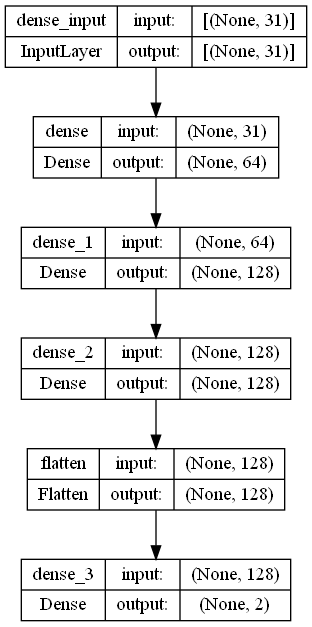

In [23]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [106]:
NUM_EPOCHS = 200
BATCH_SIZE = 256

hist = model.fit(trans_x_train, y_train_use, epochs=NUM_EPOCHS, batch_size = BATCH_SIZE)

plt.plot(hist.history['loss'])

Epoch 1/200
34/34 [==============================] - 1s 6ms/step - loss: 0.7027 - accuracy: 0.5104
Epoch 2/200
34/34 [==============================] - 0s 3ms/step - loss: 0.6890 - accuracy: 0.5660
Epoch 3/200
34/34 [==============================] - 0s 3ms/step - loss: 0.6646 - accuracy: 0.6265
Epoch 4/200
34/34 [==============================] - 0s 3ms/step - loss: 0.6088 - accuracy: 0.6972
Epoch 5/200
34/34 [==============================] - 0s 3ms/step - loss: 0.5663 - accuracy: 0.7191
Epoch 6/200
34/34 [==============================] - 0s 4ms/step - loss: 0.5571 - accuracy: 0.7248
Epoch 7/200
34/34 [==============================] - 0s 3ms/step - loss: 0.5521 - accuracy: 0.7292
Epoch 8/200
34/34 [==============================] - 0s 3ms/step - loss: 0.5476 - accuracy: 0.7335
Epoch 9/200
34/34 [==============================] - 0s 3ms/step - loss: 0.5470 - accuracy: 0.7317
Epoch 10/200
34/34 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.7362
Epoch 11/

34/34 [==============================] - 0s 3ms/step - loss: 0.4401 - accuracy: 0.7917
Epoch 84/200
34/34 [==============================] - 0s 4ms/step - loss: 0.4482 - accuracy: 0.7901
Epoch 85/200
34/34 [==============================] - 0s 4ms/step - loss: 0.4426 - accuracy: 0.7880
Epoch 86/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7939
Epoch 87/200
34/34 [==============================] - 0s 4ms/step - loss: 0.4443 - accuracy: 0.7911
Epoch 88/200
34/34 [==============================] - 0s 4ms/step - loss: 0.4401 - accuracy: 0.7913
Epoch 89/200
34/34 [==============================] - 0s 4ms/step - loss: 0.4397 - accuracy: 0.7932
Epoch 90/200
34/34 [==============================] - 0s 4ms/step - loss: 0.4402 - accuracy: 0.7933
Epoch 91/200
34/34 [==============================] - 0s 4ms/step - loss: 0.4375 - accuracy: 0.7936
Epoch 92/200
34/34 [==============================] - 0s 4ms/step - loss: 0.4390 - accuracy: 0.7956
Epoch 93/200


In [130]:
hist.history['accuracy'][-1]

0.7693546414375305

In [129]:
max(hist.history['accuracy'])

0.7726906538009644

In [131]:
max_accuracy = 0
answers = []

for dense_1 in [32, 64, 128, 256]:
    for dense_2 in [1, 32, 64, 128, 256]:
        for dense_3 in [1, 32, 64, 128, 256, 512]:
            for dense_4 in [1, 32, 64, 128, 256, 512]:
                model = tf.keras.models.Sequential(layers =[
                        Dense(dense_1, activation='sigmoid', input_shape = (trans_x_train.shape[1], ),
                        kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4),
                        bias_regularizer=regularizers.L2(1e-4),
                        activity_regularizer=regularizers.L2(1e-5)),

                        Dense(dense_2, activation='sigmoid'),
                        
                        Dense(dense_3, activation='sigmoid'),
                    
                        Dense(dense_4, activation='sigmoid'),

                        tf.keras.layers.Flatten(),
                        Dense(2, activation='softmax')
                    ])
                model.compile(loss = 'sparse_categorical_crossentropy',
                              optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
                              metrics = ['accuracy']
                 )
                
                NUM_EPOCHS = 300
                BATCH_SIZE = 256

                hist = model.fit(trans_x_train, y_train_use, epochs=NUM_EPOCHS, batch_size = BATCH_SIZE)
                
                if(hist.history['accuracy'][-1] > max_accuracy):
                    max_accuracy = hist.history['accuracy'][-1]
                    print(f'Units: Dense1 - {dense_1}, Dense2 - {dense_2}, Dense3 - {dense_3}, Dense4 - {dense_4}; accuracy = {max_accuracy}')
                
                answers.append([max_accuracy, dense_1, dense_2, dense_3, dense_4])

Epoch 1/300
34/34 [==============================] - 0s 4ms/step - loss: 0.7221 - accuracy: 0.4964
Epoch 2/300
34/34 [==============================] - 0s 4ms/step - loss: 0.7111 - accuracy: 0.4964
Epoch 3/300
34/34 [==============================] - 0s 4ms/step - loss: 0.7039 - accuracy: 0.4964
Epoch 4/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6993 - accuracy: 0.4964
Epoch 5/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6966 - accuracy: 0.4964
Epoch 6/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6951 - accuracy: 0.4964
Epoch 7/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6942 - accuracy: 0.4964
Epoch 8/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6937 - accuracy: 0.4964
Epoch 9/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6934 - accuracy: 0.4964
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5723
Epoch 11/

34/34 [==============================] - 0s 3ms/step - loss: 0.5386 - accuracy: 0.7733
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5362 - accuracy: 0.7742
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5342 - accuracy: 0.7779
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5330 - accuracy: 0.7766
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5306 - accuracy: 0.7791
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5285 - accuracy: 0.7794
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5271 - accuracy: 0.7792
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5255 - accuracy: 0.7769
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5235 - accuracy: 0.7807
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5215 - accuracy: 0.7812
Epoch 93/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7906
Epoch 246/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4495 - accuracy: 0.7928
Epoch 247/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4485 - accuracy: 0.7927
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7906
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7936
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.7924
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7947
Epoch 252/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4486 - accuracy: 0.7919
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7928
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7920
Epoc

Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.4914
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5042
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4968
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.4989
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4973
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4964
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5051
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4952
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5018
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5011
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4990
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.4983
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5070
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4883
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5007
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.4951
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.4936
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.4894
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.4956
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4987
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5050
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5065
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5040
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4949
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4886
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4976
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5005
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5052
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4993
Epoch 60/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7886
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7872
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7889
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7903
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4479 - accuracy: 0.7881
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7905
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4462 - accuracy: 0.7902
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4451 - accuracy: 0.7918
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7894
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4444 - accuracy: 0.7891
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.5152 - accuracy: 0.7546
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5120 - accuracy: 0.7585
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5118 - accuracy: 0.7579
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5125 - accuracy: 0.7580
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5128 - accuracy: 0.7573
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5116 - accuracy: 0.7580
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5117 - accuracy: 0.7575
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5106 - accuracy: 0.7589
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5122 - accuracy: 0.7581
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5112 - accuracy: 0.7606
Epoch 84/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7971
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7962
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7989
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7925
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7902
Epoch 241/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4302 - accuracy: 0.7963
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7955
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7949
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7941
Epoch 245/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4299 - accuracy: 0.7986
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7668
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4945 - accuracy: 0.7689
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7702
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.7737
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4837 - accuracy: 0.7776
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4800 - accuracy: 0.7760
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4775 - accuracy: 0.7806
Epoch 106/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4748 - accuracy: 0.7799
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4739 - accuracy: 0.7812
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4720 - accuracy: 0.7825
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7964
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7950
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7963
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7941
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7971
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7916
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7973
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7947
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7929
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7990
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4685 - accuracy: 0.7829
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7837
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.7855
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4625 - accuracy: 0.7835
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4611 - accuracy: 0.7880
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4665 - accuracy: 0.7811
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4620 - accuracy: 0.7861
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4615 - accuracy: 0.7871
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4599 - accuracy: 0.7879
Epoch 132/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4593 - accuracy: 0.7867
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4279 - accuracy: 0.7988
Epoch 286/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4295 - accuracy: 0.7974
Epoch 287/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4293 - accuracy: 0.7951
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7972
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7985
Epoch 290/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4275 - accuracy: 0.8003
Epoch 291/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4281 - accuracy: 0.7926
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7945
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7970
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7964
Epoc

Epoch 67/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4897 - accuracy: 0.7867
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.7837
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4893 - accuracy: 0.7830
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7885
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7883
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4826 - accuracy: 0.7897
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4815 - accuracy: 0.7886
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4807 - accuracy: 0.7901
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4805 - accuracy: 0.7897
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4804 - accuracy: 0.7891


34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7939
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7927
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7922
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7937
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7931
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.7920
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7908
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7922
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.7901
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7921
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4695 - accuracy: 0.7817
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4679 - accuracy: 0.7824
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4650 - accuracy: 0.7834
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4632 - accuracy: 0.7863
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4641 - accuracy: 0.7827
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4611 - accuracy: 0.7871
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4641 - accuracy: 0.7860
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7855
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4623 - accuracy: 0.7844
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4589 - accuracy: 0.7878
Epoch 101/30

34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7980
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7987
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7996
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7960
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7960
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7936
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.8003
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7962
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7914
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7942
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7882
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4582 - accuracy: 0.7856
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4566 - accuracy: 0.7865
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7868
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.7911
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7875
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7896
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4546 - accuracy: 0.7863
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4541 - accuracy: 0.7898
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.7895
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7988
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7964
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7965
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7949
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7939
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7978
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7971
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7956
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7995
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7983
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4462 - accuracy: 0.7897
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7896
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7905
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7885
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7889
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7894
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7898
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7927
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.7899
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7908
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7079 - accuracy: 0.5029
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6977 - accuracy: 0.4990
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6977 - accuracy: 0.5006
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6966 - accuracy: 0.5016
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.5007
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6980 - accuracy: 0.5072
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6960 - accuracy: 0.5109
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.4975
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5011
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5018
Epoch 11/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7924
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7903
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7911
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7926
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7902
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7954
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7914
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7899
Epoch 172/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7911
Epoch 173/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7927
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5279 - accuracy: 0.7404
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5281 - accuracy: 0.7466
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5289 - accuracy: 0.7431
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5255 - accuracy: 0.7459
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5294 - accuracy: 0.7416
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5269 - accuracy: 0.7472
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5280 - accuracy: 0.7437
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5287 - accuracy: 0.7423
Epoch 34/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5270 - accuracy: 0.7452
Epoch 35/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5236 - accuracy: 0.7488
Epoch 36/300


Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4580 - accuracy: 0.7887
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4587 - accuracy: 0.7855
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.7868
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7876
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.7879
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.7866
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.7822
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4674 - accuracy: 0.7813
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4627 - accuracy: 0.7859
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4569 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7937
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7894
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7950
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7909
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7876
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7920
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7920
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7883
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7935
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7940
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5213 - accuracy: 0.7562
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7554
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5195 - accuracy: 0.7567
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5191 - accuracy: 0.7591
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5174 - accuracy: 0.7591
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5165 - accuracy: 0.7593
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5166 - accuracy: 0.7564
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5150 - accuracy: 0.7564
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5153 - accuracy: 0.7598
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5142 - accuracy: 0.7581
Epoch 61/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.7735
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4857 - accuracy: 0.7749
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7756
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7759
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7757
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7733
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7760
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7735
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7737
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4853 - accuracy: 0.7779
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7598
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5122 - accuracy: 0.7569
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5126 - accuracy: 0.7596
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5148 - accuracy: 0.7573
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5123 - accuracy: 0.7582
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7574
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5107 - accuracy: 0.7605
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5103 - accuracy: 0.7603
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7567
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5093 - accuracy: 0.7583
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7939
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7968
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7966
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7970
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7986
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.8009
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8011
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.8004
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7978
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7949
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7865
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4546 - accuracy: 0.7891
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4548 - accuracy: 0.7876
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7872
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.7922
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7866
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.7858
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.7880
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7911
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7889
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.8005
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7989
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7996
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7998
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7978
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8000
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7952
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7916
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7920
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7965
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4460 - accuracy: 0.7870
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7940
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.7918
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7925
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7905
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7897
Epoch 131/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4416 - accuracy: 0.7905
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7898
Epoch 133/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4410 - accuracy: 0.7918
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7904
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7965
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7982
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8003
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7914
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7943
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7934
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7979
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7988
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7987
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7922
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.5004 - accuracy: 0.7649
Epoch 70/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4984 - accuracy: 0.7679
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7674
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.7702
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7700
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7736
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4841 - accuracy: 0.7720
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4766 - accuracy: 0.7787
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4778 - accuracy: 0.7778
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4718 - accuracy: 0.7781
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7922
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7950
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8004
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7987
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7880
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7928
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7882
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7974
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7960
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.8004
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.7883
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4629 - accuracy: 0.7893
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4659 - accuracy: 0.7822
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.7832
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4605 - accuracy: 0.7880
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7870
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4619 - accuracy: 0.7830
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.7891
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4596 - accuracy: 0.7855
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4654 - accuracy: 0.7852
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7909
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7939
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7948
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7963
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7955
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7874
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7929
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7972
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7879
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7973
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7674
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7700
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7744
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4950 - accuracy: 0.7697
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.7646
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4939 - accuracy: 0.7695
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7715
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.7729
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4939 - accuracy: 0.7698
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.7698
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7740
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7746
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4843 - accuracy: 0.7748
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4838 - accuracy: 0.7775
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4833 - accuracy: 0.7757
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7764
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4839 - accuracy: 0.7774
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4836 - accuracy: 0.7759
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4847 - accuracy: 0.7748
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4837 - accuracy: 0.7765
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7882
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7887
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.7873
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7913
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7888
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7901
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7889
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7874
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4478 - accuracy: 0.7906
Epoch 151/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7898
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6976 - accuracy: 0.4994
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5044
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.4887
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6930 - accuracy: 0.5114
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6914 - accuracy: 0.5195
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6871 - accuracy: 0.5527
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6740 - accuracy: 0.6651
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6526 - accuracy: 0.6923
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6186 - accuracy: 0.7229
Epoch 13/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5858 - accuracy: 0.7262
Epoch 14/300
34/34

34/34 [==============================] - 0s 3ms/step - loss: 0.4714 - accuracy: 0.7809
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4688 - accuracy: 0.7811
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4687 - accuracy: 0.7820
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4664 - accuracy: 0.7838
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4659 - accuracy: 0.7842
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4709 - accuracy: 0.7824
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4671 - accuracy: 0.7820
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4630 - accuracy: 0.7857
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4643 - accuracy: 0.7870
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.7865
Epoch 96/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7935
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7991
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7963
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7963
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7966
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7925
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7943
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7993
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7983
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7936
Epoc

Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7889
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4568 - accuracy: 0.7876
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.7887
Epoch 113/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4570 - accuracy: 0.7868
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7878
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.7882
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7890
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7889
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7918
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4550 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7880
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4433 - accuracy: 0.7903
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7911
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.7894
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7925
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7919
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7867
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7898
Epoch 199/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7834
Epoch 200/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.7882
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5196 - accuracy: 0.7503
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5197 - accuracy: 0.7513
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5183 - accuracy: 0.7537
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5250 - accuracy: 0.7480
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7523
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5184 - accuracy: 0.7537
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5177 - accuracy: 0.7552
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5177 - accuracy: 0.7536
Epoch 61/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5184 - accuracy: 0.7566
Epoch 62/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5159 - accuracy: 0.7565
Epoch 63/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7834
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7968
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7888
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.8002
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7891
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7882
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7865
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7966
Epoch 223/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7935
Epoch 224/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7956
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5087 - accuracy: 0.7603
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5152 - accuracy: 0.7559
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5130 - accuracy: 0.7564
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5137 - accuracy: 0.7587
Epoch 82/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5089 - accuracy: 0.7600
Epoch 83/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5000 - accuracy: 0.7683
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.7660
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7704
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4929 - accuracy: 0.7699
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7757
Epoch 88/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7942
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7868
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7926
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7934
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7966
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7922
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7947
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7958
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7955
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7995
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4819 - accuracy: 0.7952
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.7909
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4825 - accuracy: 0.7921
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4809 - accuracy: 0.7962
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4816 - accuracy: 0.7929
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4822 - accuracy: 0.7932
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7894
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4824 - accuracy: 0.7935
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4814 - accuracy: 0.7921
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4811 - accuracy: 0.7941
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7925
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.7940
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4761 - accuracy: 0.7947
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7931
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4769 - accuracy: 0.7908
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4820 - accuracy: 0.7876
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7929
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4753 - accuracy: 0.7935
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4751 - accuracy: 0.7947
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4757 - accuracy: 0.7942
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7866
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7904
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4578 - accuracy: 0.7837
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7893
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7878
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7903
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7896
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7895
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7905
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7920
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7987
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.8021
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7967
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7943
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7929
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7954
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7972
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7991
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7970
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7935
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7639
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7664
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4946 - accuracy: 0.7667
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4885 - accuracy: 0.7723
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4858 - accuracy: 0.7760
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4825 - accuracy: 0.7767
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.7796
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7786
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4748 - accuracy: 0.7824
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7779
Epoch 81/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7932
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7952
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7916
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7906
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7902
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7973
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7957
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7895
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7936
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7947
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.7867
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.7832
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4716 - accuracy: 0.7758
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7850
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4615 - accuracy: 0.7824
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7916
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7865
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7878
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.7865
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.7861
Epoch 1

34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7955
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7951
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7905
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7882
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7982
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7963
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8003
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7957
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7951
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7951
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7813
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4617 - accuracy: 0.7861
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4581 - accuracy: 0.7873
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4566 - accuracy: 0.7872
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7882
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7908
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4563 - accuracy: 0.7852
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.7856
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.7879
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4671 - accuracy: 0.7796
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4328 - accuracy: 0.7935
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7943
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7958
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7936
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7888
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7906
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7879
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7922
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7919
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7967
Epoc

Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5192 - accuracy: 0.7559
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5195 - accuracy: 0.7519
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5202 - accuracy: 0.7531
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5210 - accuracy: 0.7537
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5201 - accuracy: 0.7549
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5167 - accuracy: 0.7566
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5153 - accuracy: 0.7570
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5164 - accuracy: 0.7518
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5117 - accuracy: 0.7606
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5155 - accuracy: 0.7590


34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7916
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7963
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7827
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7909
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7887
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7826
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7810
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7943
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7973
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7960
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 99/300


34/34 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 255/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4555 - accuracy: 0.7886
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7876
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4602 - accuracy: 0.7822
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7905
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.7897
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4580 - accuracy: 0.7858
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7887
Epoch 120/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4543 - accuracy: 0.7891
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7922
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7886
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7975
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7973
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7922
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7977
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7970
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7950
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7987
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7893
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7948
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7989
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7857
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7901
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.7851
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7898
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.7902
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.7857
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7870
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4478 - accuracy: 0.7873
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.7919
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4595 - accuracy: 0.7837
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.8002
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7936
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7194 - accuracy: 0.5027
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6989 - accuracy: 0.4998
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6991 - accuracy: 0.5009
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6976 - accuracy: 0.4997
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.4929
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7041 - accuracy: 0.5029
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6986 - accuracy: 0.5016
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6976 - accuracy: 0.5058
Epoch 9/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7908
Epoch 163/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7883
Epoch 164/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7901
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4433 - accuracy: 0.7784
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7896
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7944
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7927
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7888
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7941
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7967
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5646 - accuracy: 0.7180
Epoch 25/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5452 - accuracy: 0.7269
Epoch 26/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5370 - accuracy: 0.7320
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5345 - accuracy: 0.7328
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5336 - accuracy: 0.7340
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5304 - accuracy: 0.7374
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5286 - accuracy: 0.7415
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5283 - accuracy: 0.7403
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.7404
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5436 - accuracy: 0.7269
Epoch 34/300


Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.7867
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4637 - accuracy: 0.7860
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4718 - accuracy: 0.7810
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4650 - accuracy: 0.7789
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4616 - accuracy: 0.7843
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4602 - accuracy: 0.7867
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4777 - accuracy: 0.7783
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4623 - accuracy: 0.7857
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4624 - accuracy: 0.7830
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4538 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7911
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7883
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.7899
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7893
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7901
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7896
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7905
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7859
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7903
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7888
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5294 - accuracy: 0.7473
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5246 - accuracy: 0.7499
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5264 - accuracy: 0.7473
Epoch 52/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5246 - accuracy: 0.7484
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5229 - accuracy: 0.7498
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5287 - accuracy: 0.7469
Epoch 55/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5228 - accuracy: 0.7503
Epoch 56/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5207 - accuracy: 0.7538
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5237 - accuracy: 0.7489
Epoch 58/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5219 - accuracy: 0.7516
Epoch 59/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7905
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7887
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7943
Epoch 214/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4415 - accuracy: 0.7894
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7818
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7904
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7948
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7821
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7934
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7924
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 75/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 76/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 77/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6933 - accuracy: 0.5009
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 84/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4945 - accuracy: 0.7709
Epoch 100/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4944 - accuracy: 0.7711
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4949 - accuracy: 0.7710
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7685
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4950 - accuracy: 0.7669
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.7688
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7718
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7705
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7717
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4958 - accuracy: 0.7684
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7744
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4875 - accuracy: 0.7740
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.7760
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.7756
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7773
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7756
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.7751
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.7738
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4865 - accuracy: 0.7759
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7773
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4945 - accuracy: 0.7700
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4952 - accuracy: 0.7683
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.7717
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7732
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7729
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7720
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4929 - accuracy: 0.7709
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.7722
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7697
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4951 - accuracy: 0.7722
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.7758
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7710
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.7764
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7751
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7773
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7730
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4871 - accuracy: 0.7769
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7737
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7711
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.7757
Epoc

Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5008 - accuracy: 0.7650
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5029 - accuracy: 0.7651
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5024 - accuracy: 0.7646
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5006 - accuracy: 0.7645
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5026 - accuracy: 0.7667
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7667
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4994 - accuracy: 0.7699
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4996 - accuracy: 0.7672
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5004 - accuracy: 0.7660
Epoch 76/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5019 - accuracy: 0.7679


34/34 [==============================] - 0s 4ms/step - loss: 0.4900 - accuracy: 0.7755
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7721
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7757
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4895 - accuracy: 0.7741
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4893 - accuracy: 0.7743
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4894 - accuracy: 0.7730
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7755
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4890 - accuracy: 0.7750
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7755
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.7712
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.7680
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7674
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4994 - accuracy: 0.7679
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5019 - accuracy: 0.7662
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5001 - accuracy: 0.7680
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5001 - accuracy: 0.7711
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4987 - accuracy: 0.7692
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4990 - accuracy: 0.7687
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7682
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4993 - accuracy: 0.7684
Epoch 102/3

34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7753
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.7726
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4884 - accuracy: 0.7744
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.7740
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.7781
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4858 - accuracy: 0.7764
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4862 - accuracy: 0.7765
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4862 - accuracy: 0.7750
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4899 - accuracy: 0.7681
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7734
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4968 - accuracy: 0.7714
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.7702
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5005 - accuracy: 0.7622
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4993 - accuracy: 0.7668
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4950 - accuracy: 0.7696
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5029 - accuracy: 0.7659
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.7700
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4934 - accuracy: 0.7712
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7690
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4886 - accuracy: 0.7715
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7965
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7947
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7986
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7942
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7966
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7978
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7958
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7874
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7921
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7852
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4758 - accuracy: 0.7945
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4751 - accuracy: 0.7963
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.7936
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4741 - accuracy: 0.7942
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7947
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4770 - accuracy: 0.7939
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4770 - accuracy: 0.7917
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4791 - accuracy: 0.7913
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4757 - accuracy: 0.7947
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7939
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6956 - accuracy: 0.5125
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5231
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6894 - accuracy: 0.5992
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6797 - accuracy: 0.6254
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6507 - accuracy: 0.7023
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5975 - accuracy: 0.7134
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5623 - accuracy: 0.7189
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5513 - accuracy: 0.7289
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5456 - accuracy: 0.7309
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5410 - accuracy: 0.7314
Epoch 12/300
34/34 [

34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7959
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7910
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7951
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4395 - accuracy: 0.7918
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7927
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7965
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7964
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7973
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7934
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7944
Epoch 94/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8024
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4196 - accuracy: 0.8018
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.7988
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.7979
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.7981
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7943
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7942
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7985
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7971
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4199 - accuracy: 0.8008
Epoc

Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7974
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7960
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7973
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7926
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7957
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7928
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7958
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7891
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7977
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7962
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7987
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8012
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7916
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7988
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7993
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7952
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7994
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.8008
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7975
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7865
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.7840
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4578 - accuracy: 0.7865
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7889
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7909
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7868
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.7833
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7904
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7901
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4462 - accuracy: 0.7904
Epoch 61/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7979
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7978
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8008
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7914
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7849
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7972
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.8018
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7922
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7947
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8004
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4462 - accuracy: 0.7921
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7905
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7937
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7949
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7895
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.7920
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7945
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7944
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7974
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7947
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7950
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.7989
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7960
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4206 - accuracy: 0.8032
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7967
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.8001
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.8002
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.8011
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7998
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.8001
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7981
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7909
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7937
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7881
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7928
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7956
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7948
Epoch 108/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4315 - accuracy: 0.7942
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7958
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7903
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7956
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7928
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.7987
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7873
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7945
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8013
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8032
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7929
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7962
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7988
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4789 - accuracy: 0.7937
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4802 - accuracy: 0.7906
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7916
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.7942
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7932
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7918
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4764 - accuracy: 0.7939
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7962
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7949
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7963
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4718 - accuracy: 0.7979
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4721 - accuracy: 0.7970
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4722 - accuracy: 0.7967
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4732 - accuracy: 0.7931
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4728 - accuracy: 0.7948
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4737 - accuracy: 0.7921
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4732 - accuracy: 0.7979
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4748 - accuracy: 0.7913
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4727 - accuracy: 0.7937
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4725 - accuracy: 0.7948
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7879
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7879
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7875
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7939
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7906
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7932
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7931
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7896
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7926
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7935
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7985
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.8017
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4199 - accuracy: 0.8004
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.7979
Epoch 235/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4215 - accuracy: 0.7982
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7970
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.7996
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.7970
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8008
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4192 - accuracy: 0.8020
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7905
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.7918
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7963
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7979
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7957
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7954
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7941
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7858
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7921
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7929
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8001
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.8011
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4161 - accuracy: 0.8020
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4184 - accuracy: 0.7987
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4177 - accuracy: 0.8004
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4202 - accuracy: 0.8018
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4169 - accuracy: 0.8038
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.7974
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4178 - accuracy: 0.8020
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4153 - accuracy: 0.7986
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7972
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7954
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7802
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7994
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7997
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7995
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7957
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7948
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7974
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7990
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7964
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.8016
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7957
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4199 - accuracy: 0.7990
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4201 - accuracy: 0.7989
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.7990
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4195 - accuracy: 0.7952
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4194 - accuracy: 0.8017
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4187 - accuracy: 0.7982
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7835
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7981
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7973
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7936
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7991
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7917
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7926
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7973
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7980
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7997
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7947
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6974 - accuracy: 0.4995
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7019 - accuracy: 0.4994
Epoch 5/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6938 - accuracy: 0.5163
Epoch 6/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6775 - accuracy: 0.5912
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6199 - accuracy: 0.7009
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5693 - accuracy: 0.7155
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5550 - accuracy: 0.7245
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5501 - accuracy: 0.7304
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5488 - accuracy: 0.7286
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5439 - accuracy: 0.7316
Epoch 13/300
34/34 

34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7881
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7828
Epoch 87/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4347 - accuracy: 0.7971
Epoch 88/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4354 - accuracy: 0.7922
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7928
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7912
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7997
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7903
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7949
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7929
Epoch 95/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7974
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8023
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4209 - accuracy: 0.7985
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.8004
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7970
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4218 - accuracy: 0.8013
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7962
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4196 - accuracy: 0.7998
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7958
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.8017
Epoc

Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4753 - accuracy: 0.7958
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4782 - accuracy: 0.7950
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.7937
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4761 - accuracy: 0.7959
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4783 - accuracy: 0.7964
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4816 - accuracy: 0.7916
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4829 - accuracy: 0.7886
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7940
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.7973
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4783 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4769 - accuracy: 0.7934
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4745 - accuracy: 0.7920
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4731 - accuracy: 0.7962
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4745 - accuracy: 0.7943
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4743 - accuracy: 0.7958
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4769 - accuracy: 0.7927
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4738 - accuracy: 0.7944
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4739 - accuracy: 0.7931
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.7891
Epoch 199/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.7927
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4598 - accuracy: 0.7822
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4610 - accuracy: 0.7832
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4642 - accuracy: 0.7825
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7859
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7883
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7882
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7888
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7881
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7914
Epoch 61/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7927
Epoch 62/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7925
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7918
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7973
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.8011
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7933
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4211 - accuracy: 0.7995
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7990
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.7963
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7968
Epoch 223/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.7982
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7955
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7945
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7890
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7962
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7966
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7966
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7979
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7960
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7974
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7929
Epoch 87/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7932
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7949
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7861
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4183 - accuracy: 0.8026
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.8020
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8010
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4211 - accuracy: 0.7979
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7932
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7954
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7950
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7895
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7963
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7964
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7993
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7932
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7898
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7880
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7934
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7885
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7883
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7947
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7917
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.8010
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.8014
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7956
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4207 - accuracy: 0.7965
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4169 - accuracy: 0.8039
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4202 - accuracy: 0.7979
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8017
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.7981
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7914
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7972
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7977
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7942
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7952
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7970
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7949
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.8004
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7972
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7966
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7833
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.7952
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7968
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4184 - accuracy: 0.8008
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.7998
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4189 - accuracy: 0.8004
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8010
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4195 - accuracy: 0.8008
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4185 - accuracy: 0.8004
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8023
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7847
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7934
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7924
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.7894
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7880
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7932
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4401 - accuracy: 0.7917
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7863
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7937
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7890
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7954
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7963
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7943
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7950
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7943
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7928
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7880
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7940
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7949
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7931
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7894
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4792 - accuracy: 0.7950
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4793 - accuracy: 0.7943
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4793 - accuracy: 0.7933
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7921
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4786 - accuracy: 0.7912
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7951
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7885
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.7952
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7919
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.7886
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4751 - accuracy: 0.7939
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4741 - accuracy: 0.7940
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4743 - accuracy: 0.7934
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7910
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4729 - accuracy: 0.7957
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4754 - accuracy: 0.7925
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7911
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.7940
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4761 - accuracy: 0.7941
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7963
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7966
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7987
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7993
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7986
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7883
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7972
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7981
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7880
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7895
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4194 - accuracy: 0.8011
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8009
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.7978
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8008
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8021
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8014
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7880
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7942
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.8026
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.8011
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7971
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7998
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.8001
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7996
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7955
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7967
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7991
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7880
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7955
Epoch 151/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7921
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6881 - accuracy: 0.5680
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6643 - accuracy: 0.6656
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5966 - accuracy: 0.7042
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5595 - accuracy: 0.7200
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5519 - accuracy: 0.7273
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5518 - accuracy: 0.7260
Epoch 10/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5465 - accuracy: 0.7293
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5423 - accuracy: 0.7310
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5405 - accuracy: 0.7353
Epoch 13/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5466 - accuracy: 0.7274
Epoch 14/300
34/34

34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7970
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7955
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7867
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7790
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7858
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.7926
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7957
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4431 - accuracy: 0.7815
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7934
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7963
Epoch 96/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.8018
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.7972
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.8012
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8024
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.8020
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7968
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7981
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.7993
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7990
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.7963
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7878
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7863
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7943
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7908
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7887
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7952
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7901
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7928
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7981
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7979
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7941
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7927
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.8019
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.7926
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.7982
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4206 - accuracy: 0.8008
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7898
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.7962
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7944
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.8019
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7908
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7991
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7924
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7874
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7897
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7942
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7882
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7873
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7950
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7958
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.7997
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8016
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7974
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7966
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7987
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6975 - accuracy: 0.4903
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6963 - accuracy: 0.5036
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.5036
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.5036
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5036
Epoch 6/300
34

34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 88/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7935
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7896
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7880
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7852
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7967
Epoch 108/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4354 - accuracy: 0.7972
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7921
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7867
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7897
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7909
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7899
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.8003
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4199 - accuracy: 0.8013
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8000
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.7974
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.7996
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8021
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7919
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.7987
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7876
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.7840
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7864
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7924
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7967
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7940
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7935
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7978
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7991
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.8023
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7980
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4173 - accuracy: 0.8009
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4163 - accuracy: 0.8043
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4172 - accuracy: 0.8021
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7956
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4170 - accuracy: 0.8012
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4199 - accuracy: 0.7994
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4163 - accuracy: 0.8040
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7859
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4191 - accuracy: 0.7986
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4158 - accuracy: 0.8028
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7889
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7926
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7852
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7974
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4431 - accuracy: 0.7893
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7975
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7962
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7924
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7931
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7893
Epoch 81/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7978
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.8017
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7963
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7922
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7971
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7997
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7995
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4218 - accuracy: 0.7981
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7910
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7952
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7950
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7927
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7908
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7895
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7920
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7918
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.7883
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7857
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7934
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7957
Epoch 1

34/34 [==============================] - 0s 3ms/step - loss: 0.4199 - accuracy: 0.8026
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7989
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7949
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7903
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7921
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7904
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.8005
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7934
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.8013
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8013
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7947
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7911
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7928
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7905
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7906
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7902
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7975
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.8002
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7974
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7882
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.8018
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7974
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7834
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.8010
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7973
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7934
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.8021
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.8016
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7991
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.8055
Epoc

Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5106 - accuracy: 0.7675
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5114 - accuracy: 0.7687
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5109 - accuracy: 0.7645
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5097 - accuracy: 0.7684
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5103 - accuracy: 0.7673
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.7692
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5060 - accuracy: 0.7695
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5074 - accuracy: 0.7694
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5046 - accuracy: 0.7706
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5038 - accuracy: 0.7699


34/34 [==============================] - 0s 3ms/step - loss: 0.4871 - accuracy: 0.7702
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7751
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4830 - accuracy: 0.7757
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4848 - accuracy: 0.7742
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.7761
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7745
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4820 - accuracy: 0.7772
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4836 - accuracy: 0.7779
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4823 - accuracy: 0.7740
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4817 - accuracy: 0.7782
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7719
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7723
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7707
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4927 - accuracy: 0.7704
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7706
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7718
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7725
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7722
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7687
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4922 - accuracy: 0.7733
Epoch 99/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7752
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.7725
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7743
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7766
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7745
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4871 - accuracy: 0.7728
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7751
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7729
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4877 - accuracy: 0.7738
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4849 - accuracy: 0.7753
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4941 - accuracy: 0.7690
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4910 - accuracy: 0.7742
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7734
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7703
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7719
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4910 - accuracy: 0.7750
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7725
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.7741
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.7714
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7726
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4861 - accuracy: 0.7749
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7746
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7719
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4853 - accuracy: 0.7769
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7749
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4848 - accuracy: 0.7756
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4849 - accuracy: 0.7764
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4851 - accuracy: 0.7771
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7755
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4845 - accuracy: 0.7760
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7711
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7669
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.7705
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4944 - accuracy: 0.7730
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7717
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7700
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7722
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7743
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.7712
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4922 - accuracy: 0.7714
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7722
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.7749
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7776 - accuracy: 0.4942
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6969 - accuracy: 0.5050
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6958 - accuracy: 0.5030
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.5001
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.4968
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.5064
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.4922
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5018
Epoch 9/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7728
Epoch 163/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7736
Epoch 164/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4922 - accuracy: 0.7725
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7727
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7740
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4910 - accuracy: 0.7738
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7753
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.7728
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4900 - accuracy: 0.7755
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7750
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5178 - accuracy: 0.7523
Epoch 25/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5190 - accuracy: 0.7516
Epoch 26/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5171 - accuracy: 0.7526
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5169 - accuracy: 0.7520
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5149 - accuracy: 0.7547
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5150 - accuracy: 0.7538
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7551
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5125 - accuracy: 0.7547
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5178 - accuracy: 0.7480
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5132 - accuracy: 0.7552
Epoch 34/300


Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7726
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4999 - accuracy: 0.7691
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4964 - accuracy: 0.7694
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4967 - accuracy: 0.7695
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7712
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5026 - accuracy: 0.7658
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5013 - accuracy: 0.7649
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5001 - accuracy: 0.7667
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7680
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5014 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.7712
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4927 - accuracy: 0.7720
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.7732
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7681
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4919 - accuracy: 0.7730
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.7763
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7743
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7723
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7683
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7734
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.7879
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4919 - accuracy: 0.7912
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.7914
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7873
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4927 - accuracy: 0.7897
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.7896
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.7904
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.7906
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7912
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7885
Epoch 59/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4740 - accuracy: 0.7945
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4781 - accuracy: 0.7955
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7880
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4749 - accuracy: 0.7941
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7901
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4758 - accuracy: 0.7901
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4743 - accuracy: 0.7973
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4729 - accuracy: 0.7967
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7958
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4731 - accuracy: 0.7970
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7880
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.7910
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7911
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7947
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7941
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7916
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7911
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7905
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7939
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7908
Epoch 84/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8009
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7893
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7927
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7971
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7998
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.7996
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7958
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7998
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7965
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8004
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7922
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7924
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7954
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7880
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7950
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7926
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7857
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7958
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7956
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7771
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.7963
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.7959
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.8000
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4179 - accuracy: 0.8032
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7967
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.7987
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8014
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.7990
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4171 - accuracy: 0.8006
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4179 - accuracy: 0.8049
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7943
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7936
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7977
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7901
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7950
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7974
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7977
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7940
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7966
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7966
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.7977
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4171 - accuracy: 0.8009
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4202 - accuracy: 0.8001
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4171 - accuracy: 0.8006
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4187 - accuracy: 0.7981
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4179 - accuracy: 0.7966
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7980
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7932
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7943
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.8035
Epoc

Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7919
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7902
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7936
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7931
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7947
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7942
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7918
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.7880
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7929
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7875


34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.8003
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7965
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7964
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.7979
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7998
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7943
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7989
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7991
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.8000
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7868
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7894
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7890
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7955
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7944
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7960
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7895
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.7885
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7951
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7925
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7834
Epoch 102/3

34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.7977
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7964
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7943
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7974
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7957
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7944
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7906
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.7968
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7889
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7926
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4979 - accuracy: 0.7636
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4968 - accuracy: 0.7641
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4963 - accuracy: 0.7637
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4979 - accuracy: 0.7652
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4984 - accuracy: 0.7622
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.7651
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4994 - accuracy: 0.7619
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.7604
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7618
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4967 - accuracy: 0.7641
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4938 - accuracy: 0.7657
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.7630
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4963 - accuracy: 0.7608
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4955 - accuracy: 0.7637
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7666
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7626
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4953 - accuracy: 0.7619
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4963 - accuracy: 0.7619
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7646
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.7613
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7975
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7951
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.8018
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8011
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7933
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7960
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.8036
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7979
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7933
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7872
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5248
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5098
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6905 - accuracy: 0.5455
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.6251
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6352 - accuracy: 0.6980
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5713 - accuracy: 0.7155
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5558 - accuracy: 0.7245
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5484 - accuracy: 0.7305
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5442 - accuracy: 0.7333
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5416 - accuracy: 0.7322
Epoch 12/300
34/34 [

34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7922
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7964
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7948
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7934
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7956
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.8005
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7959
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7921
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7935
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7897
Epoch 94/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4201 - accuracy: 0.8012
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.7966
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.7996
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4201 - accuracy: 0.7996
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.7987
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7897
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7934
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7985
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7959
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8002
Epoc

Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7964
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7972
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7911
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7956
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7897
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7885
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7986
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7979
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7955
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7972
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7997
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7978
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.8002
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7970
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7958
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7971
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7998
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.7966
Epoch 199/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7947
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7897
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7919
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7887
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4474 - accuracy: 0.7912
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7886
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7929
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7852
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.7933
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.7908
Epoch 61/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4431 - accuracy: 0.7929
Epoch 62/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7988
Epoch 215/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4321 - accuracy: 0.7899
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7954
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.7981
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8020
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4218 - accuracy: 0.7988
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7967
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7954
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.7960
Epoch 223/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7975
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7912
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7928
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7924
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7904
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7950
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7948
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7913
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7966
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7916
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7880
Epoch 87/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7932
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7937
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7972
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7977
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7940
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8012
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7943
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.8012
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7921
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.7994
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.7638
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4987 - accuracy: 0.7626
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7649
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4999 - accuracy: 0.7628
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5007 - accuracy: 0.7599
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4986 - accuracy: 0.7634
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4984 - accuracy: 0.7625
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7629
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4978 - accuracy: 0.7642
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5004 - accuracy: 0.7600
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4947 - accuracy: 0.7657
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.7650
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.7637
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4964 - accuracy: 0.7625
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7598
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7626
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4986 - accuracy: 0.7627
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.7645
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4963 - accuracy: 0.7618
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.7633
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.8000
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7970
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7931
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7985
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7977
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.8001
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7980
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7940
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.8000
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7964
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7944
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4172 - accuracy: 0.8016
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4183 - accuracy: 0.8018
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.7951
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.7981
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7935
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4207 - accuracy: 0.7944
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7951
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.7962
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.7990
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7934
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.7967
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7943
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7963
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7942
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7914
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7944
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7971
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7936
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7935
Epoch 80/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7921
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4175 - accuracy: 0.8039
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4192 - accuracy: 0.8017
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8001
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.7957
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4196 - accuracy: 0.8034
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7934
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7925
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4190 - accuracy: 0.8010
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.7967
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7811
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7947
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7901
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7874
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7896
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7940
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7944
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7942
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7983
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7977
Epoch 10

34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.7970
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7919
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8001
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7990
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7939
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7965
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7962
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7964
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8046
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8021
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7939
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7960
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7829
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7859
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7899
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7916
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7894
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7895
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7925
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7962
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7933
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8020
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.8008
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7958
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4202 - accuracy: 0.8004
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4194 - accuracy: 0.8012
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7983
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.8019
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4183 - accuracy: 0.8011
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4194 - accuracy: 0.7987
Epoc

Epoch 63/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7933
Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7952
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7873
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7931
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7906
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7925
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7891
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7880
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7952
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7942


34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7882
Epoch 226/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7909
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7975
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7867
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7935
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7914
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.8023
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.7995
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7971
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7990
Epoc

34/34 [==============================] - 0s 8ms/step - loss: 0.5038 - accuracy: 0.7618
Epoch 89/300
34/34 [==============================] - 0s 7ms/step - loss: 0.5001 - accuracy: 0.7614
Epoch 90/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5051 - accuracy: 0.7636
Epoch 91/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5002 - accuracy: 0.7643
Epoch 92/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5011 - accuracy: 0.7619
Epoch 93/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5012 - accuracy: 0.7619
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7613
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5013 - accuracy: 0.7629
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4990 - accuracy: 0.7634
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.7648
Epoch 98/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4955 - accuracy: 0.7644
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4962 - accuracy: 0.7627
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7646
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.7631
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7653
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4968 - accuracy: 0.7602
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4958 - accuracy: 0.7630
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7633
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4952 - accuracy: 0.7638
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4972 - accuracy: 0.7629
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7959
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7910
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7820
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7936
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7972
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7981
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7935
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7881
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7989
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7957
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4206 - accuracy: 0.7995
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4207 - accuracy: 0.8006
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.7955
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7919
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4185 - accuracy: 0.8019
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8014
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7962
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7935
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.7988
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.7983
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7893
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7957
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7962
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7872
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7955
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7963
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7971
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7911
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7927
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7986
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7947
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.7986
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7933
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7170 - accuracy: 0.5007
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6989 - accuracy: 0.5011
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5059
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5166
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.5540
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6366 - accuracy: 0.6812
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5668 - accuracy: 0.7141
Epoch 8/300
34/34 

34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7870
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7932
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7952
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7971
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7890
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7911
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7971
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7964
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7911
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7965
Epoch 90/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.7993
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4187 - accuracy: 0.8029
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4187 - accuracy: 0.8006
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7924
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.7994
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.7982
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7965
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7959
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.8024
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7964
Epoc

Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7974
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7965
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.7937
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7887
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7878
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7944
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7776
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7875
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7910
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7975
Epoch 187/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7918
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7909
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7863
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.8005
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.8025
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7957
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7986
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7963
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7960
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.7911
Epoch 49/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.7855
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7888
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7878
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7883
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7882
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7829
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4734 - accuracy: 0.7679
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7834
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7896
Epoch 58/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.8017
Epoch 211/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7921
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7987
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7995
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7958
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7878
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7905
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7975
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7928
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7983
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4945 - accuracy: 0.7717
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5012 - accuracy: 0.7641
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5050 - accuracy: 0.7645
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5041 - accuracy: 0.7615
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7736
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4945 - accuracy: 0.7698
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7692
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7725
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.7719
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7752
Epoch 83/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4807 - accuracy: 0.7757
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.7719
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7715
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4908 - accuracy: 0.7671
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7652
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7727
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7744
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7683
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7729
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4798 - accuracy: 0.7758
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4699 - accuracy: 0.7746
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4716 - accuracy: 0.7738
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.7741
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4682 - accuracy: 0.7732
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4724 - accuracy: 0.7679
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4724 - accuracy: 0.7680
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4801 - accuracy: 0.7641
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4737 - accuracy: 0.7685
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4664 - accuracy: 0.7765
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4683 - accuracy: 0.7780
Epoch

34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7910
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7897
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7875
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7904
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7940
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7936
Epoch 266/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4345 - accuracy: 0.7905
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7968
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7867
Epoch 269/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4374 - accuracy: 0.7914
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7924
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7929
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.7818
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7927
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7951
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7965
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7993
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7920
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7916
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7968
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7975
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7957
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7920
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7978
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4201 - accuracy: 0.7988
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4207 - accuracy: 0.7974
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7979
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.8047
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7951
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7978
Epoc

Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7883
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7897
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7919
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7922
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7898
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7922
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7943
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7922
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.7927
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7910


34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7945
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7942
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7852
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.7957
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7901
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.8008
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7989
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4192 - accuracy: 0.8013
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7955
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7959
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7911
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7913
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7960
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7965
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7951
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7977
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7878
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7941
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7885
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7879
Epoch 101/30

34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7980
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.7988
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.7996
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.8021
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7990
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7982
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8010
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7931
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7964
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.7994
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7872
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4413 - accuracy: 0.7860
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7895
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7971
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7982
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7925
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7973
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7989
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7936
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7990
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7970
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7857
Epoch 279/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4264 - accuracy: 0.7968
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.8021
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7960
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7940
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7932
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7934
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7888
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7971
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7107 - accuracy: 0.5039
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.5036
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.4956
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.4944
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.4935
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5082
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6927 - accuracy: 0.5141
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6876 - accuracy: 0.6524
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6728 - accuracy: 0.6468
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6533 - accuracy: 0.7214
Epoch 11/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7750
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.7736
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7720
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7727
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4862 - accuracy: 0.7773
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.7688
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7755
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7741
Epoch 172/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4877 - accuracy: 0.7721
Epoch 173/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.7732
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7568
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5139 - accuracy: 0.7574
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5125 - accuracy: 0.7565
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5111 - accuracy: 0.7567
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5115 - accuracy: 0.7558
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7558
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5093 - accuracy: 0.7622
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5081 - accuracy: 0.7587
Epoch 34/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5076 - accuracy: 0.7587
Epoch 35/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5056 - accuracy: 0.7619
Epoch 36/300


Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.7698
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4919 - accuracy: 0.7718
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7710
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7728
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4934 - accuracy: 0.7694
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.7719
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4908 - accuracy: 0.7713
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7732
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7722
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4905 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7746
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7749
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7722
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4881 - accuracy: 0.7713
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7734
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7735
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7733
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7746
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7767
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4862 - accuracy: 0.7734
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7666
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7639
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5001 - accuracy: 0.7656
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5032 - accuracy: 0.7635
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5016 - accuracy: 0.7641
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5000 - accuracy: 0.7677
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.7665
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4981 - accuracy: 0.7702
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4993 - accuracy: 0.7677
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4980 - accuracy: 0.7677
Epoch 61/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7714
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4881 - accuracy: 0.7726
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7759
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4881 - accuracy: 0.7719
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.7743
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7733
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7772
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4862 - accuracy: 0.7744
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7733
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7753
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4962 - accuracy: 0.7672
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4957 - accuracy: 0.7703
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4944 - accuracy: 0.7689
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4967 - accuracy: 0.7674
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4952 - accuracy: 0.7699
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7674
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4944 - accuracy: 0.7672
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7726
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4960 - accuracy: 0.7673
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4941 - accuracy: 0.7714
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4886 - accuracy: 0.7704
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4875 - accuracy: 0.7713
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4878 - accuracy: 0.7748
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.7737
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4861 - accuracy: 0.7736
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7745
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.7722
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4895 - accuracy: 0.7732
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7757
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7758
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4949 - accuracy: 0.7719
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7702
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7698
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7705
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4981 - accuracy: 0.7672
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4952 - accuracy: 0.7717
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7685
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4991 - accuracy: 0.7680
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7674
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4973 - accuracy: 0.7674
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7912
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.7880
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7879
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7825
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7897
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7921
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7913
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7908
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7861
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7882
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4758 - accuracy: 0.7950
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4785 - accuracy: 0.7922
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7827
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7970
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4772 - accuracy: 0.7928
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4772 - accuracy: 0.7942
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4789 - accuracy: 0.7916
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4747 - accuracy: 0.7933
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7940
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7908
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4877 - accuracy: 0.7818
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.7825
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4778 - accuracy: 0.7918
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4745 - accuracy: 0.7917
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4749 - accuracy: 0.7942
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4763 - accuracy: 0.7911
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4726 - accuracy: 0.7964
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4739 - accuracy: 0.7948
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4736 - accuracy: 0.7948
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4824 - accuracy: 0.7889
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7872
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.7861
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4636 - accuracy: 0.7845
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4590 - accuracy: 0.7814
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7882
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7891
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7903
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7893
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7879
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7883
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7937
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7986
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7993
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.8002
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7968
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7997
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7855
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7940
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7983
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.8005
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7858
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7941
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7939
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.7934
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7904
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7897
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7898
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7919
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7897
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7905
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7947
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7955
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7931
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8006
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7951
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7966
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7893
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7941
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7920
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7903
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7956
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7933
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7925
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7908
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7932
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7945
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7906
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7814
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7888
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7993
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.8012
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7960
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7956
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7933
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7921
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8027
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8011
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7993
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7996
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.7998
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7943
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7983
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7913
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7932
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7943
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7894
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7958
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7988
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7942
Epoch 151/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7966
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.5111
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6909 - accuracy: 0.5231
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6672 - accuracy: 0.6464
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5852 - accuracy: 0.7132
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5554 - accuracy: 0.7233
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5547 - accuracy: 0.7212
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5429 - accuracy: 0.7296
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5421 - accuracy: 0.7287
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5371 - accuracy: 0.7307
Epoch 13/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5357 - accuracy: 0.7304
Epoch 14/300
34/34

34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7945
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7902
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7858
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.7870
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7926
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7955
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7871
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7937
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7975
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7954
Epoch 96/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.7986
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.7988
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7950
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7847
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7928
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.7998
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7898
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.7964
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7918
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7971
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4833 - accuracy: 0.7904
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4808 - accuracy: 0.7899
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4775 - accuracy: 0.7964
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.7928
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7926
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4796 - accuracy: 0.7926
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4772 - accuracy: 0.7927
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.7942
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4768 - accuracy: 0.7933
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.7842
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7866
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4757 - accuracy: 0.7937
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4738 - accuracy: 0.7949
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4717 - accuracy: 0.7981
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4787 - accuracy: 0.7897
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7883
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4747 - accuracy: 0.7950
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.7941
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7919
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4736 - accuracy: 0.7904
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7952
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7951
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7921
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7901
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7901
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7963
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7955
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7991
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.7983
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7931
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4170 - accuracy: 0.8005
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4199 - accuracy: 0.7981
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4192 - accuracy: 0.8003
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4160 - accuracy: 0.8012
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4150 - accuracy: 0.8071
Units: Dense1 - 32, Dense2 - 128, Dense3 - 64, Dense4 - 32; accuracy = 0.807086169719696
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7105 - accuracy: 0.4960
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6968 - accuracy: 0.5094
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.5186
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6922 - accuracy: 0.5484
Epoch 5/300
34/34 [=====

34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8002
Epoch 159/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7955
Epoch 160/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7964
Epoch 161/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.8002
Epoch 162/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7996
Epoch 163/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7870
Epoch 164/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7975
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8009
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.8021
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7973
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5263 - accuracy: 0.7401
Epoch 21/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5237 - accuracy: 0.7434
Epoch 22/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5252 - accuracy: 0.7408
Epoch 23/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5230 - accuracy: 0.7466
Epoch 24/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5229 - accuracy: 0.7469
Epoch 25/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5222 - accuracy: 0.7465
Epoch 26/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5202 - accuracy: 0.7475
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5197 - accuracy: 0.7480
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5196 - accuracy: 0.7467
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5199 - accuracy: 0.7486
Epoch 30/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7929
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7947
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7935
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7894
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7948
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7870
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7956
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7965
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7941
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7893
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8031
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7994
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7955
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.7990
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7958
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7968
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.8000
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.8003
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7925
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7985
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7978
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7966
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7955
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7879
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7867
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7971
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7981
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7968
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7910
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7965
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.7982
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4179 - accuracy: 0.8001
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4196 - accuracy: 0.8003
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8005
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7952
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7956
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4186 - accuracy: 0.8028
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7841
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7957
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.7998
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7932
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7932
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7855
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7916
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7901
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7916
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7888
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7857
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7873
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7951
Epoch 80/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7873
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7977
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7896
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7921
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7897
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7933
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7965
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7909
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7980
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7943
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.7729
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4931 - accuracy: 0.7689
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.7707
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.7730
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7759
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4927 - accuracy: 0.7691
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4900 - accuracy: 0.7733
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7713
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7715
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.7732
Epoch 10

34/34 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7718
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.7759
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4846 - accuracy: 0.7753
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.7720
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7674
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7707
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7700
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4847 - accuracy: 0.7756
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.7730
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.7657
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7885
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7924
Epoch 121/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4302 - accuracy: 0.7942
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7968
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.8009
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7991
Epoch 125/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4251 - accuracy: 0.7990
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7944
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7881
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7958
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4183 - accuracy: 0.8028
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.7979
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4182 - accuracy: 0.8018
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4176 - accuracy: 0.8012
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8012
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.7975
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.7989
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.8010
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.7977
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7970
Epoc

Epoch 63/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7891
Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4661 - accuracy: 0.7781
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7875
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4598 - accuracy: 0.7783
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7920
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7909
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7893
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7876
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7853
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7903


34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7949
Epoch 226/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7955
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4211 - accuracy: 0.7991
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.7993
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8010
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.7958
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.8017
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8026
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8020
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7981
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4344 - accuracy: 0.7921
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7919
Epoch 90/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4291 - accuracy: 0.7996
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7950
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7943
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7936
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7929
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7911
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7934
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7836
Epoch 98/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7913
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7929
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4174 - accuracy: 0.8040
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8023
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4187 - accuracy: 0.8029
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4172 - accuracy: 0.8008
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4168 - accuracy: 0.8008
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7917
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.8011
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.7963
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7941
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7970
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7933
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7902
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7888
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7932
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7899
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7908
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7942
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7936
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4171 - accuracy: 0.8033
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4202 - accuracy: 0.7994
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4165 - accuracy: 0.8041
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4171 - accuracy: 0.8032
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4191 - accuracy: 0.7994
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7962
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7874
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8011
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4184 - accuracy: 0.8029
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4228 - accuracy: 0.7967
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7903
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7939
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7920
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7905
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7964
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.8000
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7873
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.8008
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7819
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7941
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8004
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7955
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7853
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6974 - accuracy: 0.4974
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5036
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.5036
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6947 - accuracy: 0.5036
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5036
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.5036
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5036
Epoch 8/300
34/34 

34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 90/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7989
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7947
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7895
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7904
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7951
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7948
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7979
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7916
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7933
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7859
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7965
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7919
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7959
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7960
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4191 - accuracy: 0.8028
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.7966
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7951
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8002
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4195 - accuracy: 0.7996
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.7991
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7936
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7941
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7949
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7924
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7940
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7988
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7993
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7978
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.8002
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7963
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7957
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7967
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4199 - accuracy: 0.7998
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7933
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7917
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.8043
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7959
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7875
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7880
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.8006
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.7860
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7928
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7931
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7916
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7919
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7916
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7905
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7879
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7964
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7908
Epoch 83/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4195 - accuracy: 0.8042
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7990
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7980
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7888
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8004
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7883
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.8017
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7928
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7959
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.7977
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4311 - accuracy: 0.7931
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7947
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7951
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7874
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7916
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7957
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7917
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7958
Epoch 106/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4370 - accuracy: 0.7919
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7964
Epoch

34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7972
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8003
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.7997
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7974
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8021
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4206 - accuracy: 0.8009
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.7997
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7880
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8019
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8028
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.8001
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7982
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7914
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7971
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7928
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7890
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7890
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7878
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7991
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7963
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.8003
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.7807
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7916
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7921
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7960
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7963
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7986
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.8010
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7983
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.7993
Epoc

Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.7652
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.7696
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4944 - accuracy: 0.7725
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4971 - accuracy: 0.7668
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7649
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7638
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.7697
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4933 - accuracy: 0.7702
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.7698
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7729


34/34 [==============================] - 0s 3ms/step - loss: 0.4787 - accuracy: 0.7769
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7696
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7679
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4823 - accuracy: 0.7719
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4818 - accuracy: 0.7718
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7725
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.7744
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4801 - accuracy: 0.7745
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.7735
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7729
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7722
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.7689
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4851 - accuracy: 0.7710
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4849 - accuracy: 0.7713
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.7694
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4822 - accuracy: 0.7740
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4808 - accuracy: 0.7740
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4839 - accuracy: 0.7700
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.7700
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4846 - accuracy: 0.7689
Epoch 101/30

34/34 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.7736
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7744
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4591 - accuracy: 0.7782
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4610 - accuracy: 0.7755
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.7723
Epoch 258/300
34/34 [==============================] - 0s 10ms/step - loss: 0.4599 - accuracy: 0.7748
Epoch 259/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4638 - accuracy: 0.7715
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7709
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4654 - accuracy: 0.7723
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4626 - accuracy: 0.7734
Epo

34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7893
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7989
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7949
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7954
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7853
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7898
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7955
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7910
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7989
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7942
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4208 - accuracy: 0.8008
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8012
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4191 - accuracy: 0.8048
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7968
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4201 - accuracy: 0.7997
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.7991
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4194 - accuracy: 0.8047
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4209 - accuracy: 0.7985
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7908
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.8026
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7806
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7944
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7906
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7983
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7842
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7921
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7881
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7906
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7962
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7954
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7224 - accuracy: 0.4920
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.5005
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6979 - accuracy: 0.5266
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.5239
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6556 - accuracy: 0.6351
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5800 - accuracy: 0.7063
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5787 - accuracy: 0.7103
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5593 - accuracy: 0.7229
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5550 - accuracy: 0.7235
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5508 - accuracy: 0.7274
Epoch 11/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7891
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7971
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7977
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7941
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7910
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7908
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7957
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7968
Epoch 172/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7932
Epoch 173/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7867
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5204 - accuracy: 0.7515
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5189 - accuracy: 0.7514
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5266 - accuracy: 0.7444
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5176 - accuracy: 0.7531
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.7551
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5133 - accuracy: 0.7587
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5160 - accuracy: 0.7530
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5054 - accuracy: 0.7630
Epoch 34/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5026 - accuracy: 0.7602
Epoch 35/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4973 - accuracy: 0.7651
Epoch 36/300


Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7905
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7792
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7925
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7983
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.7841
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7893
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7971
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7914
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7879
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7965
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7945
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4433 - accuracy: 0.7798
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7928
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7813
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7942
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7954
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.7817
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7929
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7959
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 61/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.4963
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5010
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.4936
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5045
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.4987
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5012
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5018
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4970
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.4986
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4906
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4926
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5022
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5004
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4950
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5032
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.4924
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5037
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4922
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5043
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4958
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4994
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7710
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4899 - accuracy: 0.7729
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4931 - accuracy: 0.7720
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7727
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4894 - accuracy: 0.7728
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7758
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7707
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4903 - accuracy: 0.7729
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7698
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4884 - accuracy: 0.7717
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4836 - accuracy: 0.7740
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.7759
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4846 - accuracy: 0.7780
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7772
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4841 - accuracy: 0.7760
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7763
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.7750
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4832 - accuracy: 0.7772
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4822 - accuracy: 0.7765
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4836 - accuracy: 0.7767
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4899 - accuracy: 0.7732
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7729
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4919 - accuracy: 0.7677
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.7745
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7728
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7741
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7699
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4884 - accuracy: 0.7763
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7694
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4902 - accuracy: 0.7704
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4843 - accuracy: 0.7767
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4833 - accuracy: 0.7757
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7746
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7760
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4829 - accuracy: 0.7742
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.7761
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7757
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7772
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4840 - accuracy: 0.7755
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4853 - accuracy: 0.7713
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5032
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4974
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4991
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.5004
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.4991
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6970 - accuracy: 0.4980
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4958
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.5006
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6947 - accuracy: 0.4956
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5059
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5097
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5007
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4961
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5010
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6956 - accuracy: 0.4919
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.4950
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6985 - accuracy: 0.5019
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5074
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.5050
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4994
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.4958
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4995
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6958 - accuracy: 0.4998
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5058
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.5059
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.4942
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6958 - accuracy: 0.5004
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.5082
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6956 - accuracy: 0.4966
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.4988
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5013
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6955 - accuracy: 0.5065
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6975 - accuracy: 0.4934
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6990 - accuracy: 0.4994
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6989 - accuracy: 0.5048
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6960 - accuracy: 0.5033
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.5024
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6972 - accuracy: 0.4959
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5020
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5026
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4764 - accuracy: 0.7951
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7851
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4785 - accuracy: 0.7948
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4794 - accuracy: 0.7903
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4801 - accuracy: 0.7897
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4790 - accuracy: 0.7912
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4820 - accuracy: 0.7881
Epoch 125/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4779 - accuracy: 0.7920
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4768 - accuracy: 0.7952
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4779 - accuracy: 0.7944
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4738 - accuracy: 0.7932
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7937
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4740 - accuracy: 0.7916
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4720 - accuracy: 0.7966
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4720 - accuracy: 0.7977
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4721 - accuracy: 0.7962
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4731 - accuracy: 0.7962
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4714 - accuracy: 0.7978
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4739 - accuracy: 0.7986
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4719 - accuracy: 0.7958
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7885
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7957
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4444 - accuracy: 0.7863
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4431 - accuracy: 0.7918
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7913
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7920
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7918
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7916
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7941
Epoch 151/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7933
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6651 - accuracy: 0.6486
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5919 - accuracy: 0.7124
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5542 - accuracy: 0.7228
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5464 - accuracy: 0.7270
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5419 - accuracy: 0.7281
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5360 - accuracy: 0.7331
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5336 - accuracy: 0.7317
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5315 - accuracy: 0.7361
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5297 - accuracy: 0.7345
Epoch 13/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5290 - accuracy: 0.7369
Epoch 14/300
34/34

34/34 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7909
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7896
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7901
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7873
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7919
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7909
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7914
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7921
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7913
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7881
Epoch 96/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7959
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7997
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.8012
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7987
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7959
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4207 - accuracy: 0.8012
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7967
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7968
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7968
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.7995
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7941
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7988
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7960
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7942
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7918
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7909
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7864
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7962
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7925
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7957
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4167 - accuracy: 0.8003
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4173 - accuracy: 0.7993
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7921
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4184 - accuracy: 0.7994
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8006
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.7986
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4153 - accuracy: 0.8040
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4142 - accuracy: 0.8038
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4167 - accuracy: 0.8011
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4169 - accuracy: 0.7986
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7889
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4431 - accuracy: 0.7925
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7912
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7913
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.7863
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4462 - accuracy: 0.7872
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7902
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7901
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7921
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7867
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7980
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7943
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7929
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7949
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7954
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7064 - accuracy: 0.4997
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6975 - accuracy: 0.5080
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6963 - accuracy: 0.5006
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.5007
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6776 - accuracy: 0.5968
Epoch 6/300
34

34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7899
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7882
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7909
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7901
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7933
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7882
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7950
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.7919
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.7901
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7851
Epoch 88/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7988
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7928
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7896
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7898
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7933
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7934
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7960
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7986
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7861
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7950
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4763 - accuracy: 0.7950
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4804 - accuracy: 0.7916
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4783 - accuracy: 0.7949
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4829 - accuracy: 0.7887
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4763 - accuracy: 0.7957
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4754 - accuracy: 0.7966
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4770 - accuracy: 0.7934
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4797 - accuracy: 0.7918
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.7863
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4819 - accuracy: 0.7861
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4735 - accuracy: 0.7955
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4745 - accuracy: 0.7942
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4772 - accuracy: 0.7899
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4749 - accuracy: 0.7955
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4748 - accuracy: 0.7926
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4780 - accuracy: 0.7902
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.7933
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7918
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4726 - accuracy: 0.7955
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4752 - accuracy: 0.7949
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7714
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7759
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7732
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.7722
Epoch 131/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4503 - accuracy: 0.7784
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.7740
Epoch 133/300
34/34 [==============================] - 0s 11ms/step - loss: 0.4567 - accuracy: 0.7709
Epoch 134/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4515 - accuracy: 0.7734
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7764
Epoch 136/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4501 - accuracy: 0.7753
Epo

34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7937
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7887
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7960
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7914
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7972
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7944
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7851
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7943
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7970
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7975
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7928
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7855
Epoch 73/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4427 - accuracy: 0.7917
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.7894
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7925
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7924
Epoch 77/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4388 - accuracy: 0.7952
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7913
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7935
Epoch 80/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4373 - accuracy: 0.7963
Epoch 81/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8011
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4209 - accuracy: 0.8025
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8005
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8008
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7974
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8035
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4186 - accuracy: 0.8042
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7948
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7988
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.7996
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7873
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7868
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7934
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.7879
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.7796
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7911
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7945
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7941
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.7911
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7952
Epoch 1

34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7962
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.8019
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.7977
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4192 - accuracy: 0.8027
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.7985
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7968
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7965
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4188 - accuracy: 0.7985
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.7972
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.7996
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7874
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4775 - accuracy: 0.7604
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7902
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7931
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7967
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7972
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7937
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7931
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7886
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4440 - accuracy: 0.7873
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7894
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.7986
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8002
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4211 - accuracy: 0.7996
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.8044
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7945
Epoch 288/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4210 - accuracy: 0.8011
Epoch 289/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4193 - accuracy: 0.8019
Epoch 290/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4215 - accuracy: 0.7982
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8011
Epoc

Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.7850
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7824
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4474 - accuracy: 0.7905
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7866
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7881
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.7913
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7842
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7878
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7895
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7890


34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7893
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7951
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7949
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7922
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7889
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.8017
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7964
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7922
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7998
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7955
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 99/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7936
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7973
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7997
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7949
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7993
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7972
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7871
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7928
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.8008
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7917
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.7983
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.7959
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4172 - accuracy: 0.8039
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7927
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7929
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4181 - accuracy: 0.8012
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.7980
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4186 - accuracy: 0.8025
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7979
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4187 - accuracy: 0.7997
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7948
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7963
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7947
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7990
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7936
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4395 - accuracy: 0.7865
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7942
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7920
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7914
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7990
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7967
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7943
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7039 - accuracy: 0.5082
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.5401
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6913 - accuracy: 0.5243
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6728 - accuracy: 0.5944
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5959 - accuracy: 0.7051
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5614 - accuracy: 0.7175
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5538 - accuracy: 0.7252
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5486 - accuracy: 0.7275
Epoch 9/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7901
Epoch 163/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7922
Epoch 164/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7987
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7932
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7977
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7893
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7922
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7993
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7962
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7940
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5210 - accuracy: 0.7475
Epoch 25/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.7485
Epoch 26/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5196 - accuracy: 0.7472
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7500
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5179 - accuracy: 0.7521
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5147 - accuracy: 0.7520
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5150 - accuracy: 0.7534
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5104 - accuracy: 0.7554
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5117 - accuracy: 0.7529
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5108 - accuracy: 0.7544
Epoch 34/300


Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7933
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7958
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.7814
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7905
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7835
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7821
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7926
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7944
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7970
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7980
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7960
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7975
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7879
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7927
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7903
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7883
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7906
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7909
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7959
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4727 - accuracy: 0.7707
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4699 - accuracy: 0.7809
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4623 - accuracy: 0.7837
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.7844
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.7804
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4634 - accuracy: 0.7806
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4597 - accuracy: 0.7830
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.7865
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.7845
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7845
Epoch 59/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7994
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7967
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7889
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7959
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.8017
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7917
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.8010
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7947
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7940
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7920
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 84/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4656 - accuracy: 0.7675
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7721
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.7761
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.7690
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.7705
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.7725
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7748
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7737
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7744
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7735
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7858
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7881
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7927
Epoch 264/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4293 - accuracy: 0.7947
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7926
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7875
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7888
Epoch 268/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4309 - accuracy: 0.7926
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7945
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7927
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7896
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7847
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7921
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7811
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7922
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7858
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7943
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7903
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7825
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7819
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.7990
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7937
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7971
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7956
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7931
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7914
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7959
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.8008
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8041
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7983
Epoc

Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7916
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7916
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7890
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7917
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4413 - accuracy: 0.7902
Epoch 72/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4378 - accuracy: 0.7920
Epoch 73/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4402 - accuracy: 0.7868
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7942
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7958
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7790


34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7982
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8010
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7988
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7936
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7985
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8026
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7902
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7860
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7917
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7921
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.7752
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7858
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.7856
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7833
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7902
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7904
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7922
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7964
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7935
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7870
Epoch 102/3

34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7958
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7943
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.8016
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4195 - accuracy: 0.7985
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.8013
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7977
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7926
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7983
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7965
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4193 - accuracy: 0.8032
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7933
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7975
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7920
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7921
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7919
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7887
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7825
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7975
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7809
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7950
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4205 - accuracy: 0.7994
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.8006
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4177 - accuracy: 0.8048
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4166 - accuracy: 0.8011
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7924
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4206 - accuracy: 0.7975
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4186 - accuracy: 0.8006
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.8023
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.7994
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7982
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6984 - accuracy: 0.5052
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.5317
Epoch 4/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.5686
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6382 - accuracy: 0.6705
Epoch 6/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5660 - accuracy: 0.7111
Epoch 7/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5595 - accuracy: 0.7191
Epoch 8/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5466 - accuracy: 0.7276
Epoch 9/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5460 - accuracy: 0.7276
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5378 - accuracy: 0.7338
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5373 - accuracy: 0.7322
Epoch 12/300
34/34 [

34/34 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.7867
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7836
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4514 - accuracy: 0.7880
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7865
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7845
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.7835
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4620 - accuracy: 0.7813
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4587 - accuracy: 0.7792
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4600 - accuracy: 0.7787
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7890
Epoch 94/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7896
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7918
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7936
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7970
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7920
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7945
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.8012
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7982
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.7982
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7812
Epoc

Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4665 - accuracy: 0.7727
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.7749
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4709 - accuracy: 0.7712
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4635 - accuracy: 0.7744
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4631 - accuracy: 0.7753
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4608 - accuracy: 0.7759
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4620 - accuracy: 0.7763
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4634 - accuracy: 0.7732
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.7705
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4598 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7888
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7891
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7891
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7891
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7893
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7898
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7911
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7937
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7852
Epoch 199/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7850
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4629 - accuracy: 0.7819
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4679 - accuracy: 0.7773
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4694 - accuracy: 0.7746
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4622 - accuracy: 0.7799
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4736 - accuracy: 0.7748
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4566 - accuracy: 0.7878
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4514 - accuracy: 0.7868
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4643 - accuracy: 0.7794
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7881
Epoch 61/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.7797
Epoch 62/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7985
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7925
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7954
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7926
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7955
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.7990
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7890
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7934
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7957
Epoch 223/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7956
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7865
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7965
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7939
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7848
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7876
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7867
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.7853
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4395 - accuracy: 0.7879
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7947
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7970
Epoch 87/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7949
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7959
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7936
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7929
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7878
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7926
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.8008
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7973
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.8018
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7983
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7853
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7947
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7950
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7878
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7897
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7904
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7828
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7783
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7865
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7895
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7919
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7943
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7925
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7882
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7949
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7987
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7966
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7942
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7941
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7940
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5126 - accuracy: 0.7821
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5115 - accuracy: 0.7838
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5111 - accuracy: 0.7844
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5091 - accuracy: 0.7860
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5086 - accuracy: 0.7845
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5069 - accuracy: 0.7838
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.7837
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5051 - accuracy: 0.7851
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5033 - accuracy: 0.7835
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5013 - accuracy: 0.7888
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7914
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7945
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7902
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7905
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7926
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7937
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7905
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7891
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7898
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7888
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5165 - accuracy: 0.7567
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5165 - accuracy: 0.7567
Epoch 72/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5170 - accuracy: 0.7568
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5152 - accuracy: 0.7561
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5143 - accuracy: 0.7583
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5148 - accuracy: 0.7561
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5139 - accuracy: 0.7592
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5133 - accuracy: 0.7570
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7585
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5129 - accuracy: 0.7588
Epoch 80/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7912
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7899
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7936
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7914
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7939
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7922
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7904
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7911
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7918
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7899
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5026 - accuracy: 0.7659
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5022 - accuracy: 0.7637
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5009 - accuracy: 0.7644
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4993 - accuracy: 0.7691
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4973 - accuracy: 0.7684
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.7703
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7722
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4895 - accuracy: 0.7705
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4840 - accuracy: 0.7756
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4782 - accuracy: 0.7814
Epoch 10

34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7978
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7929
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7982
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7979
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7941
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7974
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7935
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7912
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7881
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7880
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4596 - accuracy: 0.7870
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4594 - accuracy: 0.7851
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4618 - accuracy: 0.7866
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.7865
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7922
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7867
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.7875
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7856
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7867
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.7866
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7954
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7936
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7970
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7980
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7954
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7966
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7980
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7985
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7971
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7974
Epoc

Epoch 63/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5161 - accuracy: 0.7543
Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5139 - accuracy: 0.7580
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5149 - accuracy: 0.7559
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5135 - accuracy: 0.7588
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5157 - accuracy: 0.7557
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5138 - accuracy: 0.7581
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5140 - accuracy: 0.7566
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5155 - accuracy: 0.7577
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5134 - accuracy: 0.7584
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5117 - accuracy: 0.7581


34/34 [==============================] - 0s 3ms/step - loss: 0.4501 - accuracy: 0.7873
Epoch 226/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7929
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7920
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7874
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.7904
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7912
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7899
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7920
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7910
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.7955
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6957 - accuracy: 0.4935
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6965 - accuracy: 0.4942
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5025
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.4989
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5013
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.4944
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6968 - accuracy: 0.5010
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.5071
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.4909
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6985 - accuracy: 0.4998
Epoch 98/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6955 - accuracy: 0.5057
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.4918
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.5071
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6957 - accuracy: 0.5078
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6990 - accuracy: 0.4965
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5066
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.4947
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.5011
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5037
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7004 - accuracy: 0.4989
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.4933
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.4928
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7875
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7903
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7901
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7882
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.7875
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7904
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7901
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7896
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7917
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7917
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7957
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7981
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.8029
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7061 - accuracy: 0.4989
Epoch 2/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6981 - accuracy: 0.4970
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.4955
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.5034
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6958 - accuracy: 0.5062
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.4949
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.4948
Epoch 8/300
34/34 

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.4914
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4978
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5029
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5057
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.4980
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.4926
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.4987
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5024
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5063
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5088
Epoch 90/300


34/34 [==============================] - 0s 4ms/step - loss: 0.6939 - accuracy: 0.4990
Epoch 243/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6937 - accuracy: 0.4970
Epoch 244/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6936 - accuracy: 0.5055
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5032
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5007
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4965
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5063
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4995
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4951
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5055
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7836
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.7876
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7867
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.7889
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.7883
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4575 - accuracy: 0.7827
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7903
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4536 - accuracy: 0.7859
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7908
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7844
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7967
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7897
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7937
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7963
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7940
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7951
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7925
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7962
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7952
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7945
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4548 - accuracy: 0.7849
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7848
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7860
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4507 - accuracy: 0.7897
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7888
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7867
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.7888
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7891
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7879
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.7893
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.8018
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7998
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7965
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7975
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7928
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7963
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7954
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7960
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7952
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7914
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4938 - accuracy: 0.7718
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7758
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4812 - accuracy: 0.7763
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7787
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.7744
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4776 - accuracy: 0.7789
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4777 - accuracy: 0.7776
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4732 - accuracy: 0.7801
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4711 - accuracy: 0.7818
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4713 - accuracy: 0.7828
Epoch 83/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7985
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7986
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.7939
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7905
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7888
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7932
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7935
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7852
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7885
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7921
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4967 - accuracy: 0.7722
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4981 - accuracy: 0.7703
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4972 - accuracy: 0.7667
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.7707
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7702
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7666
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4952 - accuracy: 0.7696
Epoch 105/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4981 - accuracy: 0.7669
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4964 - accuracy: 0.7713
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.7698
Epoch

34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7765
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7763
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7742
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4849 - accuracy: 0.7750
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7730
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7766
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7729
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7696
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.7738
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4853 - accuracy: 0.7743
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7889
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7893
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7866
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7879
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.7834
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7894
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.7911
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7876
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7856
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7904
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7979
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7874
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7955
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7945
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7958
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7945
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7975
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7973
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7910
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7973
Epoc

Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5044 - accuracy: 0.7652
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5021 - accuracy: 0.7668
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4979 - accuracy: 0.7665
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.7683
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4899 - accuracy: 0.7718
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4846 - accuracy: 0.7751
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4817 - accuracy: 0.7757
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4848 - accuracy: 0.7765
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4763 - accuracy: 0.7818
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4778 - accuracy: 0.7766


34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7954
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7952
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7967
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7995
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7950
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7937
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7941
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7947
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7931
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7967
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4597 - accuracy: 0.7841
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4668 - accuracy: 0.7812
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4581 - accuracy: 0.7867
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7863
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4609 - accuracy: 0.7856
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4581 - accuracy: 0.7873
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4595 - accuracy: 0.7842
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7870
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.7885
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7850
Epoch 101/30

34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7878
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7935
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7887
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7913
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7902
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7921
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7932
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7929
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7974
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7967
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4539 - accuracy: 0.7890
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7875
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7847
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7904
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7873
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7874
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.7815
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.7855
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7905
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7882
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7986
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7988
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7925
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7912
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7963
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7978
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7962
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7951
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7917
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7926
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.7890
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7836
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7851
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7867
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.7886
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7844
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.7827
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7820
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7871
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7895
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7014 - accuracy: 0.4964
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6974 - accuracy: 0.5004
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6960 - accuracy: 0.5036
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.5036
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5036
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.5036
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5036
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6932 - accuracy: 0.5036
Epoch 11/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7950
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4778 - accuracy: 0.7951
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4792 - accuracy: 0.7921
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4798 - accuracy: 0.7904
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4789 - accuracy: 0.7914
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7879
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4778 - accuracy: 0.7963
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4796 - accuracy: 0.7940
Epoch 172/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4779 - accuracy: 0.7906
Epoch 173/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4804 - accuracy: 0.7928
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5253 - accuracy: 0.7457
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5261 - accuracy: 0.7452
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5248 - accuracy: 0.7483
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5244 - accuracy: 0.7500
Epoch 30/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5237 - accuracy: 0.7459
Epoch 31/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5251 - accuracy: 0.7469
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5237 - accuracy: 0.7508
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5219 - accuracy: 0.7491
Epoch 34/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5232 - accuracy: 0.7489
Epoch 35/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5219 - accuracy: 0.7504
Epoch 36/300


Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4559 - accuracy: 0.7867
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4625 - accuracy: 0.7835
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7868
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7870
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7880
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7881
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7917
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7802
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7905
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7901
Epoch 190/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4461 - accuracy: 0.7908
Epoch 191/300
34/34 [==============================] - 0s 11ms/step - loss: 0.4433 - accuracy: 0.7873
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7912
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7919
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7868
Epoch 195/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4431 - accuracy: 0.7885
Epoch 196/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4444 - accuracy: 0.7872
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7933
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7909
Epo

34/34 [==============================] - 0s 3ms/step - loss: 0.5180 - accuracy: 0.7537
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5169 - accuracy: 0.7543
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5166 - accuracy: 0.7541
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5170 - accuracy: 0.7584
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5156 - accuracy: 0.7554
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5169 - accuracy: 0.7557
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5151 - accuracy: 0.7565
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5143 - accuracy: 0.7565
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5131 - accuracy: 0.7590
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5118 - accuracy: 0.7600
Epoch 61/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7903
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7889
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7926
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7873
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.7872
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7886
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7885
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7855
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7857
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7963
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4675 - accuracy: 0.7826
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4721 - accuracy: 0.7783
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4671 - accuracy: 0.7829
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4676 - accuracy: 0.7849
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4682 - accuracy: 0.7813
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4681 - accuracy: 0.7824
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4617 - accuracy: 0.7812
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4675 - accuracy: 0.7819
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4731 - accuracy: 0.7791
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4621 - accuracy: 0.7827
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7903
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7912
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7890
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7910
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7960
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7912
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7981
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7954
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7979
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7962
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4640 - accuracy: 0.7803
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4605 - accuracy: 0.7828
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.7867
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.7874
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4609 - accuracy: 0.7840
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4626 - accuracy: 0.7889
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7850
Epoch 108/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4552 - accuracy: 0.7871
Epoch 109/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4555 - accuracy: 0.7882
Epoch 110/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4547 - accuracy: 0.7866
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7916
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7920
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7928
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7963
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7943
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7927
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7894
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7909
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7942
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7950
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7886
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7867
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7879
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4514 - accuracy: 0.7929
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4546 - accuracy: 0.7864
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7889
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7871
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4570 - accuracy: 0.7891
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7881
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4541 - accuracy: 0.7858
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7927
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7891
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7980
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7895
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7881
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.7789
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7868
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7958
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7903
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7863
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4569 - accuracy: 0.7880
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4614 - accuracy: 0.7853
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4575 - accuracy: 0.7860
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.7871
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7845
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7880
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.7872
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7891
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7894
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.7865
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7985
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7911
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.7849
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7878
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7936
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7973
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7908
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7968
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7941
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7940
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7799
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7860
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7891
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.7870
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7874
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4600 - accuracy: 0.7815
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7874
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4559 - accuracy: 0.7852
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7880
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7872
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7776
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7910
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7902
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7952
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7934
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7924
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7885
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7903
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7897
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7919
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4477 - accuracy: 0.7863
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7882
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.7902
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7873
Epoch 146/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4499 - accuracy: 0.7902
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.7909
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7917
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7857
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7874
Epoch 151/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7866
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7002 - accuracy: 0.5014
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6987 - accuracy: 0.4949
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5034
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7006 - accuracy: 0.4982
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6966 - accuracy: 0.5085
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6980 - accuracy: 0.5012
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.5120
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6916 - accuracy: 0.5183
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6804 - accuracy: 0.5646
Epoch 13/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6433 - accuracy: 0.6980
Epoch 14/300
34/34

34/34 [==============================] - 0s 3ms/step - loss: 0.4689 - accuracy: 0.7840
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4709 - accuracy: 0.7820
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4724 - accuracy: 0.7796
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4689 - accuracy: 0.7791
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7863
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7860
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.7838
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7820
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.7860
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4746 - accuracy: 0.7740
Epoch 96/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7853
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7899
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7909
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7940
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7920
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7910
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7929
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7948
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4611 - accuracy: 0.7718
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7856
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4748 - accuracy: 0.7737
Epoch 111/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4622 - accuracy: 0.7859
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4632 - accuracy: 0.7825
Epoch 113/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4644 - accuracy: 0.7824
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.7853
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.7872
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.7741
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7830
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4622 - accuracy: 0.7822
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4563 - accuracy: 0.7897
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4327 - accuracy: 0.7948
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7965
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7865
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7943
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7972
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7951
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7859
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.7882
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7954
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7947
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7126 - accuracy: 0.4993
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6995 - accuracy: 0.4905
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6979 - accuracy: 0.5088
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6995 - accuracy: 0.4964
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.4995
Epoch 6/300
34

34/34 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.7700
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4792 - accuracy: 0.7741
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4737 - accuracy: 0.7803
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7783
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4655 - accuracy: 0.7820
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4719 - accuracy: 0.7790
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4657 - accuracy: 0.7838
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4652 - accuracy: 0.7887
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4768 - accuracy: 0.7763
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4610 - accuracy: 0.7866
Epoch 88/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7893
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7924
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7883
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7919
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7920
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7908
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4431 - accuracy: 0.7894
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7964
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7899
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7962
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4586 - accuracy: 0.7888
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.7872
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.7847
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4536 - accuracy: 0.7849
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7859
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.7849
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4559 - accuracy: 0.7849
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4566 - accuracy: 0.7832
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.7881
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.7881
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7908
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7834
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7844
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.7804
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7906
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7928
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.7912
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7931
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7911
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7934
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.7864
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7864
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7859
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.7890
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7872
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.7830
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7882
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7860
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7873
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7849
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4280 - accuracy: 0.7933
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7950
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7931
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7978
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7966
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7881
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7939
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7962
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7943
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7972
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7765
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4801 - accuracy: 0.7771
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4754 - accuracy: 0.7801
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4693 - accuracy: 0.7799
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4667 - accuracy: 0.7844
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4681 - accuracy: 0.7819
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4727 - accuracy: 0.7815
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4619 - accuracy: 0.7876
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4815 - accuracy: 0.7768
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7814
Epoch 81/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7956
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7895
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7910
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7959
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7958
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4401 - accuracy: 0.7853
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7954
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7960
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7908
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7927
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4904
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6947 - accuracy: 0.4996
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6984 - accuracy: 0.5030
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5018
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.4898
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.5062
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4945
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.4919
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.4957
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.4915
Epoch 1

34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4975
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6963 - accuracy: 0.4967
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6996 - accuracy: 0.5033
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6965 - accuracy: 0.5019
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.4964
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.4966
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4955
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5080
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4964
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.5043
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4815 - accuracy: 0.7879
Epoch 121/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4810 - accuracy: 0.7918
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4785 - accuracy: 0.7951
Epoch 123/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4797 - accuracy: 0.7927
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4789 - accuracy: 0.7964
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7940
Epoch 126/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4814 - accuracy: 0.7933
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4789 - accuracy: 0.7937
Epoch 128/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4782 - accuracy: 0.7940
Epoch 129/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4808 - accuracy: 0.7919
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4748 - accuracy: 0.7942
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4785 - accuracy: 0.7888
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7929
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4734 - accuracy: 0.7960
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4743 - accuracy: 0.7967
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.7919
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.7935
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4736 - accuracy: 0.7934
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7943
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7901
Epoc

Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7673
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7661
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7661
Epoch 67/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5018 - accuracy: 0.7651
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4996 - accuracy: 0.7664
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5043 - accuracy: 0.7646
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.7633
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4995 - accuracy: 0.7665
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5001 - accuracy: 0.7653
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.7688


34/34 [==============================] - 0s 3ms/step - loss: 0.4929 - accuracy: 0.7704
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7758
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4900 - accuracy: 0.7744
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7728
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4937 - accuracy: 0.7710
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.7730
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7728
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4897 - accuracy: 0.7715
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4899 - accuracy: 0.7734
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7723
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7674
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4994 - accuracy: 0.7677
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7694
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4981 - accuracy: 0.7687
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4991 - accuracy: 0.7694
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7702
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4996 - accuracy: 0.7662
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4979 - accuracy: 0.7697
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4986 - accuracy: 0.7674
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.7683
Epoch 99/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7722
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7746
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4908 - accuracy: 0.7705
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4900 - accuracy: 0.7732
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.7740
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7723
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4908 - accuracy: 0.7709
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7723
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4925 - accuracy: 0.7722
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7702
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7664
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.7694
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4967 - accuracy: 0.7692
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7694
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7692
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7723
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.7657
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.7705
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.7717
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7710
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7916
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7916
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7901
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7906
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7882
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7904
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.7921
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7909
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7955
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7897
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7858
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4501 - accuracy: 0.7889
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7874
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7904
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7876
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7906
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7889
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7904
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7919
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7867
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7896
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7960
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7217 - accuracy: 0.5094
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.5017
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6986 - accuracy: 0.4940
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6972 - accuracy: 0.5056
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.4957
Epoch 6/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6963 - accuracy: 0.4968
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6953 - accuracy: 0.5055
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.4943
Epoch 9/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.6947 - accuracy: 0.4883
Epoch 163/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6975 - accuracy: 0.5018
Epoch 164/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5048
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.4945
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6953 - accuracy: 0.4950
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6970 - accuracy: 0.4997
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.5116
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.4905
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.5005
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.5003
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6011 - accuracy: 0.7422
Epoch 25/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5950 - accuracy: 0.7415
Epoch 26/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5895 - accuracy: 0.7453
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5839 - accuracy: 0.7463
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5786 - accuracy: 0.7513
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5737 - accuracy: 0.7543
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5697 - accuracy: 0.7556
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5650 - accuracy: 0.7574
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5614 - accuracy: 0.7587
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5574 - accuracy: 0.7619
Epoch 34/300


Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5090 - accuracy: 0.7699
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5096 - accuracy: 0.7673
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5097 - accuracy: 0.7656
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5083 - accuracy: 0.7699
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5083 - accuracy: 0.7680
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5099 - accuracy: 0.7680
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5080 - accuracy: 0.7679
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5081 - accuracy: 0.7674
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5081 - accuracy: 0.7696
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5080 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.5066 - accuracy: 0.7687
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5075 - accuracy: 0.7685
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5070 - accuracy: 0.7666
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5079 - accuracy: 0.7685
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5102 - accuracy: 0.7657
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5083 - accuracy: 0.7636
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7661
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5075 - accuracy: 0.7694
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5089 - accuracy: 0.7643
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5071 - accuracy: 0.7673
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5122 - accuracy: 0.7566
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5106 - accuracy: 0.7589
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5088 - accuracy: 0.7603
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5074 - accuracy: 0.7606
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5043 - accuracy: 0.7645
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5004 - accuracy: 0.7641
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.7676
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7679
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7709
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4785 - accuracy: 0.7792
Epoch 59/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.8006
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7965
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7928
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7965
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7978
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7955
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7843
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7954
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7998
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7967
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7879
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7920
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7902
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.7911
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4474 - accuracy: 0.7889
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7914
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7926
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7870
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7899
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7870
Epoch 84/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7863
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7979
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.8016
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7948
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.8004
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7945
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7912
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7903
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7993
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7965
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7881
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7825
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7914
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7878
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7852
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7883
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7851
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7904
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7916
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7903
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7924
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7954
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7958
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7979
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7959
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.7983
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7985
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.7970
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7957
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7925
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7868
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7950
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7966
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7905
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7894
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7903
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7924
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7908
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7897
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7838
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7963
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7895
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7942
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7867
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7957
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7866
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7971
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7960
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7956
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7958
Epoc

Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7887
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.7919
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7914
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7833
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7856
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7850
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.7834
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7918
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7893
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7888


34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7965
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7970
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7951
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7968
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7989
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7990
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7965
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7959
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7935
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.8004
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4801 - accuracy: 0.7949
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4806 - accuracy: 0.7948
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4818 - accuracy: 0.7921
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4804 - accuracy: 0.7917
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4809 - accuracy: 0.7916
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4814 - accuracy: 0.7935
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4805 - accuracy: 0.7949
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4839 - accuracy: 0.7889
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7912
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4794 - accuracy: 0.7927
Epoch 102/3

34/34 [==============================] - 0s 3ms/step - loss: 0.4760 - accuracy: 0.7964
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7924
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7898
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4772 - accuracy: 0.7906
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7920
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4736 - accuracy: 0.7956
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4763 - accuracy: 0.7925
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4748 - accuracy: 0.7931
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.7947
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4800 - accuracy: 0.7904
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7962
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7978
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7971
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7967
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7968
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7883
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7956
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7960
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7951
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7954
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7977
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7981
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.8026
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7988
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7911
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7972
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.8006
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7970
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7920
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7972
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7936
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7935
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7949
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7940
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7967
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.8003
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7947
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7933
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7926
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7881
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6969 - accuracy: 0.5076
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5042
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6887 - accuracy: 0.5429
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6584 - accuracy: 0.6395
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5828 - accuracy: 0.7143
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5553 - accuracy: 0.7237
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5480 - accuracy: 0.7284
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5462 - accuracy: 0.7289
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5427 - accuracy: 0.7297
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5381 - accuracy: 0.7333
Epoch 12/300
34/34 [

34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7858
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.7779
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4580 - accuracy: 0.7769
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7829
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7904
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7901
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7880
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7875
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.7916
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7917
Epoch 94/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7950
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7952
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7888
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7975
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7973
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7983
Epoch 252/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4238 - accuracy: 0.8009
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7967
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7943
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7982
Epoc

Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7918
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7924
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7922
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7888
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.7830
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4616 - accuracy: 0.7720
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7874
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7944
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7962
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7970
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7905
Epoch 192/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4272 - accuracy: 0.7970
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7951
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7909
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7917
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7941
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7968
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7954
Epoch 199/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7910
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4600 - accuracy: 0.7848
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7855
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.7879
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.7829
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7885
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.7882
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.7882
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.7882
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.7825
Epoch 61/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4600 - accuracy: 0.7838
Epoch 62/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.8024
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7985
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7858
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7955
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7982
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7959
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7983
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7945
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7980
Epoch 223/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4356 - accuracy: 0.7920
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7886
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4837 - accuracy: 0.7916
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4848 - accuracy: 0.7937
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4826 - accuracy: 0.7908
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4821 - accuracy: 0.7941
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4809 - accuracy: 0.7964
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4804 - accuracy: 0.7952
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4802 - accuracy: 0.7935
Epoch 85/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4801 - accuracy: 0.7945
Epoch 86/300
34/34 [==============================] - 0s 9ms/step - loss: 0.4806 - accuracy: 0.7942
Epoch 87/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7916
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4809 - accuracy: 0.7878
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7935
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7928
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4749 - accuracy: 0.7962
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4760 - accuracy: 0.7912
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7957
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4781 - accuracy: 0.7895
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4776 - accuracy: 0.7933
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.7928
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7908
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7886
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4413 - accuracy: 0.7875
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7973
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7821
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7902
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7935
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7954
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7921
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7941
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7949
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.8014
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7960
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7929
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4216 - accuracy: 0.8009
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7970
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7959
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7720
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7947
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7974
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7894
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7950
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7905
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7957
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7935
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7981
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7935
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7963
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7920
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7883
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7978
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7997
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.7990
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7943
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7898
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7982
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8026
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7997
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8021
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.8000
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7888
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.7916
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7911
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7888
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7934
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7917
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7939
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7882
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7897
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7914
Epoch 80/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7981
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8009
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7941
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7995
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7970
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7960
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7988
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7971
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7918
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7937
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7913
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7914
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7948
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7926
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7957
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7882
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7929
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7932
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7867
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7902
Epoch 10

34/34 [==============================] - 0s 4ms/step - loss: 0.4261 - accuracy: 0.7963
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7951
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7925
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.8009
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7981
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7922
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7918
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7912
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8004
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7883
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7788
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7887
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7896
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7860
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7918
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7891
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7924
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7878
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7886
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7926
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.8008
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7922
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7937
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7928
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7880
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7932
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7943
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.8011
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7878
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7947
Epoc

Epoch 63/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5119 - accuracy: 0.7568
Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5043 - accuracy: 0.7673
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4991 - accuracy: 0.7734
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5015 - accuracy: 0.7718
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4985 - accuracy: 0.7742
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4986 - accuracy: 0.7713
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4997 - accuracy: 0.7687
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5022 - accuracy: 0.7683
Epoch 71/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4969 - accuracy: 0.7738
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4991 - accuracy: 0.7697


34/34 [==============================] - 0s 3ms/step - loss: 0.4830 - accuracy: 0.7738
Epoch 226/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4813 - accuracy: 0.7751
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7715
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7725
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4817 - accuracy: 0.7737
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.7735
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7705
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4815 - accuracy: 0.7756
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4816 - accuracy: 0.7749
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4823 - accuracy: 0.7750
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.7889
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7926
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7933
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7940
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7956
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7914
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7885
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7949
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7883
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7885
Epoch 98/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7951
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7980
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8005
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7964
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7885
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7978
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7940
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8024
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7982
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7875
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7911
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7944
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7945
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7898
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7964
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7872
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7952
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7933
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7890
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7948
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7989
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7963
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7789
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7987
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7952
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7948
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7962
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7950
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4209 - accuracy: 0.8028
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7956
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7982
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7890
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7882
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7887
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7893
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7967
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7973
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7939
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7951
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7960
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7974
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7939
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7931
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7327 - accuracy: 0.4987
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7012 - accuracy: 0.4952
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6965 - accuracy: 0.5197
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6927 - accuracy: 0.5243
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.5878
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6217 - accuracy: 0.6725
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5740 - accuracy: 0.7114
Epoch 8/300
34/34 

34/34 [==============================] - 0s 3ms/step - loss: 0.4718 - accuracy: 0.7719
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7909
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7922
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7872
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7852
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4451 - accuracy: 0.7876
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7939
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7918
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7890
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7904
Epoch 90/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7909
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7964
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.8002
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7964
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7980
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7878
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7941
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7911
Epoch 250/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4277 - accuracy: 0.8000
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7960
Epoc

Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7905
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7917
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7958
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7925
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7908
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7835
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7890
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7842
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7924
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7948
Epoch 187/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7970
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7970
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7978
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7929
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7879
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7905
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7951
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7911
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7975
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 49/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 58/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 211/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 216/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 217/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7903
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7864
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7912
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7804
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7932
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7878
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7868
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7881
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7871
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7901
Epoch 83/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7965
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7937
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7935
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7873
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7936
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7963
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7971
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7921
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7876
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7913
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7912
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7972
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7926
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7925
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.7828
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7911
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7919
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7929
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7886
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7885
Epoch

34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7947
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8025
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7875
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7942
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8026
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7989
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7906
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7951
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7982
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7928
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7872
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7911
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7983
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7857
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7918
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7932
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7959
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7868
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7908
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7940
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7929
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7876
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.8032
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7959
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.8001
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.8011
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7949
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7988
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.8031
Epoch 293/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4257 - accuracy: 0.7996
Epoc

Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4590 - accuracy: 0.7806
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7873
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7863
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7898
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.7910
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4587 - accuracy: 0.7792
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4478 - accuracy: 0.7858
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7902
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7896
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7881


34/34 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.7819
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7937
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7952
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7904
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7955
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7937
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7952
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7929
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7994
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7922
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7927
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7910
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7886
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7951
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4770 - accuracy: 0.7664
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7934
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7936
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7925
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7861
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7876
Epoch 101/30

34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7989
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7937
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7971
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7974
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7911
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7928
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7934
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7939
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7949
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.7814
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7924
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7921
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4847 - accuracy: 0.7896
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4833 - accuracy: 0.7950
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4822 - accuracy: 0.7951
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4824 - accuracy: 0.7910
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4840 - accuracy: 0.7914
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4824 - accuracy: 0.7939
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4825 - accuracy: 0.7940
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4825 - accuracy: 0.7959
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4790 - accuracy: 0.7911
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4791 - accuracy: 0.7906
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4781 - accuracy: 0.7944
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4776 - accuracy: 0.7921
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4776 - accuracy: 0.7895
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4813 - accuracy: 0.7885
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.7921
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4770 - accuracy: 0.7914
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4808 - accuracy: 0.7902
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4797 - accuracy: 0.7901
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4909 - accuracy: 0.7712
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.7702
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.7727
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7710
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4903 - accuracy: 0.7750
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.7689
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4910 - accuracy: 0.7723
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7712
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4919 - accuracy: 0.7713
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4897 - accuracy: 0.7713
Epoc

34/34 [==============================] - 2s 4ms/step - loss: 0.7124 - accuracy: 0.4937
Epoch 2/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6974 - accuracy: 0.4900
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.4950
Epoch 4/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6951 - accuracy: 0.4994
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.5114
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6925 - accuracy: 0.5197
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6855 - accuracy: 0.5905
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6648 - accuracy: 0.7157
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6406 - accuracy: 0.7189
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6208 - accuracy: 0.7273
Epoch 11/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7743
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4903 - accuracy: 0.7729
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7750
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4949 - accuracy: 0.7702
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7698
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4910 - accuracy: 0.7717
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7728
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7719
Epoch 172/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7738
Epoch 173/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7696
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7556
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5183 - accuracy: 0.7473
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5133 - accuracy: 0.7546
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5114 - accuracy: 0.7552
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5135 - accuracy: 0.7536
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5124 - accuracy: 0.7579
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5111 - accuracy: 0.7558
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5093 - accuracy: 0.7581
Epoch 34/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5096 - accuracy: 0.7582
Epoch 35/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5108 - accuracy: 0.7562
Epoch 36/300


Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4978 - accuracy: 0.7703
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7685
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5016 - accuracy: 0.7637
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.7652
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7649
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7692
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4949 - accuracy: 0.7688
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.7713
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.7720
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4987 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.7763
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7787
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7732
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4618 - accuracy: 0.7843
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4586 - accuracy: 0.7894
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7881
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4578 - accuracy: 0.7855
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7888
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7875
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7913
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5023 - accuracy: 0.7631
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5018 - accuracy: 0.7681
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.7681
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5019 - accuracy: 0.7650
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5014 - accuracy: 0.7649
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5015 - accuracy: 0.7673
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5009 - accuracy: 0.7659
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5074 - accuracy: 0.7603
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5045 - accuracy: 0.7587
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5044 - accuracy: 0.7631
Epoch 61/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4902 - accuracy: 0.7750
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4893 - accuracy: 0.7743
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7751
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4903 - accuracy: 0.7697
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4923 - accuracy: 0.7695
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7726
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7681
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7709
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7703
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4915 - accuracy: 0.7720
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7671
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5059 - accuracy: 0.7621
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5020 - accuracy: 0.7629
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5050 - accuracy: 0.7646
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5073 - accuracy: 0.7634
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5032 - accuracy: 0.7602
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5025 - accuracy: 0.7637
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5038 - accuracy: 0.7650
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5055 - accuracy: 0.7661
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7665
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4445 - accuracy: 0.7901
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7903
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7826
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7876
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7853
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7860
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7860
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7847
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4451 - accuracy: 0.7887
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7901
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5144 - accuracy: 0.7648
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7706
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5102 - accuracy: 0.7667
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5115 - accuracy: 0.7657
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5113 - accuracy: 0.7673
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5102 - accuracy: 0.7677
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5128 - accuracy: 0.7669
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5125 - accuracy: 0.7669
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5105 - accuracy: 0.7671
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5098 - accuracy: 0.7674
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5086 - accuracy: 0.7672
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5084 - accuracy: 0.7668
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5084 - accuracy: 0.7688
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5066 - accuracy: 0.7680
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5066 - accuracy: 0.7679
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5103 - accuracy: 0.7650
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5084 - accuracy: 0.7685
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7614
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5068 - accuracy: 0.7684
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5071 - accuracy: 0.7674
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7934
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7964
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7886
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7908
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7950
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7926
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7950
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7926
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7895
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7954
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7964
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7970
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7893
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7879
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.8002
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7956
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.8026
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7936
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.7994
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7951
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7853
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7895
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7871
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7914
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.7880
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7897
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7874
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.7942
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7914
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7865
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7960
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7974
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7963
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7945
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7922
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.8000
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7958
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7962
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7995
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7986
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7918
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4472 - accuracy: 0.7883
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7827
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7890
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7918
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7926
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7909
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.7921
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7927
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7851
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7962
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.8003
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7943
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7955
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7974
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7857
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7967
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.8014
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7985
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7971
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7906
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7769
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7897
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7886
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.7852
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7919
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7901
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7921
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7920
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.7885
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7982
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7989
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7954
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7868
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7995
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7952
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.7979
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7931
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7943
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7919
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7894
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7952
Epoch 144/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4326 - accuracy: 0.7906
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7909
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7914
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7958
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7912
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7899
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7909
Epoch 151/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7966
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.5119
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.5036
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5048
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6928 - accuracy: 0.5717
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6889 - accuracy: 0.5585
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6673 - accuracy: 0.6763
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6421 - accuracy: 0.7198
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6289 - accuracy: 0.7262
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6188 - accuracy: 0.7310
Epoch 13/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6107 - accuracy: 0.7342
Epoch 14/300
34/34

34/34 [==============================] - 0s 3ms/step - loss: 0.4824 - accuracy: 0.7909
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4882 - accuracy: 0.7858
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7879
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7926
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7962
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4787 - accuracy: 0.7940
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4794 - accuracy: 0.7935
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4817 - accuracy: 0.7928
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4818 - accuracy: 0.7906
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4845 - accuracy: 0.7916
Epoch 96/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4764 - accuracy: 0.7926
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.7825
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4760 - accuracy: 0.7924
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.7943
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4758 - accuracy: 0.7941
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4772 - accuracy: 0.7950
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7941
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4808 - accuracy: 0.7890
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.7956
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4779 - accuracy: 0.7902
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7909
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7951
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7982
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7944
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7908
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7903
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7942
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7942
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7977
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7913
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7963
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7968
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4229 - accuracy: 0.7995
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7955
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8036
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7933
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7935
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7933
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7901
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7888
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7955
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7941
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7966
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7939
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7927
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7977
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7941
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7872
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7987
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7934
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7945
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7982
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7960
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7955
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4211 - accuracy: 0.8002
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7016 - accuracy: 0.5011
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6984 - accuracy: 0.5034
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6931 - accuracy: 0.5427
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6784 - accuracy: 0.5968
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6117 - accuracy: 0.7053
Epoch 6/300
34

34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7885
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7885
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4472 - accuracy: 0.7908
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7888
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7906
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7851
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7911
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.7864
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7830
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.7851
Epoch 88/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7966
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7983
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7934
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7898
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7954
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7996
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7957
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7933
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7985
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7971
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7841
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.7895
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7965
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7895
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7795
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7912
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7920
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7906
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4420 - accuracy: 0.7844
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7860
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7932
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7966
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.8000
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7931
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7982
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7977
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7776
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7850
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7858
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7986
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7966
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7985
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7917
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7957
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7883
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7882
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7950
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7955
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7910
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7775
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7997
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7928
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7937
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7873
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7971
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.8021
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8004
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7942
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.8009
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7897
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4895 - accuracy: 0.7893
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4843 - accuracy: 0.7914
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4855 - accuracy: 0.7919
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7942
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.7859
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4849 - accuracy: 0.7905
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4834 - accuracy: 0.7914
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7896
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4861 - accuracy: 0.7913
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4829 - accuracy: 0.7941
Epoch 81/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4751 - accuracy: 0.7931
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7925
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4766 - accuracy: 0.7925
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4764 - accuracy: 0.7958
Epoch 237/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4824 - accuracy: 0.7893
Epoch 238/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4760 - accuracy: 0.7950
Epoch 239/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4791 - accuracy: 0.7928
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4835 - accuracy: 0.7866
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4778 - accuracy: 0.7921
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4780 - accuracy: 0.7903
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7924
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7895
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7921
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7966
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7871
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7977
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7964
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7917
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7966
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7879
Epoch 1

34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.7996
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7929
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7978
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7997
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7911
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7889
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7911
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4211 - accuracy: 0.7997
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7950
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7978
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7950
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7860
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7864
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7925
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7934
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4433 - accuracy: 0.7838
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7919
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7958
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7954
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7967
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4213 - accuracy: 0.8029
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.8016
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7906
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.8024
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.8004
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7972
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7998
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7979
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7970
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7880
Epoc

Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7882
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7903
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7847
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7889
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4479 - accuracy: 0.7883
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.7928
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7883
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7855
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7861
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7901


34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7899
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7901
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7889
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4445 - accuracy: 0.7789
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7937
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7964
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7997
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7899
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7791
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7950
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7857
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7906
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7925
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7860
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7960
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7861
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7945
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7943
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7919
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7908
Epoch 99/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7967
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7985
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7911
Epoch 254/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4267 - accuracy: 0.7965
Epoch 255/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4317 - accuracy: 0.7910
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7973
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7971
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7986
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7928
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7968
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7966
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7829
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7896
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7899
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7918
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7920
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7868
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7879
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7905
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7974
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.8034
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.7975
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7888
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7906
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7920
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7979
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7882
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7914
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7933
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7949
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7020 - accuracy: 0.4988
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6974 - accuracy: 0.5108
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6919 - accuracy: 0.5448
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6636 - accuracy: 0.6758
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5933 - accuracy: 0.7087
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5645 - accuracy: 0.7197
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5589 - accuracy: 0.7246
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5495 - accuracy: 0.7323
Epoch 9/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7966
Epoch 163/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7901
Epoch 164/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7861
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7916
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7896
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.7819
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7955
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7986
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4281 - accuracy: 0.7955
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7954
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5220 - accuracy: 0.7485
Epoch 25/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5197 - accuracy: 0.7514
Epoch 26/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5231 - accuracy: 0.7467
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5187 - accuracy: 0.7523
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5156 - accuracy: 0.7545
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7544
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5106 - accuracy: 0.7604
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5095 - accuracy: 0.7616
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7589
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5081 - accuracy: 0.7642
Epoch 34/300


Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7949
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7914
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7875
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7897
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7910
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7916
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7958
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7891
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7959
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4445 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7972
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7974
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7909
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7909
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7982
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7927
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7853
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7896
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7987
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7954
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7848
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.7827
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4630 - accuracy: 0.7837
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.7836
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4791 - accuracy: 0.7697
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.7801
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7898
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7841
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.7855
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4681 - accuracy: 0.7787
Epoch 59/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7973
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7937
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7931
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.7972
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4226 - accuracy: 0.8026
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7978
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7922
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7967
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7776
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7841
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7829
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.7902
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7889
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4440 - accuracy: 0.7908
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7866
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7868
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7942
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7872
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7828
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7889
Epoch 84/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7968
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7949
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7880
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7978
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7985
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7918
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7873
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7933
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7921
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8008
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4472 - accuracy: 0.7832
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7865
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7928
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7902
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7798
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7933
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7909
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7913
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7945
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.7951
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.8009
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4241 - accuracy: 0.8029
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7974
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8011
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7986
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7977
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7898
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7913
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7970
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.8002
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7746
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4864 - accuracy: 0.7741
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7722
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4895 - accuracy: 0.7723
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7598
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4979 - accuracy: 0.7627
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7687
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4955 - accuracy: 0.7626
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7728
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4862 - accuracy: 0.7748
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4812 - accuracy: 0.7746
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7666
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4969 - accuracy: 0.7595
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7734
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7757
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4802 - accuracy: 0.7749
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7730
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4890 - accuracy: 0.7666
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4823 - accuracy: 0.7720
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.7722
Epoc

Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7903
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4597 - accuracy: 0.7830
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4472 - accuracy: 0.7926
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7888
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7914
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7868
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7835
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7897
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7891
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.7901


34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7978
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7865
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7908
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7905
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7926
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7970
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7947
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7987
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7985
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7905
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7918
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7883
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7928
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7936
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7920
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7849
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7919
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7912
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.7897
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.7870
Epoch 102/3

34/34 [==============================] - 0s 3ms/step - loss: 0.4451 - accuracy: 0.7795
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7794
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7921
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7967
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7967
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7978
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4210 - accuracy: 0.8017
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7942
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7952
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7941
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7909
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4478 - accuracy: 0.7832
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4671 - accuracy: 0.7746
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.7838
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7889
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7863
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.7903
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7852
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.7876
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4568 - accuracy: 0.7773
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7929
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4225 - accuracy: 0.8006
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7996
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7838
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7893
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7943
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7914
Epoch 285/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4308 - accuracy: 0.7947
Epoch 286/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4261 - accuracy: 0.7968
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7970
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7918
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7942
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7929
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7958
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7910
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7914
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7924
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7876
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7940
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7870
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6999 - accuracy: 0.5103
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7015 - accuracy: 0.5024
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.5277
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.5890
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6143 - accuracy: 0.7002
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5637 - accuracy: 0.7167
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5570 - accuracy: 0.7229
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5482 - accuracy: 0.7284
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5502 - accuracy: 0.7267
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5527 - accuracy: 0.7233
Epoch 12/300
34/34 [

34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7931
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7927
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7876
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7787
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4730 - accuracy: 0.7690
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7920
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7843
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7931
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7910
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4474 - accuracy: 0.7834
Epoch 94/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7956
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7959
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7931
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7975
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7985
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7952
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7911
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4440 - accuracy: 0.7866
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7875
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7993
Epoc

Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4805 - accuracy: 0.7949
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4825 - accuracy: 0.7916
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7932
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4794 - accuracy: 0.7948
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7956
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4786 - accuracy: 0.7954
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4781 - accuracy: 0.7944
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4793 - accuracy: 0.7943
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4800 - accuracy: 0.7939
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4813 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7952
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4546 - accuracy: 0.7899
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.7894
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.7913
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4580 - accuracy: 0.7855
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7903
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7945
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7913
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4541 - accuracy: 0.7911
Epoch 199/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7973
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7665
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4990 - accuracy: 0.7649
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4979 - accuracy: 0.7705
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7645
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4968 - accuracy: 0.7690
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4981 - accuracy: 0.7688
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4971 - accuracy: 0.7657
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7666
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4972 - accuracy: 0.7676
Epoch 61/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5013 - accuracy: 0.7619
Epoch 62/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7698
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7742
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.7730
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7733
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7674
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7717
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7745
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7750
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4897 - accuracy: 0.7723
Epoch 223/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.7734
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4954 - accuracy: 0.7696
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4943 - accuracy: 0.7712
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7705
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.7712
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4933 - accuracy: 0.7721
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.7705
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.7710
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.7704
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4925 - accuracy: 0.7713
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7676
Epoch 87/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.7749
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.7725
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4878 - accuracy: 0.7736
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4882 - accuracy: 0.7738
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7719
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.7745
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4865 - accuracy: 0.7727
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7734
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.7740
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4878 - accuracy: 0.7717
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4933 - accuracy: 0.7705
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4960 - accuracy: 0.7683
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4958 - accuracy: 0.7694
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4934 - accuracy: 0.7717
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4957 - accuracy: 0.7706
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4935 - accuracy: 0.7711
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7707
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7705
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.7720
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7707
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4934 - accuracy: 0.7680
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7742
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4885 - accuracy: 0.7719
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7761
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7687
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7759
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4865 - accuracy: 0.7749
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7717
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7713
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7700
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.4882
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4967
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.5013
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.5055
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5020
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.5021
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.5030
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6975 - accuracy: 0.4975
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4960
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.4915
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5010
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5003
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.5016
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6955 - accuracy: 0.4972
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6947 - accuracy: 0.4890
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5020
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5007
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5022
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.4965
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6958 - accuracy: 0.4975
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5011 - accuracy: 0.7671
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5016 - accuracy: 0.7648
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4999 - accuracy: 0.7662
Epoch 73/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5004 - accuracy: 0.7661
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5012 - accuracy: 0.7669
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5004 - accuracy: 0.7651
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4993 - accuracy: 0.7675
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7629
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5020 - accuracy: 0.7672
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7683
Epoch 80/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4906 - accuracy: 0.7719
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7752
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.7758
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4884 - accuracy: 0.7740
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4955 - accuracy: 0.7671
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7707
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4952 - accuracy: 0.7688
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7683
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7713
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4895 - accuracy: 0.7736
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7706
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4941 - accuracy: 0.7690
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4969 - accuracy: 0.7636
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4929 - accuracy: 0.7709
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7704
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4957 - accuracy: 0.7672
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4922 - accuracy: 0.7673
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7704
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4906 - accuracy: 0.7721
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7671
Epoch 10

34/34 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.7713
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4831 - accuracy: 0.7733
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4826 - accuracy: 0.7760
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4829 - accuracy: 0.7728
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4839 - accuracy: 0.7778
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7712
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4849 - accuracy: 0.7728
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4894 - accuracy: 0.7671
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4851 - accuracy: 0.7741
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7710
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7922
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7817
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7942
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7922
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7962
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7909
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7945
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7916
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7920
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7804
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7933
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7928
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7955
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.8000
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7972
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4215 - accuracy: 0.8055
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7986
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4221 - accuracy: 0.7991
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7966
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4219 - accuracy: 0.7998
Epoc

Epoch 63/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4536 - accuracy: 0.7889
Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.7876
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7916
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7870
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.7872
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7880
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4507 - accuracy: 0.7903
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7851
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7879
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7902


34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7935
Epoch 226/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7966
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7948
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7873
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7913
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7860
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7955
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7925
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7934
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7967
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7917
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7888
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7883
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7901
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.7824
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7911
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7905
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7866
Epoch 96/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4509 - accuracy: 0.7838
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7886
Epoch 98/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7931
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7960
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4230 - accuracy: 0.7991
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7983
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7943
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7940
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7966
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7957
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7939
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7977
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7896
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7950
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7920
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7867
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7836
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7882
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7898
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7914
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7909
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7835
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7911
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7973
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7970
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7986
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7986
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7913
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4259 - accuracy: 0.7983
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7929
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7898
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7986
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7952
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.7867
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7885
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7860
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7873
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7870
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7931
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4433 - accuracy: 0.7855
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7855
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7743
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7940
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7941
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7957
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7048 - accuracy: 0.5036
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6973 - accuracy: 0.5045
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6960 - accuracy: 0.5036
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.5036
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5036
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5036
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5036
Epoch 8/300
34/34 

34/34 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7611
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5030 - accuracy: 0.7610
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.7626
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7627
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5068 - accuracy: 0.7584
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5022 - accuracy: 0.7587
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5051 - accuracy: 0.7570
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5010 - accuracy: 0.7621
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5024 - accuracy: 0.7615
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5059 - accuracy: 0.7570
Epoch 90/300


34/34 [==============================] - 0s 4ms/step - loss: 0.4859 - accuracy: 0.7726
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4851 - accuracy: 0.7733
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.7679
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4845 - accuracy: 0.7765
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.7749
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4837 - accuracy: 0.7749
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4840 - accuracy: 0.7741
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7774
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4833 - accuracy: 0.7745
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7736
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7937
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7956
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7959
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7940
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7924
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7942
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7906
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7950
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7922
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7929
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7918
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7903
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7921
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7926
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7971
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7914
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.7973
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7914
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7954
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8014
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7910
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7860
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7945
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7868
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4328 - accuracy: 0.7898
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7890
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7853
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7957
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7913
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7909
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7876
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7902
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8001
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7917
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7944
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7897
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4239 - accuracy: 0.8010
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7991
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7939
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4227 - accuracy: 0.8031
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7898
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7893
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7882
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7932
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7835
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7909
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7809
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7914
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7904
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.7901
Epoch 83/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7993
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7949
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7927
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7964
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7927
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7945
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.8016
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4262 - accuracy: 0.7966
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7905
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.8013
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4401 - accuracy: 0.7906
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7897
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.7834
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7927
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7928
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7926
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7895
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7871
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7898
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.7873
Epoch

34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7910
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7891
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7950
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7939
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7925
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7980
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7863
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7924
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4250 - accuracy: 0.7959
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7981
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7914
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7913
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7876
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7905
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7887
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7873
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7878
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7948
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7925
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7949
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7929
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7934
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7885
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7865
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7947
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.7987
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7974
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7925
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7968
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7804
Epoc

Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5012 - accuracy: 0.7638
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4988 - accuracy: 0.7669
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4962 - accuracy: 0.7695
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7661
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5042 - accuracy: 0.7604
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.7672
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4989 - accuracy: 0.7662
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5213 - accuracy: 0.7451
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4951 - accuracy: 0.7665
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.7688


34/34 [==============================] - 0s 3ms/step - loss: 0.4837 - accuracy: 0.7734
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4837 - accuracy: 0.7741
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7722
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4833 - accuracy: 0.7732
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4828 - accuracy: 0.7740
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7666
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4947 - accuracy: 0.7621
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4833 - accuracy: 0.7726
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7719
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4829 - accuracy: 0.7765
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7887
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7860
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.7914
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7867
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7879
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7914
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7865
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7909
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7917
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.7899
Epoch 101/30

34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.7987
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7955
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7939
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7890
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7929
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7855
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7890
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7974
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4217 - accuracy: 0.8008
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7948
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7893
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7908
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7871
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7856
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7909
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7925
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7870
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.7881
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7919
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.7882
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7947
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7943
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7956
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7937
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7927
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7898
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4214 - accuracy: 0.7990
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7949
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7856
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7911
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.7764
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7866
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7866
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7895
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7936
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7932
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7949
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7957
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7898
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7885
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7301 - accuracy: 0.4963
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6984 - accuracy: 0.5010
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5170
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5049
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.5996
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6125 - accuracy: 0.6916
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5649 - accuracy: 0.7189
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5536 - accuracy: 0.7254
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5516 - accuracy: 0.7241
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.7317
Epoch 11/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7951
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7916
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7942
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7939
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7887
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7861
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7917
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4271 - accuracy: 0.7991
Epoch 172/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7912
Epoch 173/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7918
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.7472
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5241 - accuracy: 0.7496
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5236 - accuracy: 0.7498
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5301 - accuracy: 0.7457
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5242 - accuracy: 0.7495
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5200 - accuracy: 0.7519
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5220 - accuracy: 0.7523
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5192 - accuracy: 0.7538
Epoch 34/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5201 - accuracy: 0.7526
Epoch 35/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5221 - accuracy: 0.7534
Epoch 36/300


Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7924
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7903
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7874
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7818
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7852
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7904
Epoch 114/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4310 - accuracy: 0.7979
Epoch 115/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4391 - accuracy: 0.7875
Epoch 116/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4343 - accuracy: 0.7897
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7925
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7958
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7912
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7935
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7954
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7931
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7954
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7977
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7966
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7897
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5181 - accuracy: 0.7560
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5141 - accuracy: 0.7587
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5171 - accuracy: 0.7537
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5180 - accuracy: 0.7556
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5121 - accuracy: 0.7574
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5122 - accuracy: 0.7605
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5114 - accuracy: 0.7598
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5154 - accuracy: 0.7539
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5110 - accuracy: 0.7590
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5105 - accuracy: 0.7577
Epoch 61/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4869 - accuracy: 0.7700
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7725
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7745
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4848 - accuracy: 0.7741
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4860 - accuracy: 0.7742
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7720
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7685
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5016 - accuracy: 0.7600
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.7689
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.7713
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7861
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7885
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7919
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7898
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7911
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4608 - accuracy: 0.7821
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7874
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7870
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7882
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7849
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7983
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7937
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7954
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7940
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7911
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.8012
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7921
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7944
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7989
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4264 - accuracy: 0.7979
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.7860
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7848
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7845
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7863
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4459 - accuracy: 0.7895
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4440 - accuracy: 0.7926
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7859
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7859
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7844
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7840
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7968
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7948
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7970
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7845
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7989
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7927
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7919
Epoch 270/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4382 - accuracy: 0.7827
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.7873
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7942
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7943
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7841
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7927
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7921
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7858
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7922
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7891
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7860
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7945
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7975
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7971
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7957
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7971
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7913
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7886
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4237 - accuracy: 0.8014
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7980
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7962
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4220 - accuracy: 0.7986
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7966
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7887
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7909
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.7791
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4412 - accuracy: 0.7910
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7879
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7894
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7896
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7935
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.7879
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7902
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7887
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.8014
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7880
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7911
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7878
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7909
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7959
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7972
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7954
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7887
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7876
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7937
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7889
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7911
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7899
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7911
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7888
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7883
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7926
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7897
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7933
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7958
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7993
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7985
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7967
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7996
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7903
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7826
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7950
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7966
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4548 - accuracy: 0.7741
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4536 - accuracy: 0.7736
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7730
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.7706
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7760
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7722
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7738
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7752
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7722
Epoch 151/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7694
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6407 - accuracy: 0.6580
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5691 - accuracy: 0.7168
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5585 - accuracy: 0.7239
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5532 - accuracy: 0.7289
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5494 - accuracy: 0.7315
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5479 - accuracy: 0.7302
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5423 - accuracy: 0.7351
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5418 - accuracy: 0.7365
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5363 - accuracy: 0.7377
Epoch 13/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5361 - accuracy: 0.7382
Epoch 14/300
34/34

34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7863
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7879
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7886
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4549 - accuracy: 0.7836
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7881
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7890
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7916
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7790
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7863
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7861
Epoch 96/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7899
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7943
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4249 - accuracy: 0.8013
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4234 - accuracy: 0.8000
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7873
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4242 - accuracy: 0.7994
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7988
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7914
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7970
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7973
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7944
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4401 - accuracy: 0.7902
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7901
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7891
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7894
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7921
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7861
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7815
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7849
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.7882
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7982
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7924
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7932
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7859
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7924
Epoch 277/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4265 - accuracy: 0.8005
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8021
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7956
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7934
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7950
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7956
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7910
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7885
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7951
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7828
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7888
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7965
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7824
Epoch 142/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4343 - accuracy: 0.7919
Epoch 143/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4368 - accuracy: 0.7874
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7959
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7964
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7898
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4266 - accuracy: 0.7971
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4233 - accuracy: 0.8019
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7807 - accuracy: 0.5025
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6988 - accuracy: 0.5074
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6989 - accuracy: 0.5083
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7015 - accuracy: 0.5053
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.5331
Epoch 6/300
34

34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7904
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7919
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7909
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7829
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7878
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7920
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7899
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7919
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7868
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7916
Epoch 88/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7916
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7951
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7904
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7978
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7851
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7874
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7968
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7957
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7910
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7956
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7717
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4908 - accuracy: 0.7712
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7712
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4972 - accuracy: 0.7654
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4948 - accuracy: 0.7682
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7703
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7735
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4911 - accuracy: 0.7715
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.7687
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4894 - accuracy: 0.7722
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7679
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7763
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4845 - accuracy: 0.7740
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7750
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4859 - accuracy: 0.7742
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4877 - accuracy: 0.7694
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4884 - accuracy: 0.7698
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7702
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7722
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7728
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4949 - accuracy: 0.7699
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4925 - accuracy: 0.7705
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.7714
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.7707
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7710
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7683
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.7689
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4997 - accuracy: 0.7606
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7728
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4933 - accuracy: 0.7718
Epoch 81/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7738
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7714
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4952 - accuracy: 0.7684
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4880 - accuracy: 0.7702
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4922 - accuracy: 0.7703
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4885 - accuracy: 0.7711
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7651
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4875 - accuracy: 0.7729
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4857 - accuracy: 0.7732
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4840 - accuracy: 0.7753
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.7676
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.7665
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.7700
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7700
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7683
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4941 - accuracy: 0.7695
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4927 - accuracy: 0.7728
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4926 - accuracy: 0.7699
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7712
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7685
Epoch 1

34/34 [==============================] - 0s 3ms/step - loss: 0.4861 - accuracy: 0.7778
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4893 - accuracy: 0.7707
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.7738
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4874 - accuracy: 0.7712
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4866 - accuracy: 0.7760
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4902 - accuracy: 0.7706
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7772
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7755
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4861 - accuracy: 0.7759
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4897 - accuracy: 0.7699
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7902
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7885
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7899
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7912
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7866
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7893
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4614 - accuracy: 0.7794
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.7887
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7894
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7882
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7885
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7909
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7948
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.7944
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7945
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.7971
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7918
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7921
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7936
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7968
Epoc

Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7648
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4997 - accuracy: 0.7659
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5029 - accuracy: 0.7649
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5035 - accuracy: 0.7657
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7659
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5059 - accuracy: 0.7590
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5025 - accuracy: 0.7649
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5035 - accuracy: 0.7638
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5025 - accuracy: 0.7659
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5028 - accuracy: 0.7631


34/34 [==============================] - 0s 3ms/step - loss: 0.4969 - accuracy: 0.7648
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4898 - accuracy: 0.7749
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.7743
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4899 - accuracy: 0.7715
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4893 - accuracy: 0.7740
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4914 - accuracy: 0.7709
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4904 - accuracy: 0.7725
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7725
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4893 - accuracy: 0.7757
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4910 - accuracy: 0.7740
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5055 - accuracy: 0.7600
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5025 - accuracy: 0.7607
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5065 - accuracy: 0.7569
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5036 - accuracy: 0.7619
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5014 - accuracy: 0.7641
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5021 - accuracy: 0.7619
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5018 - accuracy: 0.7634
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5038 - accuracy: 0.7608
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5061 - accuracy: 0.7600
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5035 - accuracy: 0.7633
Epoch 99/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7589
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7635
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4979 - accuracy: 0.7636
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4968 - accuracy: 0.7646
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4985 - accuracy: 0.7619
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4996 - accuracy: 0.7630
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4982 - accuracy: 0.7629
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7598
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7645
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7630
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7863
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.7840
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7901
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7905
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7864
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7844
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7852
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7924
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.7843
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7845
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7911
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7978
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7995
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4258 - accuracy: 0.7985
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.7998
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7924
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7878
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7939
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7928
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7957
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7886
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7939
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7942
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7899
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7874
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7948
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7909
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7935
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7910
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7893
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7840
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7968
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7006 - accuracy: 0.5001
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6968 - accuracy: 0.5139
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5385
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6563 - accuracy: 0.6643
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5743 - accuracy: 0.7167
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5509 - accuracy: 0.7258
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5449 - accuracy: 0.7305
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5401 - accuracy: 0.7307
Epoch 9/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7924
Epoch 163/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7891
Epoch 164/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7893
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4321 - accuracy: 0.7949
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7959
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.7840
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7856
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7916
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7926
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7769
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5197 - accuracy: 0.7481
Epoch 25/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5176 - accuracy: 0.7516
Epoch 26/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5175 - accuracy: 0.7496
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5212 - accuracy: 0.7498
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5174 - accuracy: 0.7514
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5156 - accuracy: 0.7531
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5155 - accuracy: 0.7545
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5137 - accuracy: 0.7561
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5120 - accuracy: 0.7558
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5170 - accuracy: 0.7534
Epoch 34/300


Epoch 106/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4496 - accuracy: 0.7878
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7905
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7830
Epoch 109/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4461 - accuracy: 0.7929
Epoch 110/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4450 - accuracy: 0.7899
Epoch 111/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4432 - accuracy: 0.7893
Epoch 112/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4452 - accuracy: 0.7881
Epoch 113/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4514 - accuracy: 0.7879
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7931
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7904
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7922
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7926
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7901
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7851
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7939
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7916
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.7814
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7931
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.7954
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7836
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.7871
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7916
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7859
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.7857
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7853
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.7812
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.7882
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4553 - accuracy: 0.7845
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4611 - accuracy: 0.7779
Epoch 59/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7979
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7912
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7916
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7950
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7922
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4355 - accuracy: 0.7931
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7935
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7940
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7985
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7905
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4870 - accuracy: 0.7940
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4892 - accuracy: 0.7903
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7919
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7919
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4879 - accuracy: 0.7888
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4890 - accuracy: 0.7873
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7860
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7927
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7952
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4837 - accuracy: 0.7924
Epoch 84/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4747 - accuracy: 0.7966
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4792 - accuracy: 0.7895
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.7952
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4790 - accuracy: 0.7910
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7950
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4773 - accuracy: 0.7966
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4853 - accuracy: 0.7870
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4751 - accuracy: 0.7971
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4776 - accuracy: 0.7901
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4771 - accuracy: 0.7933
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4655 - accuracy: 0.7748
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4682 - accuracy: 0.7740
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4648 - accuracy: 0.7727
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4816 - accuracy: 0.7627
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4755 - accuracy: 0.7649
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4619 - accuracy: 0.7722
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4634 - accuracy: 0.7737
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.7723
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4615 - accuracy: 0.7755
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4633 - accuracy: 0.7707
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7905
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7894
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7963
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7871
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7959
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7885
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7943
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7902
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7918
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7958
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7932
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7843
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.7916
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.7905
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7977
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7936
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7905
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7929
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7849
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4478 - accuracy: 0.7829
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4650 - accuracy: 0.7683
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.7860
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7989
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4240 - accuracy: 0.7997
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4260 - accuracy: 0.7973
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7978
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.7983
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7943
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7896
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.8000
Epoc

Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4510 - accuracy: 0.7871
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4580 - accuracy: 0.7849
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7891
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.7849
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4501 - accuracy: 0.7887
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7904
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7855
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7849
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7882
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7888


34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7959
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7895
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7931
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7911
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.7968
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7950
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7948
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7968
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4255 - accuracy: 0.7972
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.7962
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7857
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7893
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7863
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7895
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7902
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7901
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7883
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7942
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7942
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7902
Epoch 102/3

34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.8000
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.7972
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7959
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7933
Epoch 258/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4467 - accuracy: 0.7819
Epoch 259/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4285 - accuracy: 0.7948
Epoch 260/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4271 - accuracy: 0.7967
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4308 - accuracy: 0.7924
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4244 - accuracy: 0.7972
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7974
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7843
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7924
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7948
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7910
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7940
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7927
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7981
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7889
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7918
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7940
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7945
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7916
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7897
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.8013
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7937
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7806
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7931
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7926
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7964
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7957
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6955 - accuracy: 0.5118
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6799 - accuracy: 0.6078
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6117 - accuracy: 0.6978
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5639 - accuracy: 0.7166
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5523 - accuracy: 0.7279
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5467 - accuracy: 0.7281
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.7325
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5403 - accuracy: 0.7319
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5365 - accuracy: 0.7339
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5353 - accuracy: 0.7360
Epoch 12/300
34/34 [

34/34 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.7919
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7878
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7940
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7916
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7848
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7865
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7885
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4440 - accuracy: 0.7908
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7851
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7897
Epoch 94/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7982
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.8001
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7937
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7897
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7931
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.7977
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7998
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7948
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4272 - accuracy: 0.7964
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7950
Epoc

Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7806
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7859
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7897
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.7864
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.7879
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4580 - accuracy: 0.7821
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4440 - accuracy: 0.7879
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7873
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7883
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4538 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7776
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7940
Epoch 192/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4286 - accuracy: 0.7935
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4356 - accuracy: 0.7895
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7978
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7929
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7958
Epoch 197/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4280 - accuracy: 0.7973
Epoch 198/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4317 - accuracy: 0.7952
Epoch 199/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4354 - accuracy: 0.7893
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7896
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4664 - accuracy: 0.7782
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4653 - accuracy: 0.7828
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7891
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7903
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7876
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7902
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7887
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4480 - accuracy: 0.7901
Epoch 61/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7894
Epoch 62/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.7988
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7962
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7924
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7965
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7952
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7996
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7994
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4247 - accuracy: 0.7993
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4263 - accuracy: 0.8004
Epoch 223/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7850
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4658 - accuracy: 0.7776
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7873
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4599 - accuracy: 0.7812
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4732 - accuracy: 0.7730
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.7843
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7891
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7851
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7865
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7852
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7883
Epoch 87/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7792
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7803
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7911
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7902
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7778
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7889
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4395 - accuracy: 0.7853
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7929
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7978
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7988
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.7904
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7867
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7919
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7898
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7851
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7843
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.7870
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4401 - accuracy: 0.7919
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7914
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7904
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7897
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7956
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7863
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7931
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7986
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7932
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7889
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7956
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7860
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4297 - accuracy: 0.7939
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4738 - accuracy: 0.7720
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4752 - accuracy: 0.7702
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4750 - accuracy: 0.7727
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7615
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.7697
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4757 - accuracy: 0.7721
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7659
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4738 - accuracy: 0.7719
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4728 - accuracy: 0.7725
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4693 - accuracy: 0.7730
Epoch 80/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7842
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7893
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7917
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7859
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7766
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7858
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7885
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7914
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4570 - accuracy: 0.7735
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7813
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7914
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7896
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7830
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7810
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7912
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7933
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7887
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7894
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7867
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4514 - accuracy: 0.7810
Epoch 10

34/34 [==============================] - 0s 3ms/step - loss: 0.4243 - accuracy: 0.7985
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4236 - accuracy: 0.8008
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7950
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7931
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.7972
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7965
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7867
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7983
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7894
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7889
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7830
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7904
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7789
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7895
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7939
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4393 - accuracy: 0.7920
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7898
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7936
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7924
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.7844
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8011
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7922
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4224 - accuracy: 0.8029
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7974
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4223 - accuracy: 0.7982
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7932
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7940
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4245 - accuracy: 0.7991
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7870
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7939
Epoc

Epoch 63/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4570 - accuracy: 0.7850
Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7880
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4551 - accuracy: 0.7859
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.7845
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7893
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.7847
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7863
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.7863
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4514 - accuracy: 0.7886
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7867


34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7944
Epoch 226/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7866
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7870
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7968
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7832
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7974
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7807
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7861
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7955
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4261 - accuracy: 0.7978
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7902
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7881
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7906
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7860
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7860
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7883
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7910
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7925
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4452 - accuracy: 0.7849
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.7927
Epoch 98/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7909
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7890
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.7994
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7947
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7931
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7996
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7899
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7962
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7909
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7920
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6933 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7858
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7856
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4443 - accuracy: 0.7864
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7858
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7888
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7760
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7850
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7910
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7875
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7878
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7924
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7944
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7878
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7055 - accuracy: 0.5143
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5198
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.6006
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6113 - accuracy: 0.6723
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5677 - accuracy: 0.7160
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5554 - accuracy: 0.7258
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5514 - accuracy: 0.7269
Epoch 8/300
34/34 

34/34 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7896
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7891
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7872
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7887
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7898
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.7810
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7786
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4548 - accuracy: 0.7852
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4559 - accuracy: 0.7825
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4472 - accuracy: 0.7876
Epoch 90/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7943
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7937
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7948
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7886
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7942
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7954
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.7753
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7928
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7966
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4384 - accuracy: 0.7865
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7847
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7918
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7935
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7917
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7908
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7895
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7897
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7926
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4310 - accuracy: 0.7952
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7896
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7934
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7934
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4269 - accuracy: 0.7972
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7983
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.7990
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7940
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.8001
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7925
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4280 - accuracy: 0.7979
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7817
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7925
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7983
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7955
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7948
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7911
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7886
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7876
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4344 - accuracy: 0.7924
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7943
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7945
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7949
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7861
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7886
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4251 - accuracy: 0.8003
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7935
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4238 - accuracy: 0.8033
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4246 - accuracy: 0.7981
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4232 - accuracy: 0.8005
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.7973
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7905
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7939
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7920
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.7859
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7868
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4767 - accuracy: 0.7706
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4514 - accuracy: 0.7855
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7911
Epoch 80/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4430 - accuracy: 0.7921
Epoch 81/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4472 - accuracy: 0.7890
Epoch 82/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4718 - accuracy: 0.7714
Epoch 83/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4270 - accuracy: 0.7942
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7967
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7829
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7863
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4252 - accuracy: 0.8004
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7920
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4288 - accuracy: 0.7952
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.7910
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7986
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7902
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4611 - accuracy: 0.7861
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4596 - accuracy: 0.7885
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4599 - accuracy: 0.7868
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4635 - accuracy: 0.7834
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7903
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.7894
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4584 - accuracy: 0.7898
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.7881
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.7876
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7891
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7889
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7921
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7940
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7941
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7917
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7944
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7910
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7943
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7936
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7895
Epoc

Epoch 66/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5114 - accuracy: 0.7572
Epoch 67/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5101 - accuracy: 0.7606
Epoch 68/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5088 - accuracy: 0.7613
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5084 - accuracy: 0.7620
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5078 - accuracy: 0.7606
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5065 - accuracy: 0.7604
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5046 - accuracy: 0.7643
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5027 - accuracy: 0.7652
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5012 - accuracy: 0.7642
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.7680


34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7960
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7949
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7909
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7945
Epoch 232/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4369 - accuracy: 0.7920
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7924
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7920
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7955
Epoch 236/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4354 - accuracy: 0.7940
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7937
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.6957 - accuracy: 0.4968
Epoch 92/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6944 - accuracy: 0.4979
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5035
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4964
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.4883
Epoch 96/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6945 - accuracy: 0.5064
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5019
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4973
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5002
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4966
Epoch 101/30

34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5033
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5051
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.4960
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4942
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.4968
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.5052
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.4983
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.5018
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5011
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4979
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4630 - accuracy: 0.7886
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4649 - accuracy: 0.7836
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4623 - accuracy: 0.7881
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7830
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4614 - accuracy: 0.7868
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.7872
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4600 - accuracy: 0.7875
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4602 - accuracy: 0.7865
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.7856
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4639 - accuracy: 0.7859
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7920
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7963
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7903
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7911
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4285 - accuracy: 0.8001
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.8016
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7918
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7940
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7956
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7937
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.5002
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6953 - accuracy: 0.5052
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.4990
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.4909
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.5034
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.4942
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5063
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6960 - accuracy: 0.4928
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6959 - accuracy: 0.4994
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6988 - accuracy: 0.4952
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7036 - accuracy: 0.5036
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.5036
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5036
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.5036
Epoch 5/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6941 - accuracy: 0.5036
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5036
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5036
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 11/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.4953
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 172/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 173/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4995
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.4937
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5085
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5018
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5032
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5058
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.5026
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5066
Epoch 34/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4944
Epoch 35/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.5017
Epoch 36/300


Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.5004
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4972
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4940
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4942
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4914
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4980
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4975
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5070
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.4973
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5021
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4999
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5032
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4955
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4970
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5072
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5052
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5025
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.4934
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4938
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5114 - accuracy: 0.7585
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5092 - accuracy: 0.7621
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5060 - accuracy: 0.7631
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5039 - accuracy: 0.7656
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7697
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7729
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4878 - accuracy: 0.7738
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4829 - accuracy: 0.7766
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4824 - accuracy: 0.7787
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4788 - accuracy: 0.7788
Epoch 61/300


34/34 [==============================] - 0s 4ms/step - loss: 0.4433 - accuracy: 0.7917
Epoch 214/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4477 - accuracy: 0.7863
Epoch 215/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4420 - accuracy: 0.7904
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7920
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4415 - accuracy: 0.7908
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7933
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7913
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7935
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.7901
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7905
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4711 - accuracy: 0.7810
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4688 - accuracy: 0.7822
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4662 - accuracy: 0.7901
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4696 - accuracy: 0.7817
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4672 - accuracy: 0.7855
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4661 - accuracy: 0.7844
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4658 - accuracy: 0.7844
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4673 - accuracy: 0.7832
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4729 - accuracy: 0.7830
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4710 - accuracy: 0.7805
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7924
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7897
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7942
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7916
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4403 - accuracy: 0.7901
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7910
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7913
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7904
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7858
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7918
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4610 - accuracy: 0.7856
Epoch 102/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4568 - accuracy: 0.7879
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4587 - accuracy: 0.7871
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.7858
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4602 - accuracy: 0.7806
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7863
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7850
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.7871
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7873
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.7857
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7902
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7908
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7905
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7957
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7936
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7844
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7797
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.7924
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7904
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7936
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4621 - accuracy: 0.7792
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.7878
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7883
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.7853
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7858
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4610 - accuracy: 0.7826
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7886
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7903
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7896
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4563 - accuracy: 0.7857
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7925
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7908
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7942
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7833
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7881
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7945
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7936
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7899
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7918
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.7936
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.5085 - accuracy: 0.7662
Epoch 70/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5097 - accuracy: 0.7613
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5080 - accuracy: 0.7661
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5065 - accuracy: 0.7629
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5065 - accuracy: 0.7673
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5072 - accuracy: 0.7628
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5058 - accuracy: 0.7675
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5063 - accuracy: 0.7639
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5041 - accuracy: 0.7658
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5046 - accuracy: 0.7654
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7738
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4871 - accuracy: 0.7740
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4895 - accuracy: 0.7730
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4901 - accuracy: 0.7700
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4875 - accuracy: 0.7761
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4872 - accuracy: 0.7743
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7729
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7742
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4885 - accuracy: 0.7748
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4917 - accuracy: 0.7682
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7871
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4581 - accuracy: 0.7843
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.7878
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4551 - accuracy: 0.7857
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4559 - accuracy: 0.7855
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.7882
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7891
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.7855
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4599 - accuracy: 0.7843
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.7899
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7917
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.7945
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7939
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7941
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7964
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7925
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7921
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.7908
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7894
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7935
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7886
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4559 - accuracy: 0.7848
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4643 - accuracy: 0.7824
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7866
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7853
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7909
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7873
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7859
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7906
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.7875
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4455 - accuracy: 0.7888
Epoch 200/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4500 - accuracy: 0.7845
Epoch 201/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4442 - accuracy: 0.7883
Epoch 202/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4444 - accuracy: 0.7911
Epoch 203/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4443 - accuracy: 0.7905
Epoch 204/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4591 - accuracy: 0.7769
Epoch 205/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4454 - accuracy: 0.7913
Epoch 206/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4426 - accuracy: 0.7901
Epoch 207/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4523 - accuracy: 0.7795
Epoch 208/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4538 - accuracy: 0.7821
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4802 - accuracy: 0.7795
Epoch 62/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4801 - accuracy: 0.7790
Epoch 63/300
34/34 [==============================] - 0s 2ms/step - loss: 0.4838 - accuracy: 0.7756
Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4745 - accuracy: 0.7837
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4769 - accuracy: 0.7783
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4703 - accuracy: 0.7814
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4721 - accuracy: 0.7809
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4719 - accuracy: 0.7803
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4704 - accuracy: 0.7827
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4684 - accuracy: 0.7819
Epoch 71/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4462 - accuracy: 0.7881
Epoch 224/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4413 - accuracy: 0.7920
Epoch 225/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7878
Epoch 226/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.7920
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4434 - accuracy: 0.7899
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7912
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7876
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4391 - accuracy: 0.7942
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7898
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7917
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4662 - accuracy: 0.7840
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.7880
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4636 - accuracy: 0.7842
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4723 - accuracy: 0.7795
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4648 - accuracy: 0.7820
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4628 - accuracy: 0.7837
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4578 - accuracy: 0.7895
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4568 - accuracy: 0.7885
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7879
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4571 - accuracy: 0.7826
Epoch 96/300


34/34 [==============================] - 0s 4ms/step - loss: 0.4392 - accuracy: 0.7904
Epoch 249/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4422 - accuracy: 0.7898
Epoch 250/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4430 - accuracy: 0.7911
Epoch 251/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4448 - accuracy: 0.7893
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7886
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7918
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4444 - accuracy: 0.7858
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7939
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4382 - accuracy: 0.7904
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.7870
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4536 - accuracy: 0.7863
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7864
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7874
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.7913
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.7890
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7853
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.7855
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4586 - accuracy: 0.7848
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4617 - accuracy: 0.7814
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4615 - accuracy: 0.7845
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7936
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4405 - accuracy: 0.7882
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7886
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7880
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7895
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7891
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7867
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7853
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7944
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7918
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 137/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.4907
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 139/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 140/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 142/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7013 - accuracy: 0.4949
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.5030
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6978 - accuracy: 0.4932
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6955 - accuracy: 0.5021
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6919 - accuracy: 0.5274
Epoch 6/300
34

34/34 [==============================] - 0s 3ms/step - loss: 0.4622 - accuracy: 0.7866
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4690 - accuracy: 0.7834
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4675 - accuracy: 0.7830
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4632 - accuracy: 0.7870
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4612 - accuracy: 0.7863
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.7873
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4619 - accuracy: 0.7828
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7903
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4618 - accuracy: 0.7843
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.7885
Epoch 88/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7920
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7928
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7887
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4373 - accuracy: 0.7934
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7937
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7931
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7958
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7927
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7909
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7910
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4706 - accuracy: 0.7773
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4592 - accuracy: 0.7849
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4548 - accuracy: 0.7885
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.7841
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7858
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7886
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4606 - accuracy: 0.7835
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4618 - accuracy: 0.7835
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4566 - accuracy: 0.7840
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.7885
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7936
Epoch 266/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4328 - accuracy: 0.7958
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7901
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7899
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7968
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7893
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7903
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7901
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7914
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4307 - accuracy: 0.7981
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4618 - accuracy: 0.7849
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.7832
Epoch 129/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4595 - accuracy: 0.7830
Epoch 130/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4516 - accuracy: 0.7886
Epoch 131/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4580 - accuracy: 0.7865
Epoch 132/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4606 - accuracy: 0.7836
Epoch 133/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4593 - accuracy: 0.7853
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7843
Epoch 135/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4522 - accuracy: 0.7871
Epoch 136/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4550 - accuracy: 0.7832
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4314 - accuracy: 0.7937
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7861
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7949
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7913
Epoch 293/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4325 - accuracy: 0.7990
Epoch 294/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4402 - accuracy: 0.7850
Epoch 295/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4319 - accuracy: 0.7918
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7960
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.7931
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7941
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4702 - accuracy: 0.7840
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4739 - accuracy: 0.7804
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4706 - accuracy: 0.7830
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4699 - accuracy: 0.7861
Epoch 75/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4696 - accuracy: 0.7814
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4669 - accuracy: 0.7852
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4707 - accuracy: 0.7822
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4678 - accuracy: 0.7853
Epoch 79/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4674 - accuracy: 0.7828
Epoch 80/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4647 - accuracy: 0.7870
Epoch 81/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.7898
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7888
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7826
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7904
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7887
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7859
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.7871
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4433 - accuracy: 0.7896
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.7804
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7858
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4603 - accuracy: 0.7870
Epoch 97/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4587 - accuracy: 0.7833
Epoch 98/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4605 - accuracy: 0.7867
Epoch 99/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4670 - accuracy: 0.7821
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4650 - accuracy: 0.7778
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4636 - accuracy: 0.7824
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7865
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4578 - accuracy: 0.7882
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.7833
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4663 - accuracy: 0.7794
Epoch 1

34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7868
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4546 - accuracy: 0.7860
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4582 - accuracy: 0.7828
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7881
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7868
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7885
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7898
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7882
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4519 - accuracy: 0.7867
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7865
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 121/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 288/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 289/300
34/34 [==============================] - 0s 5ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 290/300
34/34 [==============================] - 0s 6ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 291/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

Epoch 64/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4748 - accuracy: 0.7799
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.7779
Epoch 66/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4736 - accuracy: 0.7819
Epoch 67/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4812 - accuracy: 0.7768
Epoch 68/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4727 - accuracy: 0.7801
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4683 - accuracy: 0.7853
Epoch 70/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4694 - accuracy: 0.7842
Epoch 71/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4803 - accuracy: 0.7774
Epoch 72/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4685 - accuracy: 0.7814
Epoch 73/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4694 - accuracy: 0.7814


34/34 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7847
Epoch 227/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7908
Epoch 228/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4495 - accuracy: 0.7890
Epoch 229/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4541 - accuracy: 0.7828
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7876
Epoch 231/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4491 - accuracy: 0.7851
Epoch 232/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4480 - accuracy: 0.7858
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7909
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7902
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.7898
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4631 - accuracy: 0.7863
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4644 - accuracy: 0.7813
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4595 - accuracy: 0.7867
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.7878
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.7857
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4573 - accuracy: 0.7889
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.7878
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7858
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4570 - accuracy: 0.7873
Epoch 98/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4560 - accuracy: 0.7848
Epoch 99/300


34/34 [==============================] - 0s 4ms/step - loss: 0.4495 - accuracy: 0.7836
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7890
Epoch 253/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4391 - accuracy: 0.7905
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4369 - accuracy: 0.7912
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7932
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7932
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7963
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7898
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7936
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7896
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4600 - accuracy: 0.7797
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7811
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4536 - accuracy: 0.7840
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7878
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7888
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4529 - accuracy: 0.7885
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7806
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7882
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.7894
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7891
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7896
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.7897
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4476 - accuracy: 0.7871
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7886
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7866
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.7873
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.7865
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7817
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.7795
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7843
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.6940 - accuracy: 0.4949
Epoch 138/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6937 - accuracy: 0.5036
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5106
Epoch 140/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6948 - accuracy: 0.4910
Epoch 141/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6942 - accuracy: 0.4922
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4991
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4998
Epoch 144/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6938 - accuracy: 0.4958
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4979
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4936
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.6939 - accuracy: 0.4903
Epoch 300/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6939 - accuracy: 0.5003
Epoch 1/300
34/34 [==============================] - 0s 4ms/step - loss: 0.7225 - accuracy: 0.5066
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7008 - accuracy: 0.5050
Epoch 3/300
34/34 [==============================] - 0s 4ms/step - loss: 0.7029 - accuracy: 0.4949
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7092 - accuracy: 0.5075
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6985 - accuracy: 0.4937
Epoch 6/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6988 - accuracy: 0.5021
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7044 - accuracy: 0.5011
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6960 - accuracy: 0.5043
Epoch 9/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.7882
Epoch 163/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4555 - accuracy: 0.7864
Epoch 164/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4569 - accuracy: 0.7855
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4603 - accuracy: 0.7825
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7888
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7867
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4575 - accuracy: 0.7829
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7895
Epoch 170/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4513 - accuracy: 0.7880
Epoch 171/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4494 - accuracy: 0.7886
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 25/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 26/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.4990
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 33/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 34/300


Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 188/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 189/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5190 - accuracy: 0.7545
Epoch 50/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.7520
Epoch 51/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5192 - accuracy: 0.7538
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5260 - accuracy: 0.7469
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5209 - accuracy: 0.7524
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5174 - accuracy: 0.7556
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5162 - accuracy: 0.7553
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5157 - accuracy: 0.7579
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5166 - accuracy: 0.7559
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5140 - accuracy: 0.7583
Epoch 59/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7891
Epoch 212/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4524 - accuracy: 0.7890
Epoch 213/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7872
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7897
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4482 - accuracy: 0.7880
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4465 - accuracy: 0.7890
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4479 - accuracy: 0.7899
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7879
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7837
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4658 - accuracy: 0.7797
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4743 - accuracy: 0.7786
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4756 - accuracy: 0.7779
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4760 - accuracy: 0.7787
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4696 - accuracy: 0.7833
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4706 - accuracy: 0.7821
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4730 - accuracy: 0.7797
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4709 - accuracy: 0.7821
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4689 - accuracy: 0.7837
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4629 - accuracy: 0.7860
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.7852
Epoch 84/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4492 - accuracy: 0.7861
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7911
Epoch 238/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4458 - accuracy: 0.7885
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7888
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4440 - accuracy: 0.7885
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7897
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.7906
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7894
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4483 - accuracy: 0.7883
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7817
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4645 - accuracy: 0.7822
Epoch 100/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4636 - accuracy: 0.7853
Epoch 101/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4607 - accuracy: 0.7843
Epoch 102/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4744 - accuracy: 0.7771
Epoch 103/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4591 - accuracy: 0.7857
Epoch 104/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4637 - accuracy: 0.7857
Epoch 105/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4706 - accuracy: 0.7832
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4639 - accuracy: 0.7833
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4615 - accuracy: 0.7886
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4622 - accuracy: 0.7857
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4575 - accuracy: 0.7824
Epoch 262/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4476 - accuracy: 0.7886
Epoch 263/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4468 - accuracy: 0.7897
Epoch 264/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4429 - accuracy: 0.7888
Epoch 265/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4477 - accuracy: 0.7878
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7863
Epoch 267/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4431 - accuracy: 0.7903
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7872
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7910
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7843
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4607 - accuracy: 0.7843
Epoch 124/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4545 - accuracy: 0.7856
Epoch 125/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4604 - accuracy: 0.7837
Epoch 126/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4734 - accuracy: 0.7805
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.7856
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4551 - accuracy: 0.7857
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4625 - accuracy: 0.7815
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.7849
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4554 - accuracy: 0.7857
Epoch 132/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4670 - accuracy: 0.7771
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7863
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.7893
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7913
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7882
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7864
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7842
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4605 - accuracy: 0.7810
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4513 - accuracy: 0.7826
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.7913
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7826
Epoc

Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5049
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.4936
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.5025
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6960 - accuracy: 0.5002
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.4987
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5067
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6954 - accuracy: 0.4979
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6966 - accuracy: 0.4938
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6990 - accuracy: 0.4967
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.5026


34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5120
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.5012
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6950 - accuracy: 0.4927
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6953 - accuracy: 0.4932
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5076
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4975
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.4978
Epoch 236/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6939 - accuracy: 0.4998
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.5002
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.4904
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7910
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4858 - accuracy: 0.7940
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4852 - accuracy: 0.7914
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7944
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4856 - accuracy: 0.7922
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4863 - accuracy: 0.7939
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7859
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7921
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7889
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4853 - accuracy: 0.7889
Epoch 102/3

34/34 [==============================] - 0s 3ms/step - loss: 0.4809 - accuracy: 0.7917
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.7899
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4781 - accuracy: 0.7937
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4798 - accuracy: 0.7919
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4824 - accuracy: 0.7865
Epoch 259/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4778 - accuracy: 0.7924
Epoch 260/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4811 - accuracy: 0.7896
Epoch 261/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4825 - accuracy: 0.7865
Epoch 262/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4770 - accuracy: 0.7933
Epoch 263/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4768 - accuracy: 0.7980
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4965 - accuracy: 0.7669
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4956 - accuracy: 0.7727
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7672
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4966 - accuracy: 0.7688
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4987 - accuracy: 0.7684
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4964 - accuracy: 0.7671
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7709
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7669
Epoch 124/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4985 - accuracy: 0.7696
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.7698
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7963
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7873
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.7931
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7878
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7899
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7897
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4444 - accuracy: 0.7897
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7861
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4428 - accuracy: 0.7919
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7893
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.7826
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4588 - accuracy: 0.7882
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4586 - accuracy: 0.7857
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.7840
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4665 - accuracy: 0.7806
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7889
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4593 - accuracy: 0.7883
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.7897
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7896
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4553 - accuracy: 0.7894
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6986 - accuracy: 0.4941
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6968 - accuracy: 0.4984
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5024
Epoch 5/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6964 - accuracy: 0.4970
Epoch 6/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6943 - accuracy: 0.4964
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.4974
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4979
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5032
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.4933
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6951 - accuracy: 0.4956
Epoch 12/300
34/34 [

34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4958
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.5012
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5034
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.4996
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6946 - accuracy: 0.4981
Epoch 89/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5050
Epoch 90/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6954 - accuracy: 0.4936
Epoch 91/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6937 - accuracy: 0.5043
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.5040
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5009
Epoch 94/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5024
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5014
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.5027
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.5062
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6945 - accuracy: 0.4922
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4983
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.5051
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6943 - accuracy: 0.5029
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6942 - accuracy: 0.4949
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.5089
Epoc

Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7868
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4598 - accuracy: 0.7798
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.7872
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4550 - accuracy: 0.7845
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.7881
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7858
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7871
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7853
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7853
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4498 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4419 - accuracy: 0.7914
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7837
Epoch 192/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7896
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7883
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4484 - accuracy: 0.7836
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4479 - accuracy: 0.7843
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7837
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.7888
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.7840
Epoch 199/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4423 - accuracy: 0.7896
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.5260 - accuracy: 0.7480
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5163 - accuracy: 0.7565
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5094 - accuracy: 0.7595
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5083 - accuracy: 0.7631
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5181 - accuracy: 0.7504
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5091 - accuracy: 0.7589
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5127 - accuracy: 0.7583
Epoch 59/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5094 - accuracy: 0.7610
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5103 - accuracy: 0.7613
Epoch 61/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5070 - accuracy: 0.7603
Epoch 62/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4565 - accuracy: 0.7805
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.7878
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4491 - accuracy: 0.7903
Epoch 217/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4497 - accuracy: 0.7890
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4656 - accuracy: 0.7801
Epoch 219/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7830
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4516 - accuracy: 0.7911
Epoch 221/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4520 - accuracy: 0.7899
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7897
Epoch 223/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4542 - accuracy: 0.7857
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4875 - accuracy: 0.7901
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.7901
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4889 - accuracy: 0.7891
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4851 - accuracy: 0.7910
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4896 - accuracy: 0.7893
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.7895
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4894 - accuracy: 0.7889
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4882 - accuracy: 0.7902
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7941
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7917
Epoch 87/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4783 - accuracy: 0.7914
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4814 - accuracy: 0.7880
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4768 - accuracy: 0.7964
Epoch 242/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4800 - accuracy: 0.7886
Epoch 243/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4852 - accuracy: 0.7853
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4765 - accuracy: 0.7927
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4801 - accuracy: 0.7942
Epoch 246/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4802 - accuracy: 0.7890
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4861 - accuracy: 0.7863
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4867 - accuracy: 0.7856
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4512 - accuracy: 0.7875
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4479 - accuracy: 0.7871
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7882
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4500 - accuracy: 0.7881
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7882
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7875
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.7818
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7853
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4509 - accuracy: 0.7873
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7898
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4287 - accuracy: 0.7980
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7971
Epoch 266/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4328 - accuracy: 0.7911
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7957
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7942
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7896
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.8011
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7905
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7979
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7925
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4473 - accuracy: 0.7875
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4467 - accuracy: 0.7897
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7888
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.7887
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7879
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7886
Epoch 132/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4503 - accuracy: 0.7814
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4515 - accuracy: 0.7889
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4541 - accuracy: 0.7856
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7875
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7959
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7951
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7947
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7954
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7968
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7941
Epoch 294/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4341 - accuracy: 0.7952
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7932
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4268 - accuracy: 0.7972
Epoch 297/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4271 - accuracy: 0.7979
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4579 - accuracy: 0.7841
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4568 - accuracy: 0.7895
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7873
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4545 - accuracy: 0.7868
Epoch 74/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4554 - accuracy: 0.7886
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4586 - accuracy: 0.7847
Epoch 76/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4625 - accuracy: 0.7886
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7879
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4546 - accuracy: 0.7874
Epoch 79/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4550 - accuracy: 0.7843
Epoch 80/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7875
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.7886
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7927
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.7905
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7873
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4347 - accuracy: 0.7902
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.7866
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7906
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7904
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7924
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7855
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7848
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4541 - accuracy: 0.7820
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4475 - accuracy: 0.7895
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4490 - accuracy: 0.7903
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4575 - accuracy: 0.7832
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7851
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.7888
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7834
Epoch 104/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4463 - accuracy: 0.7899
Epoch 10

34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7951
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7937
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4314 - accuracy: 0.7935
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4316 - accuracy: 0.7967
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7899
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4296 - accuracy: 0.7951
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7891
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7893
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7876
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7896
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.7824
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.7894
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7809
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7912
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7888
Epoch 124/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4424 - accuracy: 0.7910
Epoch 125/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4391 - accuracy: 0.7949
Epoch 126/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4390 - accuracy: 0.7908
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4444 - accuracy: 0.7871
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4396 - accuracy: 0.7906
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7974
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7916
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4273 - accuracy: 0.7963
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7972
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7960
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7937
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4335 - accuracy: 0.7928
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7905
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4357 - accuracy: 0.7925
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4305 - accuracy: 0.7962
Epoc

Epoch 63/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4991 - accuracy: 0.7835
Epoch 64/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7908
Epoch 65/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4897 - accuracy: 0.7922
Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4932 - accuracy: 0.7878
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4886 - accuracy: 0.7905
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4887 - accuracy: 0.7902
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4873 - accuracy: 0.7936
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4908 - accuracy: 0.7871
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4886 - accuracy: 0.7921
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4906 - accuracy: 0.7894


34/34 [==============================] - 0s 4ms/step - loss: 0.4845 - accuracy: 0.7899
Epoch 226/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4858 - accuracy: 0.7859
Epoch 227/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4831 - accuracy: 0.7891
Epoch 228/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.7803
Epoch 229/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4814 - accuracy: 0.7896
Epoch 230/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4801 - accuracy: 0.7931
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4797 - accuracy: 0.7905
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7890
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4830 - accuracy: 0.7899
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4827 - accuracy: 0.7910
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4486 - accuracy: 0.7895
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4602 - accuracy: 0.7849
Epoch 90/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4502 - accuracy: 0.7894
Epoch 91/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4663 - accuracy: 0.7757
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4537 - accuracy: 0.7855
Epoch 93/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4524 - accuracy: 0.7881
Epoch 94/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4564 - accuracy: 0.7881
Epoch 95/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4507 - accuracy: 0.7898
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7847
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4564 - accuracy: 0.7844
Epoch 98/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4293 - accuracy: 0.7964
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7940
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7927
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.7933
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7918
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7893
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7942
Epoch 257/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4367 - accuracy: 0.7897
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7909
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7879
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4481 - accuracy: 0.7855
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7895
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4485 - accuracy: 0.7842
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7885
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4471 - accuracy: 0.7858
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4449 - accuracy: 0.7881
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4458 - accuracy: 0.7879
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4462 - accuracy: 0.7868
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7932
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7913
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7898
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7927
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4295 - accuracy: 0.7971
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7958
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7967
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7928
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7922
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4277 - accuracy: 0.8004
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7899
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7964
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4439 - accuracy: 0.7921
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7904
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4532 - accuracy: 0.7825
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7897
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7952
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4456 - accuracy: 0.7910
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7882
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.7853
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.7913
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4433 - accuracy: 0.7922
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4301 - accuracy: 0.7954
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7971
Epoch 300/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4438 - accuracy: 0.7827
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7060 - accuracy: 0.4951
Epoch 2/300
34/34 [==============================] - 0s 4ms/step - loss: 0.7005 - accuracy: 0.5114
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6978 - accuracy: 0.5024
Epoch 4/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6906 - accuracy: 0.5654
Epoch 5/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6552 - accuracy: 0.6626
Epoch 6/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5765 - accuracy: 0.7145
Epoch 7/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5554 - accuracy: 0.7243
Epoch 8/300
34/34 

34/34 [==============================] - 0s 3ms/step - loss: 0.4561 - accuracy: 0.7836
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4742 - accuracy: 0.7753
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.7870
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.7870
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.7857
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.7851
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7904
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7858
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.7876
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7782
Epoch 90/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7962
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7913
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7874
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7890
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4289 - accuracy: 0.7964
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7871
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4444 - accuracy: 0.7914
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7977
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7972
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7933
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4436 - accuracy: 0.7904
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7868
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4416 - accuracy: 0.7921
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7911
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4534 - accuracy: 0.7828
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4536 - accuracy: 0.7802
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4409 - accuracy: 0.7897
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4495 - accuracy: 0.7861
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7887
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4397 - accuracy: 0.7940
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7873
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4279 - accuracy: 0.7956
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7934
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7949
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7962
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4300 - accuracy: 0.7974
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7958
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8005
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7936
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7950
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 132/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 294/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 295/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 297/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6934 - accuracy: 0.5036
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4608 - accuracy: 0.7818
Epoch 74/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4554 - accuracy: 0.7876
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7851
Epoch 76/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4543 - accuracy: 0.7910
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7853
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.7911
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4496 - accuracy: 0.7871
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.7838
Epoch 81/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4564 - accuracy: 0.7829
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.7853
Epoch 83/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4331 - accuracy: 0.7929
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4408 - accuracy: 0.7867
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4390 - accuracy: 0.7853
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4329 - accuracy: 0.7949
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7948
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7896
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7965
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4333 - accuracy: 0.7916
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4275 - accuracy: 0.8016
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7896
Epoc

34/34 [==============================] - 0s 7ms/step - loss: 0.4571 - accuracy: 0.7815
Epoch 99/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4599 - accuracy: 0.7804
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4501 - accuracy: 0.7824
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7870
Epoch 102/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4514 - accuracy: 0.7855
Epoch 103/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4484 - accuracy: 0.7832
Epoch 104/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4514 - accuracy: 0.7873
Epoch 105/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4457 - accuracy: 0.7844
Epoch 106/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4448 - accuracy: 0.7896
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7855
Epoch

34/34 [==============================] - 0s 3ms/step - loss: 0.4337 - accuracy: 0.7888
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7874
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4286 - accuracy: 0.7931
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4283 - accuracy: 0.7978
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8003
Epoch 265/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4292 - accuracy: 0.7979
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4257 - accuracy: 0.7977
Epoch 267/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7951
Epoch 268/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4276 - accuracy: 0.7950
Epoch 269/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7886
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4591 - accuracy: 0.7815
Epoch 123/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4452 - accuracy: 0.7895
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7905
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7913
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7901
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.7911
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4454 - accuracy: 0.7876
Epoch 129/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4438 - accuracy: 0.7883
Epoch 130/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4422 - accuracy: 0.7917
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7921
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4306 - accuracy: 0.7960
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4364 - accuracy: 0.7887
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4365 - accuracy: 0.7880
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7967
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4302 - accuracy: 0.7950
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7916
Epoch 290/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4298 - accuracy: 0.7935
Epoch 291/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7928
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4327 - accuracy: 0.7912
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7883
Epoc

Epoch 66/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4581 - accuracy: 0.7878
Epoch 67/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4567 - accuracy: 0.7873
Epoch 68/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4618 - accuracy: 0.7822
Epoch 69/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7890
Epoch 70/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4582 - accuracy: 0.7847
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4600 - accuracy: 0.7832
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.7895
Epoch 73/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4622 - accuracy: 0.7819
Epoch 74/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.7906
Epoch 75/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4559 - accuracy: 0.7840


34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7917
Epoch 229/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7944
Epoch 230/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4338 - accuracy: 0.7937
Epoch 231/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7805
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4360 - accuracy: 0.7876
Epoch 233/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4409 - accuracy: 0.7837
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7922
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4330 - accuracy: 0.7963
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.7913
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7924
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4388 - accuracy: 0.7905
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4417 - accuracy: 0.7889
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4425 - accuracy: 0.7873
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4562 - accuracy: 0.7748
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7929
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4477 - accuracy: 0.7842
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4386 - accuracy: 0.7876
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4429 - accuracy: 0.7864
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7934
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4450 - accuracy: 0.7851
Epoch 101/30

34/34 [==============================] - 0s 3ms/step - loss: 0.4336 - accuracy: 0.7936
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4380 - accuracy: 0.7873
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.7936
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4389 - accuracy: 0.7871
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4435 - accuracy: 0.7832
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7925
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4282 - accuracy: 0.7975
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4353 - accuracy: 0.7920
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7896
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4292 - accuracy: 0.7948
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7710
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4885 - accuracy: 0.7744
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7697
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4894 - accuracy: 0.7737
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4877 - accuracy: 0.7721
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4908 - accuracy: 0.7737
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4882 - accuracy: 0.7733
Epoch 122/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4941 - accuracy: 0.7698
Epoch 123/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4924 - accuracy: 0.7733
Epoch 124/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4928 - accuracy: 0.7649
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7587
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4891 - accuracy: 0.7695
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4886 - accuracy: 0.7692
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.7676
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4843 - accuracy: 0.7749
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4958 - accuracy: 0.7654
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4883 - accuracy: 0.7696
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4838 - accuracy: 0.7779
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4830 - accuracy: 0.7763
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4845 - accuracy: 0.7752
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7933
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4493 - accuracy: 0.7803
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4350 - accuracy: 0.7922
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4407 - accuracy: 0.7870
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.7912
Epoch 144/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7945
Epoch 145/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7860
Epoch 146/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4361 - accuracy: 0.7912
Epoch 147/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4413 - accuracy: 0.7917
Epoch 148/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4352 - accuracy: 0.7964
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7065 - accuracy: 0.5042
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6985 - accuracy: 0.5123
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6953 - accuracy: 0.5067
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6716 - accuracy: 0.5989
Epoch 5/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5954 - accuracy: 0.7067
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5582 - accuracy: 0.7218
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5502 - accuracy: 0.7291
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5483 - accuracy: 0.7281
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5437 - accuracy: 0.7327
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5417 - accuracy: 0.7362
Epoch 11/300
34/34 [=

34/34 [==============================] - 0s 3ms/step - loss: 0.4455 - accuracy: 0.7860
Epoch 165/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4372 - accuracy: 0.7928
Epoch 166/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7885
Epoch 167/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7933
Epoch 168/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4377 - accuracy: 0.7911
Epoch 169/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.7950
Epoch 170/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7908
Epoch 171/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.7872
Epoch 172/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7748
Epoch 173/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4494 - accuracy: 0.7801
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.5296 - accuracy: 0.7451
Epoch 27/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5314 - accuracy: 0.7450
Epoch 28/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5296 - accuracy: 0.7429
Epoch 29/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5277 - accuracy: 0.7507
Epoch 30/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5263 - accuracy: 0.7490
Epoch 31/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5259 - accuracy: 0.7518
Epoch 32/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5270 - accuracy: 0.7507
Epoch 33/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5209 - accuracy: 0.7526
Epoch 34/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5210 - accuracy: 0.7512
Epoch 35/300
34/34 [==============================] - 0s 4ms/step - loss: 0.5169 - accuracy: 0.7569
Epoch 36/300


Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.7890
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7906
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4487 - accuracy: 0.7865
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4430 - accuracy: 0.7919
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7879
Epoch 113/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4448 - accuracy: 0.7918
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4431 - accuracy: 0.7918
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4468 - accuracy: 0.7894
Epoch 116/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4494 - accuracy: 0.7845
Epoch 117/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4431 - accurac

34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7911
Epoch 190/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7962
Epoch 191/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.7909
Epoch 192/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4290 - accuracy: 0.7966
Epoch 193/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4366 - accuracy: 0.7921
Epoch 194/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7948
Epoch 195/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7882
Epoch 196/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4309 - accuracy: 0.7937
Epoch 197/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4528 - accuracy: 0.7764
Epoch 198/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.7906
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4630 - accuracy: 0.7837
Epoch 52/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4659 - accuracy: 0.7824
Epoch 53/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4726 - accuracy: 0.7801
Epoch 54/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4686 - accuracy: 0.7815
Epoch 55/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4607 - accuracy: 0.7858
Epoch 56/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4727 - accuracy: 0.7790
Epoch 57/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4646 - accuracy: 0.7843
Epoch 58/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4642 - accuracy: 0.7851
Epoch 59/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4628 - accuracy: 0.7861
Epoch 60/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4617 - accuracy: 0.7829
Epoch 61/300


34/34 [==============================] - 0s 4ms/step - loss: 0.4304 - accuracy: 0.7962
Epoch 214/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4343 - accuracy: 0.7942
Epoch 215/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7908
Epoch 216/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4414 - accuracy: 0.7834
Epoch 217/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4442 - accuracy: 0.7847
Epoch 218/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7982
Epoch 219/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4319 - accuracy: 0.7955
Epoch 220/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7885
Epoch 221/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7903
Epoch 222/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4294 - accuracy: 0.7960
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4557 - accuracy: 0.7848
Epoch 77/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4605 - accuracy: 0.7827
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4530 - accuracy: 0.7853
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7835
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4568 - accuracy: 0.7843
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7880
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4511 - accuracy: 0.7871
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.7866
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4479 - accuracy: 0.7857
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.7866
Epoch 86/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7952
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.7936
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7935
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4370 - accuracy: 0.7894
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7898
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4399 - accuracy: 0.7840
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7951
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7890
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7936
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4326 - accuracy: 0.7928
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 104/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 109/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 267/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 268/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 269/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 270/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 271/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 272/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4547 - accuracy: 0.7815
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4527 - accuracy: 0.7840
Epoch 127/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4624 - accuracy: 0.7820
Epoch 128/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4563 - accuracy: 0.7837
Epoch 129/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4518 - accuracy: 0.7851
Epoch 130/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4525 - accuracy: 0.7855
Epoch 131/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4552 - accuracy: 0.7851
Epoch 132/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4529 - accuracy: 0.7852
Epoch 133/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7866
Epoch 134/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7889
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4371 - accuracy: 0.7901
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7994
Epoch 289/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4378 - accuracy: 0.7878
Epoch 290/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4308 - accuracy: 0.7994
Epoch 291/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4348 - accuracy: 0.7926
Epoch 292/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.7975
Epoch 293/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4339 - accuracy: 0.7926
Epoch 294/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4322 - accuracy: 0.7927
Epoch 295/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4411 - accuracy: 0.7881
Epoch 296/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4406 - accuracy: 0.7867
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4563 - accuracy: 0.7870
Epoch 70/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4649 - accuracy: 0.7821
Epoch 71/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4583 - accuracy: 0.7828
Epoch 72/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4610 - accuracy: 0.7863
Epoch 73/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4545 - accuracy: 0.7875
Epoch 74/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4599 - accuracy: 0.7824
Epoch 75/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4630 - accuracy: 0.7824
Epoch 76/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4538 - accuracy: 0.7897
Epoch 77/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4542 - accuracy: 0.7859
Epoch 78/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.7863
Epoch 79/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4332 - accuracy: 0.7901
Epoch 232/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4274 - accuracy: 0.7989
Epoch 233/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4334 - accuracy: 0.7932
Epoch 234/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4374 - accuracy: 0.7886
Epoch 235/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4315 - accuracy: 0.7932
Epoch 236/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.7956
Epoch 237/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4311 - accuracy: 0.7918
Epoch 238/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4363 - accuracy: 0.7878
Epoch 239/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4421 - accuracy: 0.7853
Epoch 240/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7864
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7895
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4498 - accuracy: 0.7849
Epoch 96/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7873
Epoch 97/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7889
Epoch 98/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7876
Epoch 99/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4619 - accuracy: 0.7811
Epoch 100/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.7895
Epoch 101/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4461 - accuracy: 0.7911
Epoch 102/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4526 - accuracy: 0.7861
Epoch 103/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4595 - accuracy: 0.7821
Epoch 104

34/34 [==============================] - 0s 3ms/step - loss: 0.4284 - accuracy: 0.7957
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.7965
Epoch 258/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.7881
Epoch 259/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.7935
Epoch 260/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4379 - accuracy: 0.7898
Epoch 261/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4312 - accuracy: 0.7952
Epoch 262/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7909
Epoch 263/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.7929
Epoch 264/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4301 - accuracy: 0.7964
Epoch 265/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4320 - accuracy: 0.7912
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4402 - accuracy: 0.7898
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.7962
Epoch 120/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4349 - accuracy: 0.7956
Epoch 121/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4385 - accuracy: 0.7899
Epoch 122/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.7921
Epoch 123/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4404 - accuracy: 0.7913
Epoch 124/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4469 - accuracy: 0.7814
Epoch 125/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4533 - accuracy: 0.7802
Epoch 126/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4576 - accuracy: 0.7748
Epoch 127/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4352 - accuracy: 0.7947
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.8000
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7933
Epoch 282/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.7835
Epoch 283/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7893
Epoch 284/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4342 - accuracy: 0.7965
Epoch 285/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4368 - accuracy: 0.7888
Epoch 286/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4451 - accuracy: 0.7842
Epoch 287/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4359 - accuracy: 0.7929
Epoch 288/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.7963
Epoch 289/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4331 - accuracy: 0.7932
Epoc

34/34 [==============================] - 0s 4ms/step - loss: 0.4458 - accuracy: 0.7841
Epoch 143/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4458 - accuracy: 0.7851
Epoch 144/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4374 - accuracy: 0.7928
Epoch 145/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4383 - accuracy: 0.7875
Epoch 146/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4456 - accuracy: 0.7822
Epoch 147/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4363 - accuracy: 0.7916
Epoch 148/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4394 - accuracy: 0.7925
Epoch 149/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4375 - accuracy: 0.7899
Epoch 150/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4345 - accuracy: 0.7964
Epoch 151/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4381 - accuracy: 0.7901
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.7489 - accuracy: 0.5036
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7337 - accuracy: 0.5036
Epoch 6/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7222 - accuracy: 0.5036
Epoch 7/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7137 - accuracy: 0.5036
Epoch 8/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7075 - accuracy: 0.5036
Epoch 9/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7031 - accuracy: 0.5036
Epoch 10/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6999 - accuracy: 0.5036
Epoch 11/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6977 - accuracy: 0.5036
Epoch 12/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6963 - accuracy: 0.5036
Epoch 13/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6952 - accuracy: 0.5036
Epoch 14/300
34/34

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 88/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 89/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 90/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 91/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 92/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 93/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 94/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 95/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 96/300


34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 250/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 251/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 252/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 253/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4884
Epoch 254/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 255/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 256/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 257/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5049
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5013
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.4990
Epoch 113/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4990
Epoch 114/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4972
Epoch 115/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5051
Epoch 116/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.5011
Epoch 117/300
34/34 [==============================] - 0s 4ms/step - loss: 0.6936 - accuracy: 0.5019
Epoch 118/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4884
Epoch 119/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4989
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5036
Epoch 273/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.5106
Epoch 274/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4995
Epoch 275/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5072
Epoch 276/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.4995
Epoch 277/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5013
Epoch 278/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.4990
Epoch 279/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6936 - accuracy: 0.5083
Epoch 280/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6941 - accuracy: 0.4998
Epoch 281/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.4989
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4942 - accuracy: 0.7674
Epoch 135/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4931 - accuracy: 0.7711
Epoch 136/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4925 - accuracy: 0.7728
Epoch 137/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4930 - accuracy: 0.7705
Epoch 138/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4920 - accuracy: 0.7738
Epoch 139/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4928 - accuracy: 0.7711
Epoch 140/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.7688
Epoch 141/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4940 - accuracy: 0.7718
Epoch 142/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4937 - accuracy: 0.7694
Epoch 143/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4936 - accuracy: 0.7717
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4531 - accuracy: 0.7840
Epoch 297/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7918
Epoch 298/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4607 - accuracy: 0.7836
Epoch 299/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4437 - accuracy: 0.7919
Epoch 300/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4446 - accuracy: 0.7881
Epoch 1/300
34/34 [==============================] - 0s 3ms/step - loss: 0.7030 - accuracy: 0.5011
Epoch 2/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6999 - accuracy: 0.4984
Epoch 3/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6996 - accuracy: 0.4949
Epoch 4/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6963 - accuracy: 0.4963
Epoch 5/300
34/34 [==============================] - 0s 3ms/step - loss: 0.6948 - accuracy: 0.4927
Epoch 6/300
34

34/34 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7673
Epoch 79/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5002 - accuracy: 0.7684
Epoch 80/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5015 - accuracy: 0.7659
Epoch 81/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4993 - accuracy: 0.7681
Epoch 82/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5003 - accuracy: 0.7666
Epoch 83/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4999 - accuracy: 0.7685
Epoch 84/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5043 - accuracy: 0.7628
Epoch 85/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5022 - accuracy: 0.7667
Epoch 86/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5005 - accuracy: 0.7634
Epoch 87/300
34/34 [==============================] - 0s 3ms/step - loss: 0.5019 - accuracy: 0.7649
Epoch 88/300


34/34 [==============================] - 0s 3ms/step - loss: 0.4463 - accuracy: 0.7880
Epoch 241/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4474 - accuracy: 0.7883
Epoch 242/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7859
Epoch 243/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7895
Epoch 244/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.7895
Epoch 245/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4447 - accuracy: 0.7906
Epoch 246/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4488 - accuracy: 0.7902
Epoch 247/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4645 - accuracy: 0.7813
Epoch 248/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4466 - accuracy: 0.7883
Epoch 249/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4506 - accuracy: 0.7858
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4986 - accuracy: 0.7685
Epoch 104/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4957 - accuracy: 0.7679
Epoch 105/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4961 - accuracy: 0.7738
Epoch 106/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4992 - accuracy: 0.7652
Epoch 107/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4975 - accuracy: 0.7660
Epoch 108/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4921 - accuracy: 0.7702
Epoch 109/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4897 - accuracy: 0.7737
Epoch 110/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7750
Epoch 111/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4738 - accuracy: 0.7776
Epoch 112/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4741 - accuracy: 0.7763
Epoc

34/34 [==============================] - 0s 3ms/step - loss: 0.4547 - accuracy: 0.7804
Epoch 266/300
34/34 [==============================] - 0s 3ms/step - loss: 0.4577 - accuracy: 0.7787
Epoch 267/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4716 - accuracy: 0.7755
Epoch 268/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4511 - accuracy: 0.7872
Epoch 269/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4445 - accuracy: 0.7904
Epoch 270/300
34/34 [==============================] - 0s 11ms/step - loss: 0.4558 - accuracy: 0.7866
Epoch 271/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4435 - accuracy: 0.7918
Epoch 272/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4423 - accuracy: 0.7935
Epoch 273/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4437 - accuracy: 0.7904
Epoch 274/300
34/34 [==============================] - 0s 4ms/step - loss: 0.4492 - accuracy: 0.7894
Epo

34/34 [==============================] - 0s 7ms/step - loss: 0.4576 - accuracy: 0.7834
Epoch 128/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4566 - accuracy: 0.7890
Epoch 129/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4519 - accuracy: 0.7890
Epoch 130/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4506 - accuracy: 0.7890
Epoch 131/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4559 - accuracy: 0.7888
Epoch 132/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4553 - accuracy: 0.7866
Epoch 133/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4580 - accuracy: 0.7848
Epoch 134/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4632 - accuracy: 0.7818
Epoch 135/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4554 - accuracy: 0.7863
Epoch 136/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4558 - accuracy: 0.7822
Epoc

34/34 [==============================] - 0s 7ms/step - loss: 0.4377 - accuracy: 0.7936
Epoch 290/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4371 - accuracy: 0.7920
Epoch 291/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4526 - accuracy: 0.7772
Epoch 292/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4373 - accuracy: 0.7920
Epoch 293/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4414 - accuracy: 0.7889
Epoch 294/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4378 - accuracy: 0.7893
Epoch 295/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4509 - accuracy: 0.7807
Epoch 296/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4466 - accuracy: 0.7857
Epoch 297/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4333 - accuracy: 0.7955
Epoch 298/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4361 - accuracy: 0.7889
Epoc

34/34 [==============================] - 0s 5ms/step - loss: 0.5064 - accuracy: 0.7621
Epoch 72/300
34/34 [==============================] - 0s 5ms/step - loss: 0.5055 - accuracy: 0.7608
Epoch 73/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5055 - accuracy: 0.7607
Epoch 74/300
34/34 [==============================] - 0s 5ms/step - loss: 0.5035 - accuracy: 0.7651
Epoch 75/300
34/34 [==============================] - 0s 5ms/step - loss: 0.5027 - accuracy: 0.7641
Epoch 76/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5016 - accuracy: 0.7649
Epoch 77/300
34/34 [==============================] - 0s 5ms/step - loss: 0.5018 - accuracy: 0.7649
Epoch 78/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4999 - accuracy: 0.7689
Epoch 79/300
34/34 [==============================] - 0s 5ms/step - loss: 0.5045 - accuracy: 0.7598
Epoch 80/300
34/34 [==============================] - 0s 5ms/step - loss: 0.5038 - accuracy: 0.7651
Epoch 81/300


34/34 [==============================] - 0s 5ms/step - loss: 0.4886 - accuracy: 0.7723
Epoch 234/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4913 - accuracy: 0.7689
Epoch 235/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4885 - accuracy: 0.7744
Epoch 236/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4880 - accuracy: 0.7736
Epoch 237/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4872 - accuracy: 0.7743
Epoch 238/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4898 - accuracy: 0.7713
Epoch 239/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4894 - accuracy: 0.7712
Epoch 240/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4896 - accuracy: 0.7707
Epoch 241/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4908 - accuracy: 0.7717
Epoch 242/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4883 - accuracy: 0.7752
Epoc

34/34 [==============================] - 0s 5ms/step - loss: 0.4504 - accuracy: 0.7893
Epoch 97/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4496 - accuracy: 0.7903
Epoch 98/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4486 - accuracy: 0.7913
Epoch 99/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4602 - accuracy: 0.7829
Epoch 100/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4610 - accuracy: 0.7832
Epoch 101/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4478 - accuracy: 0.7893
Epoch 102/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4472 - accuracy: 0.7891
Epoch 103/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4507 - accuracy: 0.7885
Epoch 104/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4491 - accuracy: 0.7891
Epoch 105/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4583 - accuracy: 0.7840
Epoch 1

34/34 [==============================] - 0s 7ms/step - loss: 0.4368 - accuracy: 0.7899
Epoch 259/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4288 - accuracy: 0.7973
Epoch 260/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4299 - accuracy: 0.7977
Epoch 261/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4297 - accuracy: 0.7972
Epoch 262/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4421 - accuracy: 0.7851
Epoch 263/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4348 - accuracy: 0.7886
Epoch 264/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4265 - accuracy: 0.7971
Epoch 265/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4332 - accuracy: 0.7927
Epoch 266/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4327 - accuracy: 0.7916
Epoch 267/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4318 - accuracy: 0.7925
Epoc

34/34 [==============================] - 0s 5ms/step - loss: 0.4475 - accuracy: 0.7852
Epoch 121/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4440 - accuracy: 0.7908
Epoch 122/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4468 - accuracy: 0.7906
Epoch 123/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4442 - accuracy: 0.7905
Epoch 124/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4451 - accuracy: 0.7913
Epoch 125/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4484 - accuracy: 0.7878
Epoch 126/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4462 - accuracy: 0.7888
Epoch 127/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4461 - accuracy: 0.7857
Epoch 128/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4508 - accuracy: 0.7851
Epoch 129/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4549 - accuracy: 0.7837
Epoc

34/34 [==============================] - 0s 6ms/step - loss: 0.4434 - accuracy: 0.7845
Epoch 283/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4335 - accuracy: 0.7902
Epoch 284/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4354 - accuracy: 0.7903
Epoch 285/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4352 - accuracy: 0.7883
Epoch 286/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4414 - accuracy: 0.7871
Epoch 287/300
34/34 [==============================] - 0s 9ms/step - loss: 0.4366 - accuracy: 0.7872
Epoch 288/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4307 - accuracy: 0.7967
Epoch 289/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4297 - accuracy: 0.7945
Epoch 290/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4301 - accuracy: 0.7926
Epoch 291/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4316 - accuracy: 0.7960
Epoc

Epoch 64/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4557 - accuracy: 0.7879
Epoch 65/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4636 - accuracy: 0.7844
Epoch 66/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4628 - accuracy: 0.7834
Epoch 67/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4556 - accuracy: 0.7875
Epoch 68/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4541 - accuracy: 0.7825
Epoch 69/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4637 - accuracy: 0.7821
Epoch 70/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4568 - accuracy: 0.7829
Epoch 71/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4532 - accuracy: 0.7867
Epoch 72/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4604 - accuracy: 0.7834
Epoch 73/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4590 - accuracy: 0.7841


34/34 [==============================] - 0s 6ms/step - loss: 0.4331 - accuracy: 0.7940
Epoch 227/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4342 - accuracy: 0.7918
Epoch 228/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4369 - accuracy: 0.7891
Epoch 229/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4308 - accuracy: 0.7970
Epoch 230/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4307 - accuracy: 0.7932
Epoch 231/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4437 - accuracy: 0.7805
Epoch 232/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4357 - accuracy: 0.7889
Epoch 233/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4390 - accuracy: 0.7882
Epoch 234/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4561 - accuracy: 0.7757
Epoch 235/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4305 - accuracy: 0.7986
Epoc

34/34 [==============================] - 0s 6ms/step - loss: 0.4509 - accuracy: 0.7902
Epoch 90/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4555 - accuracy: 0.7835
Epoch 91/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4501 - accuracy: 0.7870
Epoch 92/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4483 - accuracy: 0.7880
Epoch 93/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4578 - accuracy: 0.7825
Epoch 94/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4541 - accuracy: 0.7873
Epoch 95/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4500 - accuracy: 0.7890
Epoch 96/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4506 - accuracy: 0.7870
Epoch 97/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4524 - accuracy: 0.7853
Epoch 98/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4641 - accuracy: 0.7750
Epoch 99/300


34/34 [==============================] - 0s 5ms/step - loss: 0.4295 - accuracy: 0.7945
Epoch 252/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4316 - accuracy: 0.7942
Epoch 253/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4291 - accuracy: 0.7968
Epoch 254/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4404 - accuracy: 0.7848
Epoch 255/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4299 - accuracy: 0.7958
Epoch 256/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4299 - accuracy: 0.7952
Epoch 257/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4295 - accuracy: 0.7967
Epoch 258/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4431 - accuracy: 0.7774
Epoch 259/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4333 - accuracy: 0.7965
Epoch 260/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4320 - accuracy: 0.7936
Epoc

34/34 [==============================] - 0s 7ms/step - loss: 0.4635 - accuracy: 0.7788
Epoch 114/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4570 - accuracy: 0.7864
Epoch 115/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4522 - accuracy: 0.7879
Epoch 116/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4602 - accuracy: 0.7813
Epoch 117/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4510 - accuracy: 0.7873
Epoch 118/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4576 - accuracy: 0.7828
Epoch 119/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4491 - accuracy: 0.7882
Epoch 120/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4548 - accuracy: 0.7873
Epoch 121/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4518 - accuracy: 0.7875
Epoch 122/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4522 - accuracy: 0.7880
Epoc

34/34 [==============================] - 0s 7ms/step - loss: 0.4370 - accuracy: 0.7913
Epoch 276/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4330 - accuracy: 0.7943
Epoch 277/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4374 - accuracy: 0.7899
Epoch 278/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4354 - accuracy: 0.7917
Epoch 279/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4381 - accuracy: 0.7826
Epoch 280/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4531 - accuracy: 0.7833
Epoch 281/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4341 - accuracy: 0.7897
Epoch 282/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4350 - accuracy: 0.7906
Epoch 283/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4392 - accuracy: 0.7844
Epoch 284/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4318 - accuracy: 0.7957
Epoc

34/34 [==============================] - 0s 6ms/step - loss: 0.4785 - accuracy: 0.7955
Epoch 138/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4833 - accuracy: 0.7888
Epoch 139/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4783 - accuracy: 0.7951
Epoch 140/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4783 - accuracy: 0.7928
Epoch 141/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4791 - accuracy: 0.7909
Epoch 142/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4839 - accuracy: 0.7878
Epoch 143/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4781 - accuracy: 0.7941
Epoch 144/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4801 - accuracy: 0.7924
Epoch 145/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4796 - accuracy: 0.7914
Epoch 146/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4816 - accuracy: 0.7917
Epoc

34/34 [==============================] - 0s 7ms/step - loss: 0.4763 - accuracy: 0.7948
Epoch 300/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4794 - accuracy: 0.7901
Epoch 1/300
34/34 [==============================] - 1s 6ms/step - loss: 0.7329 - accuracy: 0.5007
Epoch 2/300
34/34 [==============================] - 0s 6ms/step - loss: 0.6983 - accuracy: 0.5093
Epoch 3/300
34/34 [==============================] - 0s 6ms/step - loss: 0.6951 - accuracy: 0.5217
Epoch 4/300
34/34 [==============================] - 0s 6ms/step - loss: 0.6908 - accuracy: 0.5330
Epoch 5/300
34/34 [==============================] - 0s 7ms/step - loss: 0.6773 - accuracy: 0.6267
Epoch 6/300
34/34 [==============================] - 0s 6ms/step - loss: 0.6315 - accuracy: 0.7078
Epoch 7/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5728 - accuracy: 0.7209
Epoch 8/300
34/34 [==============================] - 0s 7ms/step - loss: 0.5585 - accuracy: 0.7255
Epoch 9/300
34/34 [=

34/34 [==============================] - 0s 4ms/step - loss: 0.4318 - accuracy: 0.7951
Epoch 163/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4334 - accuracy: 0.7936
Epoch 164/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4325 - accuracy: 0.7918
Epoch 165/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4339 - accuracy: 0.7956
Epoch 166/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4367 - accuracy: 0.7891
Epoch 167/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4326 - accuracy: 0.7890
Epoch 168/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4304 - accuracy: 0.7934
Epoch 169/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4318 - accuracy: 0.7955
Epoch 170/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4323 - accuracy: 0.7950
Epoch 171/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4315 - accuracy: 0.7965
Epoc

34/34 [==============================] - 0s 6ms/step - loss: 0.5262 - accuracy: 0.7486
Epoch 25/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5253 - accuracy: 0.7470
Epoch 26/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5256 - accuracy: 0.7482
Epoch 27/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5242 - accuracy: 0.7486
Epoch 28/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5239 - accuracy: 0.7485
Epoch 29/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5226 - accuracy: 0.7519
Epoch 30/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5213 - accuracy: 0.7501
Epoch 31/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5203 - accuracy: 0.7518
Epoch 32/300
34/34 [==============================] - 0s 6ms/step - loss: 0.5185 - accuracy: 0.7528
Epoch 33/300
34/34 [==============================] - 0s 5ms/step - loss: 0.5221 - accuracy: 0.7499
Epoch 34/300


Epoch 106/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4513 - accuracy: 0.7864
Epoch 107/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4502 - accuracy: 0.7882
Epoch 108/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4462 - accuracy: 0.7885
Epoch 109/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4507 - accuracy: 0.7871
Epoch 110/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4508 - accuracy: 0.7906
Epoch 111/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4582 - accuracy: 0.7826
Epoch 112/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4543 - accuracy: 0.7885
Epoch 113/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4523 - accuracy: 0.7840
Epoch 114/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4530 - accuracy: 0.7868
Epoch 115/300
34/34 [==============================] - 0s 9ms/step - loss: 0.4506 - accurac

34/34 [==============================] - 0s 5ms/step - loss: 0.4416 - accuracy: 0.7871
Epoch 188/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4419 - accuracy: 0.7851
Epoch 189/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4444 - accuracy: 0.7866
Epoch 190/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4376 - accuracy: 0.7920
Epoch 191/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4390 - accuracy: 0.7890
Epoch 192/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4345 - accuracy: 0.7931
Epoch 193/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4393 - accuracy: 0.7910
Epoch 194/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4410 - accuracy: 0.7865
Epoch 195/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4472 - accuracy: 0.7878
Epoch 196/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4456 - accuracy: 0.7867
Epoc

34/34 [==============================] - 0s 7ms/step - loss: 0.4648 - accuracy: 0.7812
Epoch 50/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4699 - accuracy: 0.7775
Epoch 51/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4752 - accuracy: 0.7802
Epoch 52/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4665 - accuracy: 0.7811
Epoch 53/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4572 - accuracy: 0.7881
Epoch 54/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4572 - accuracy: 0.7864
Epoch 55/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4587 - accuracy: 0.7873
Epoch 56/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4596 - accuracy: 0.7880
Epoch 57/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4627 - accuracy: 0.7810
Epoch 58/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4603 - accuracy: 0.7842
Epoch 59/300


34/34 [==============================] - 0s 6ms/step - loss: 0.4296 - accuracy: 0.7978
Epoch 212/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4328 - accuracy: 0.7960
Epoch 213/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4355 - accuracy: 0.7875
Epoch 214/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4389 - accuracy: 0.7874
Epoch 215/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4390 - accuracy: 0.7888
Epoch 216/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4375 - accuracy: 0.7901
Epoch 217/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4379 - accuracy: 0.7875
Epoch 218/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4294 - accuracy: 0.7934
Epoch 219/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4339 - accuracy: 0.7903
Epoch 220/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4296 - accuracy: 0.7942
Epoc

34/34 [==============================] - 0s 5ms/step - loss: 0.4513 - accuracy: 0.7894
Epoch 75/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4579 - accuracy: 0.7867
Epoch 76/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4654 - accuracy: 0.7763
Epoch 77/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4634 - accuracy: 0.7806
Epoch 78/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4514 - accuracy: 0.7872
Epoch 79/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4497 - accuracy: 0.7891
Epoch 80/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4589 - accuracy: 0.7796
Epoch 81/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4612 - accuracy: 0.7794
Epoch 82/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4587 - accuracy: 0.7864
Epoch 83/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4570 - accuracy: 0.7810
Epoch 84/300


34/34 [==============================] - 0s 7ms/step - loss: 0.4439 - accuracy: 0.7855
Epoch 237/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4318 - accuracy: 0.7910
Epoch 238/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4306 - accuracy: 0.7958
Epoch 239/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4359 - accuracy: 0.7902
Epoch 240/300
34/34 [==============================] - 0s 9ms/step - loss: 0.4410 - accuracy: 0.7870
Epoch 241/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4322 - accuracy: 0.7941
Epoch 242/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4406 - accuracy: 0.7867
Epoch 243/300
34/34 [==============================] - 0s 12ms/step - loss: 0.4300 - accuracy: 0.7948
Epoch 244/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4292 - accuracy: 0.7959
Epoch 245/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4390 - accuracy: 0.7894
Epo

34/34 [==============================] - 0s 7ms/step - loss: 0.4530 - accuracy: 0.7887
Epoch 100/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4520 - accuracy: 0.7870
Epoch 101/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4582 - accuracy: 0.7825
Epoch 102/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4742 - accuracy: 0.7771
Epoch 103/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4523 - accuracy: 0.7905
Epoch 104/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4555 - accuracy: 0.7834
Epoch 105/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4487 - accuracy: 0.7919
Epoch 106/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4530 - accuracy: 0.7885
Epoch 107/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4482 - accuracy: 0.7898
Epoch 108/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4523 - accuracy: 0.7855
Epoc

34/34 [==============================] - 0s 5ms/step - loss: 0.4369 - accuracy: 0.7935
Epoch 262/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4536 - accuracy: 0.7830
Epoch 263/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4348 - accuracy: 0.7864
Epoch 264/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4332 - accuracy: 0.7929
Epoch 265/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4517 - accuracy: 0.7794
Epoch 266/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4307 - accuracy: 0.7941
Epoch 267/300
34/34 [==============================] - 0s 8ms/step - loss: 0.4336 - accuracy: 0.7890
Epoch 268/300
34/34 [==============================] - 0s 9ms/step - loss: 0.4319 - accuracy: 0.7929
Epoch 269/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4542 - accuracy: 0.7787
Epoch 270/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4376 - accuracy: 0.7894
Epoc

34/34 [==============================] - 0s 7ms/step - loss: 0.5022 - accuracy: 0.7590
Epoch 124/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4901 - accuracy: 0.7695
Epoch 125/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4954 - accuracy: 0.7648
Epoch 126/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4944 - accuracy: 0.7659
Epoch 127/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4888 - accuracy: 0.7728
Epoch 128/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4900 - accuracy: 0.7735
Epoch 129/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4910 - accuracy: 0.7694
Epoch 130/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4896 - accuracy: 0.7715
Epoch 131/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4890 - accuracy: 0.7750
Epoch 132/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4875 - accuracy: 0.7721
Epoc

34/34 [==============================] - 0s 7ms/step - loss: 0.4864 - accuracy: 0.7740
Epoch 286/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4871 - accuracy: 0.7717
Epoch 287/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4936 - accuracy: 0.7659
Epoch 288/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4864 - accuracy: 0.7714
Epoch 289/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4863 - accuracy: 0.7736
Epoch 290/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4878 - accuracy: 0.7681
Epoch 291/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4882 - accuracy: 0.7713
Epoch 292/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4859 - accuracy: 0.7720
Epoch 293/300
34/34 [==============================] - 0s 7ms/step - loss: 0.4879 - accuracy: 0.7718
Epoch 294/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4921 - accuracy: 0.7657
Epoc

Epoch 67/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4696 - accuracy: 0.7760
Epoch 68/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4540 - accuracy: 0.7867
Epoch 69/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4525 - accuracy: 0.7887
Epoch 70/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4592 - accuracy: 0.7844
Epoch 71/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4549 - accuracy: 0.7891
Epoch 72/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4651 - accuracy: 0.7836
Epoch 73/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4541 - accuracy: 0.7863
Epoch 74/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4558 - accuracy: 0.7868
Epoch 75/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4567 - accuracy: 0.7887
Epoch 76/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4641 - accuracy: 0.7806


34/34 [==============================] - 0s 5ms/step - loss: 0.4476 - accuracy: 0.7876
Epoch 230/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4471 - accuracy: 0.7840
Epoch 231/300
34/34 [==============================] - 0s 6ms/step - loss: 0.4416 - accuracy: 0.7891
Epoch 232/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4379 - accuracy: 0.7944
Epoch 233/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4382 - accuracy: 0.7956
Epoch 234/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4379 - accuracy: 0.7917
Epoch 235/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4454 - accuracy: 0.7874
Epoch 236/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4479 - accuracy: 0.7828
Epoch 237/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4521 - accuracy: 0.7825
Epoch 238/300
34/34 [==============================] - 0s 5ms/step - loss: 0.4399 - accuracy: 0.7927
Epoc

KeyboardInterrupt: 

In [133]:
answers

[[0.7932819724082947, 32, 1, 1, 1],
 [0.7932819724082947, 32, 1, 1, 32],
 [0.797423243522644, 32, 1, 1, 64],
 [0.797423243522644, 32, 1, 1, 128],
 [0.797423243522644, 32, 1, 1, 256],
 [0.797423243522644, 32, 1, 1, 512],
 [0.7996088862419128, 32, 1, 32, 1],
 [0.7996088862419128, 32, 1, 32, 32],
 [0.7996088862419128, 32, 1, 32, 64],
 [0.7996088862419128, 32, 1, 32, 128],
 [0.7996088862419128, 32, 1, 32, 256],
 [0.7996088862419128, 32, 1, 32, 512],
 [0.7996088862419128, 32, 1, 64, 1],
 [0.7996088862419128, 32, 1, 64, 32],
 [0.7996088862419128, 32, 1, 64, 64],
 [0.7996088862419128, 32, 1, 64, 128],
 [0.7996088862419128, 32, 1, 64, 256],
 [0.7996088862419128, 32, 1, 64, 512],
 [0.7996088862419128, 32, 1, 128, 1],
 [0.7996088862419128, 32, 1, 128, 32],
 [0.7997239232063293, 32, 1, 128, 64],
 [0.7997239232063293, 32, 1, 128, 128],
 [0.7997239232063293, 32, 1, 128, 256],
 [0.7997239232063293, 32, 1, 128, 512],
 [0.7997239232063293, 32, 1, 256, 1],
 [0.7997239232063293, 32, 1, 256, 32],
 [0.799

In [54]:
model = tf.keras.models.Sequential(layers =[
    Dense(128, activation='sigmoid', input_shape = (trans_x_train.shape[1], ),
    kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4),
    bias_regularizer=regularizers.L2(1e-4),
    activity_regularizer=regularizers.L2(1e-5)),
    
    Dense(64, activation='sigmoid'),
    Dense(128, activation='sigmoid'),
    
    Dense(32, activation='sigmoid'),
    
    tf.keras.layers.Flatten(),
    Dense(2, activation='softmax')
])


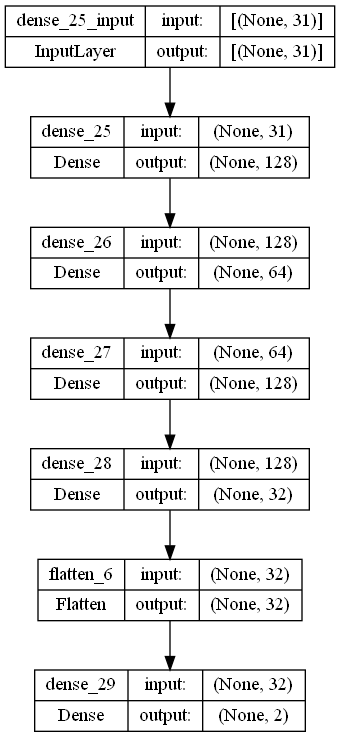

In [55]:
model.compile(loss = 'sparse_categorical_crossentropy',
             optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
             metrics = ['accuracy']
             )

tf.keras.utils.plot_model(model, show_shapes=True)

Epoch 1/200
34/34 [==============================] - 0s 4ms/step - loss: 0.7067 - accuracy: 0.4925
Epoch 2/200
34/34 [==============================] - 0s 4ms/step - loss: 0.6978 - accuracy: 0.5174
Epoch 3/200
34/34 [==============================] - 0s 4ms/step - loss: 0.6906 - accuracy: 0.5534
Epoch 4/200
34/34 [==============================] - 0s 4ms/step - loss: 0.6546 - accuracy: 0.6903
Epoch 5/200
34/34 [==============================] - 0s 4ms/step - loss: 0.5788 - accuracy: 0.7146
Epoch 6/200
34/34 [==============================] - 0s 4ms/step - loss: 0.5559 - accuracy: 0.7267
Epoch 7/200
34/34 [==============================] - 0s 4ms/step - loss: 0.5519 - accuracy: 0.7264
Epoch 8/200
34/34 [==============================] - 0s 3ms/step - loss: 0.5467 - accuracy: 0.7282
Epoch 9/200
34/34 [==============================] - 0s 4ms/step - loss: 0.5428 - accuracy: 0.7319
Epoch 10/200
34/34 [==============================] - 0s 4ms/step - loss: 0.5379 - accuracy: 0.7358
Epoch 11/

34/34 [==============================] - 0s 4ms/step - loss: 0.4509 - accuracy: 0.7880
Epoch 84/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4503 - accuracy: 0.7913
Epoch 85/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7813
Epoch 86/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4489 - accuracy: 0.7885
Epoch 87/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4502 - accuracy: 0.7897
Epoch 88/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4620 - accuracy: 0.7819
Epoch 89/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7848
Epoch 90/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4518 - accuracy: 0.7843
Epoch 91/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4504 - accuracy: 0.7871
Epoch 92/200
34/34 [==============================] - 0s 3ms/step - loss: 0.4540 - accuracy: 0.7810
Epoch 93/200


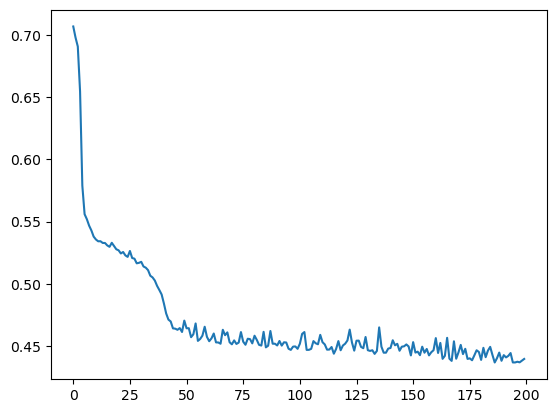

In [56]:
NUM_EPOCHS = 200
BATCH_SIZE = 256

hist = model.fit(trans_x_train, y_train_use, epochs=NUM_EPOCHS, batch_size = BATCH_SIZE)

plt.plot(hist.history['loss'])

In [57]:
[np.argmax(i) for i in model.predict(trans_x_test)]

134/134 [==============================] - 0s 1ms/step


[1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,


In [82]:
model.predict(trans_x_test)

134/134 [==============================] - 0s 1ms/step


array([[0.34507513, 0.65492487],
       [0.9732636 , 0.02673636],
       [0.00312349, 0.9968765 ],
       ...,
       [0.07453956, 0.9254604 ],
       [0.1010259 , 0.8989741 ],
       [0.28468135, 0.7153186 ]], dtype=float32)

In [83]:
sample['Transported'] = np.array([np.argmax(i) for i in model.predict(trans_x_test)]).astype('bool')

134/134 [==============================] - 0s 1ms/step


In [85]:
sample

,PassengerId,Transported
0,0013_01,True
1,0018_01,False
2,0019_01,True
3,0021_01,True
4,0023_01,True
...,...,...
4272,9266_02,True
4273,9269_01,False
4274,9271_01,True
4275,9273_01,True


In [20]:
#ACURACY ON KAGGLE is 0.78957
sample.to_csv('predicts.csv', index=False)